# Intro

The aim of the notebook is to present the impact of disretization on gaussian hidden markov model training, as well as investigate the possibilities of co-occurrence-based learning procedure.

## Plan

1. Define several Gaussian HMMs
2. Train my model using:
    - EM
    - co-occurrence (pay attention to SGD hyperparameters!)
3. Evaluate the results:
    - loglikelihood
    - accuracy
    - $d_{tv}$, KL on transition matrix
    - RMSE on means and covariance matrices
4. Repeat each experiments several (10) times, to understand the stability of proposed methods.
5. Present the results:
    - table summarising numerical results
    - visualize real/learned distribution
    - present data, nodes and clusters

## Setup

sprawdź czy są zera w parametrze kookurencji w torchu

In [1]:
import numpy as np
import pandas as pd
import scipy
import matplotlib.pyplot as plt
import seaborn as sns

import urllib
import itertools
from scipy.stats import multivariate_normal

from IPython.display import display, Markdown, Latex

from ssm.util import find_permutation
from ssm.plots import gradient_cmap, white_to_color_cmap

from hmmlearn import hmm
import sys
PROJECT_PATH = f"/ziob/klaudia/FlowHMM"
sys.path.insert(1, PROJECT_PATH)
from torchHMM.utils.utils import  total_variance_dist
from torchHMM.model.discretized_HMM import DiscreteHMM, DISCRETIZATION_TECHNIQUES,HmmOptim
LEARNING_ALGORITHMS = ["em", "cooc"]

In [2]:
sns.set_style("white")

with urllib.request.urlopen('https://xkcd.com/color/rgb.txt') as f:
    colors = f.readlines()
color_names = [str(c)[2:].split('\\t')[0] for c in colors[1:]]

colors = sns.xkcd_palette(color_names)
cmap = gradient_cmap(colors)

In [3]:
np.random.seed(42)

true_model = DiscreteHMM(n_components=3, covariance_type="full")
true_model.startprob_ = true_model.compute_stationary(np.array([[0.7, 0.2, 0.1],
                                    [0.3, 0.5, 0.2],
                                    [0.3, 0.3, 0.4]]))
true_model.transmat_ = np.array([[0.7, 0.2, 0.1],
                            [0.3, 0.5, 0.2],
                            [0.3, 0.3, 0.4]])

true_model.means_ = np.array([[0.0, 0.0, 0.0], [3.0, -3.0, -3.0], [4.0, 3.0, 3.0]])
true_model.covars_ = np.array([[[1, -.5, -0.5], [-.5, 2, -.5], [-.5, -.5, 1.2]], [[.6, -.5, -.3], [-.5, 1.2, .1], [-.3, .1, 2]], [[1.1, -.5, .5], [-.5, 2.1, .5], [.5, .5, 2.2]]]) * .8

In [4]:
X_train, Z_train = true_model.sample(100000)
X_test, Z_test = true_model.sample(1000)

## Define experiments

In [5]:
def plot_Q_from_model(model_):
    S_ = model_.transmat_ * model_.startprob_[:, np.newaxis]
    distributions_ = [
            scipy.stats.multivariate_normal(model_.means_[i], model_.covars_[i])
            for i in range(model_.n_components)
        ]

    B_ = np.concatenate(
            [
                dist.pdf(model_.nodes.T).reshape(
                    1, -1
                )
                for dist in distributions_
            ],
            axis=0,
        )
    B__ = B_ / B_.sum(1)[:, np.newaxis]
    return B__.T @ S_ @ B__

In [6]:
def kl_divergence(p, q):
    return np.sum(np.where(p != 0, p * np.log(p / q), 0))



## random



### random n=20

d_tv: 0.25696221674114345
KL: 0.21569456313202973


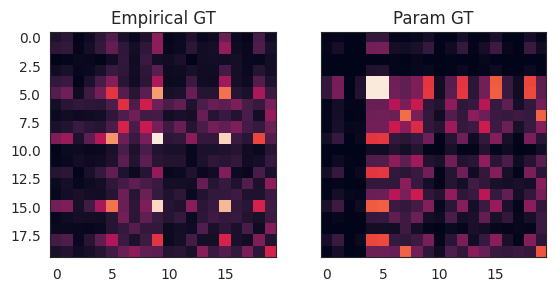



## latin_cube_u



### latin_cube_u n=20

/tmp/ipykernel_2729049/152888981.py:2: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.where(p != 0, p * np.log(p / q), 0))
/tmp/ipykernel_2729049/152888981.py:2: RuntimeWarning: invalid value encountered in multiply
  return np.sum(np.where(p != 0, p * np.log(p / q), 0))


d_tv: 0.5161944244609019
KL: 4.348113465081358


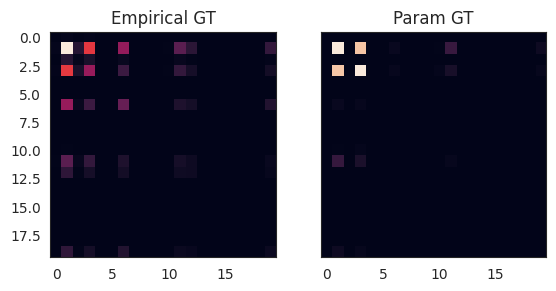



## latin_cube_q



### latin_cube_q n=20

d_tv: 0.4879062479692807
KL: 1.357881306211231


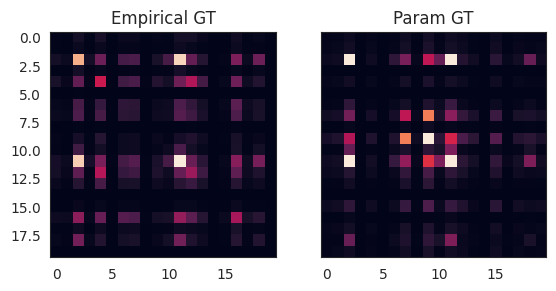



## uniform



### uniform n=20

d_tv: 0.6101626076107074
KL: 2.6042049813011996


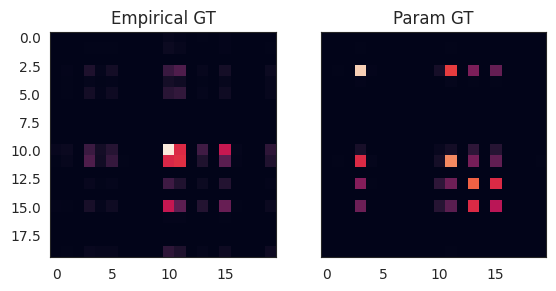



## grid



### grid n=20

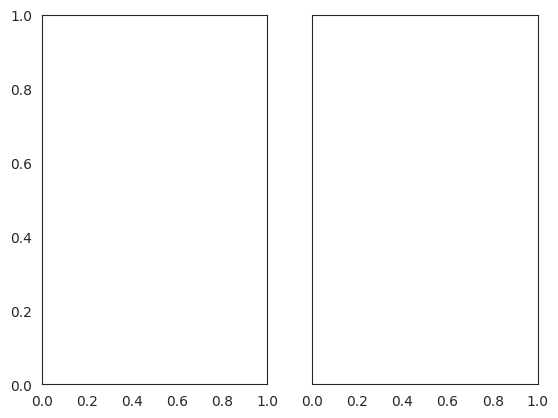

In [10]:
# TODO: znajdź gdzie jest niespójne
n = 20
res = []
for discretize_meth in DISCRETIZATION_TECHNIQUES:
    display(Markdown(f"\n\n## {discretize_meth}"))
    # for n in [20, 100, 200, 1000]:
    for n in [20]:
        display(Markdown(f"\n\n### {discretize_meth} n={n}"))
        # for i in range(10):
        for i in range(1):
            try:
                fig, (ax0, ax1) = plt.subplots(1, 2, sharey=True)
                model = DiscreteHMM(discretize_meth, n, n_components=3, learning_alg='cooc', verbose=True, params="", init_params="",
                                    optim_params=dict(max_epoch=50000, lr=0.1, weight_decay=0), n_iter=100)

                model.startprob_ = true_model.startprob_
                model.transmat_ = true_model.transmat_

                model.means_ = true_model.means_
                model.covars_ = true_model.covars_

                model._init(X_train)

                torch_model = model.model
                torch_model.eval()

                Xd = model.discretize(X_train, True)

                # true_model.nodes = model.nodes

                Q_cooc = model._cooccurence(Xd)
                vmin, vmax = Q_cooc.min(), Q_cooc.max()
                ax0.imshow(Q_cooc, vmin=vmin, vmax=vmax)
                ax0.set_title("Empirical GT")

                # Q_model = plot_Q_from_model(model)
                # vmin, vmax = Q_model.min(), Q_model.max()
                # ax3.imshow(Q_model, vmin=vmin, vmax=vmax)
                # ax3.set_title("Param (my) GT")

                Q_true_model = plot_Q_from_model(model)
                ax1.imshow(Q_true_model, vmin=vmin, vmax=vmax)
                ax1.set_title("Param GT")

                # Q_torch = torch_model.forward(model.nodes).detach().numpy()
                # ax2.imshow(Q_torch, vmin=vmin, vmax=vmax)
                # ax2.set_title("Torch GT")
                dtv = np.abs(Q_cooc - Q_true_model).sum() / 2
                kl = kl_divergence(Q_cooc, Q_true_model)
                print(f"d_tv: {dtv}")
                print(f"KL: {kl}")

                res.append({
                    'nodes': discretize_meth,
                    'no_nodes': n,
                    'dtv': dtv,
                    'kl': kl
                })
                # print(f"d_tv 0-2: {np.abs(Q_cooc - Q_torch).sum() / 2}")
                # print(f"d_tv 0-3: {np.abs(Q_cooc - Q_model).sum() / 2}")
                # print(f"d_tv 1-2: {np.abs(Q_true_model - Q_torch).sum() / 2}")
                # print(f"d_tv 1-3: {np.abs(Q_true_model - Q_model).sum() / 2}")
                plt.show()
            except:
                pass

In [9]:
res = []



## random



### random n=9

d_tv: 0.10449994447535312
KL: 0.041546893907000546


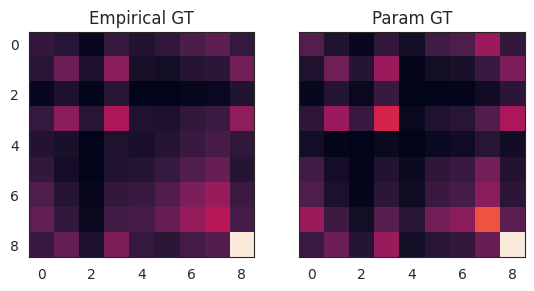

d_tv: 0.1999176773998527
KL: 0.12322782991273107


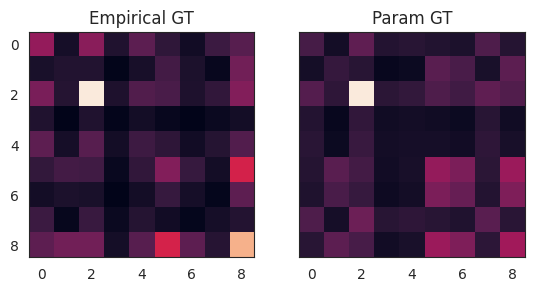

d_tv: 0.20117329433856143
KL: 0.1315907043205916


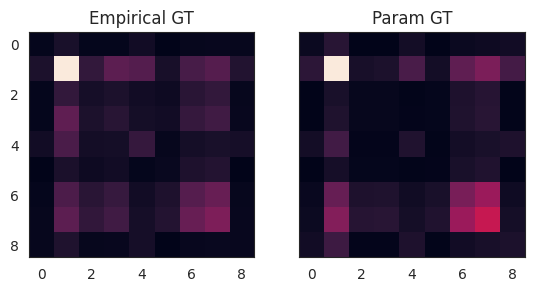

d_tv: 0.32293711227521543
KL: 0.33959720607301536


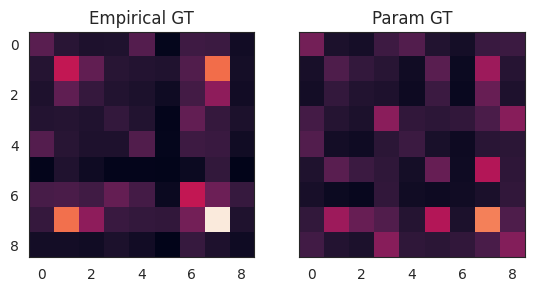

d_tv: 0.1960467567400248
KL: 0.10096560381395876


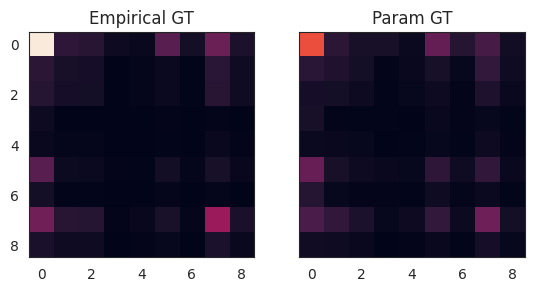

d_tv: 0.24889353280863977
KL: 0.2166061928884097


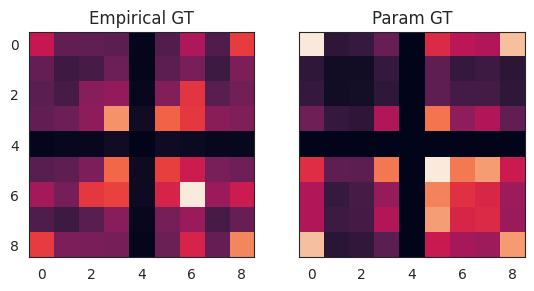

d_tv: 0.20214111787844882
KL: 0.15639906699221598


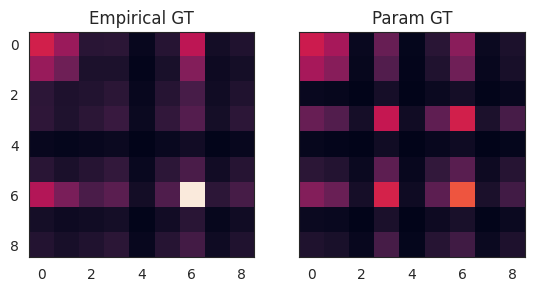

d_tv: 0.1643907339831842
KL: 0.15764942441948082


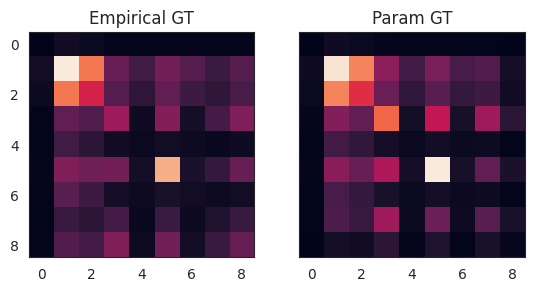

d_tv: 0.21778857154666262
KL: 0.1469495209779372


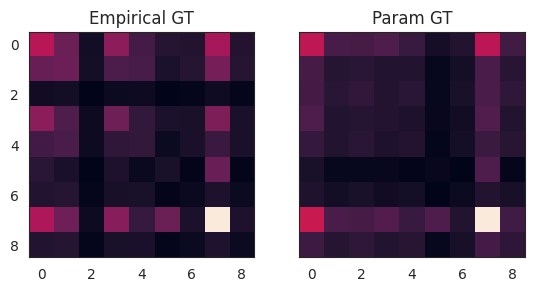

d_tv: 0.1565740477355891
KL: 0.07754315416292076


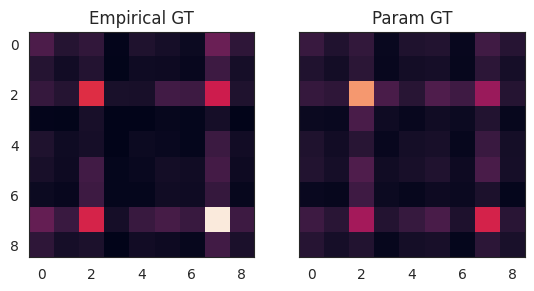



### random n=16

d_tv: 0.19542249595422811
KL: 0.12168112387269356


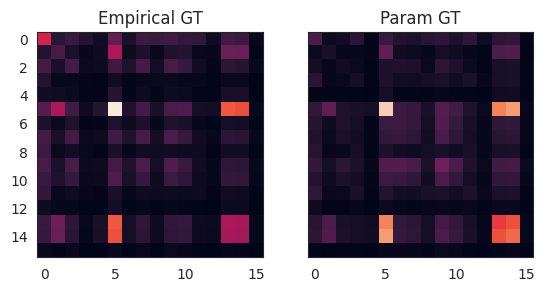

d_tv: 0.16608161442289837
KL: 0.12320352172858531


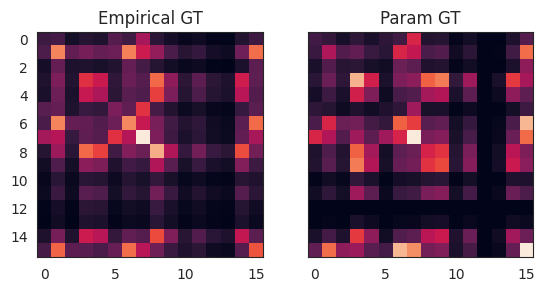

d_tv: 0.23492568743604145
KL: 0.1741409173228298


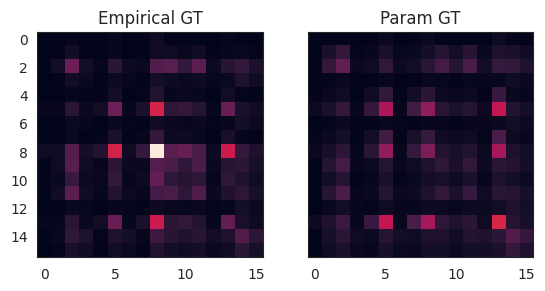

d_tv: 0.3607451408792089
KL: 0.44428811571812277


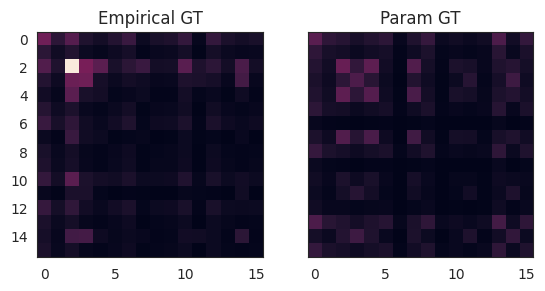

d_tv: 0.2831705751379318
KL: 0.3269423528999506


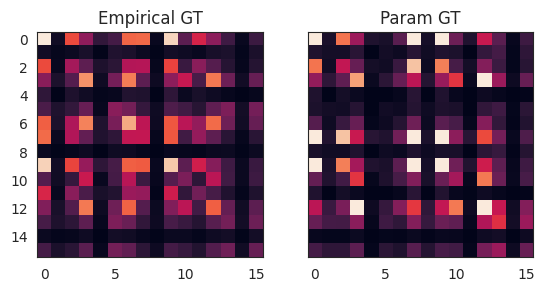

d_tv: 0.24763557431013666
KL: 0.23704363514400195


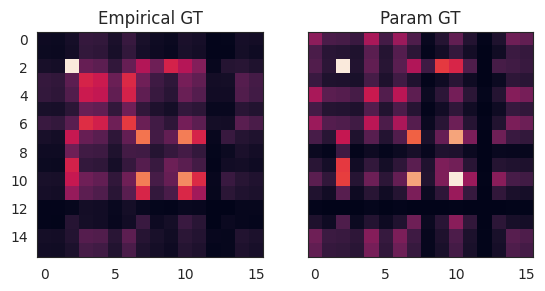

d_tv: 0.24547583883528543
KL: 0.1929943533188612


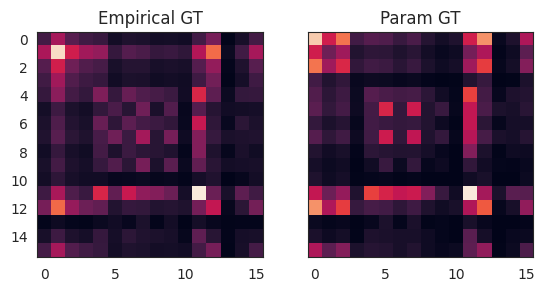

d_tv: 0.15009948596388364
KL: 0.07253518972195952


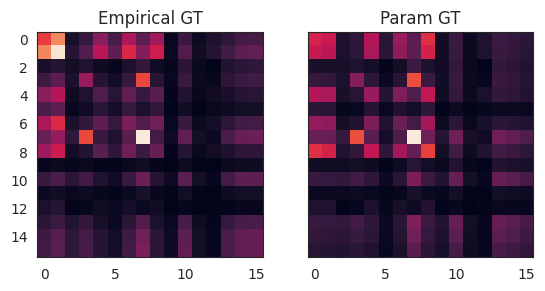

d_tv: 0.2737581261017619
KL: 0.23747251115902962


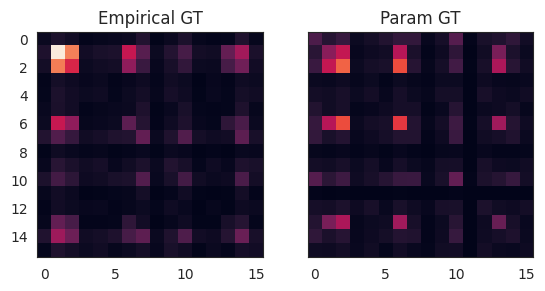

d_tv: 0.28768896931292587
KL: 0.2986927214445362


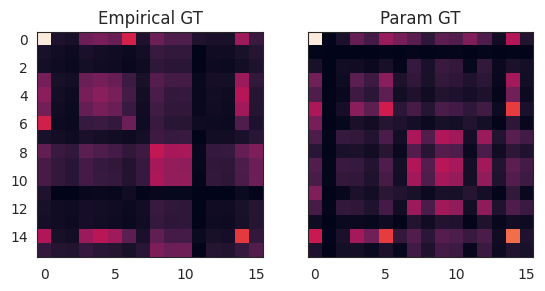



### random n=25

d_tv: 0.2686532587286066
KL: 0.2746288398763146


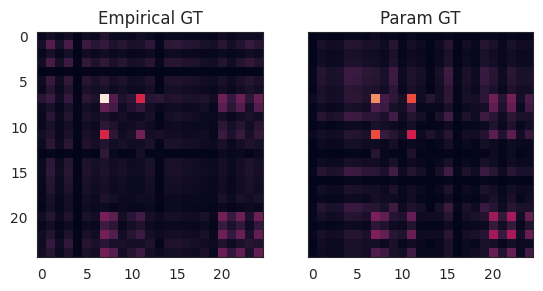

d_tv: 0.2845940776707929
KL: 0.28446544858959144


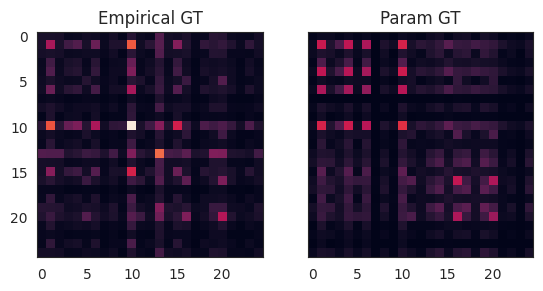

d_tv: 0.26409994576393026
KL: 0.22820810097642047


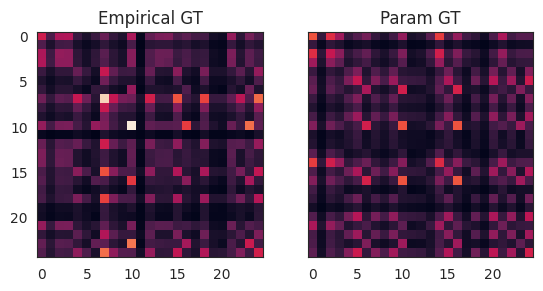

d_tv: 0.3435363905090403
KL: 0.4443377012351947


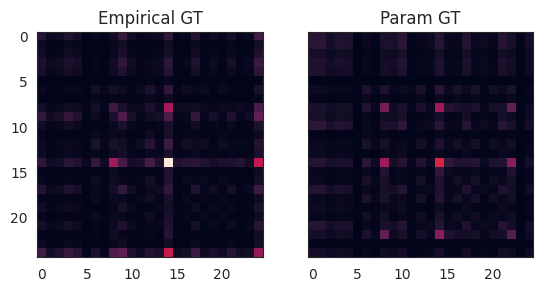

d_tv: 0.203069938601369
KL: 0.16727640452145287


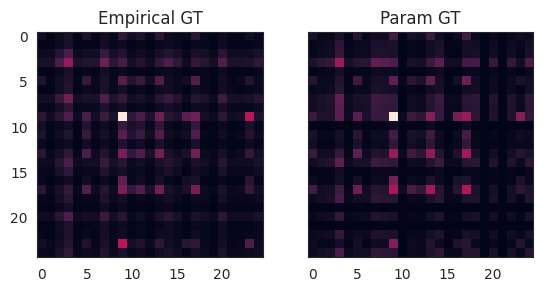

d_tv: 0.21728073574489054
KL: 0.19292223433821198


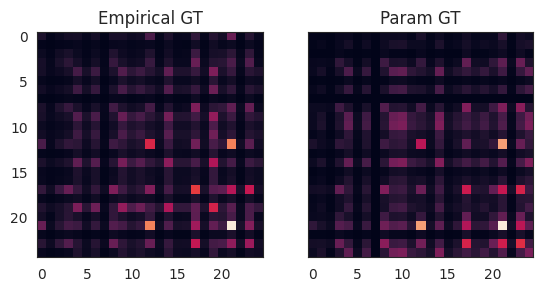

d_tv: 0.3722824450554876
KL: 0.48433633193270154


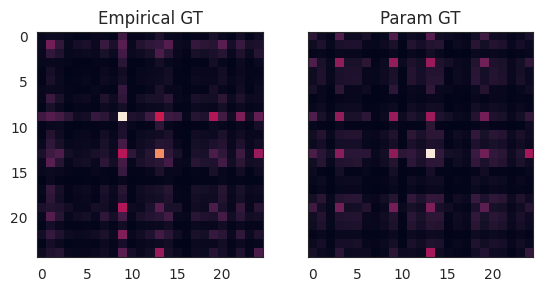

d_tv: 0.3272641042322612
KL: 0.3911752757797198


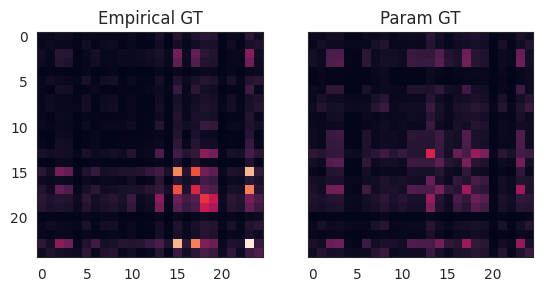

d_tv: 0.3605731993996032
KL: 0.4581949033055356


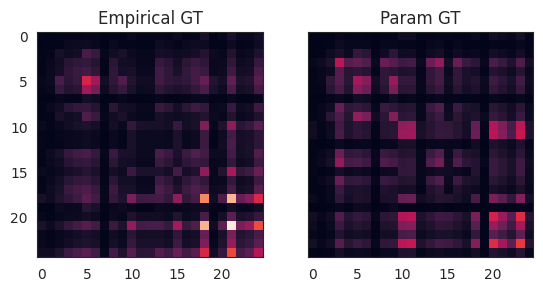

d_tv: 0.4411468527363841
KL: 0.7633787390023338


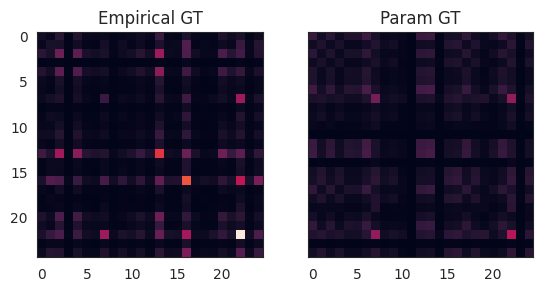



### random n=64

d_tv: 0.37056270341685077
KL: 0.4807753181973806


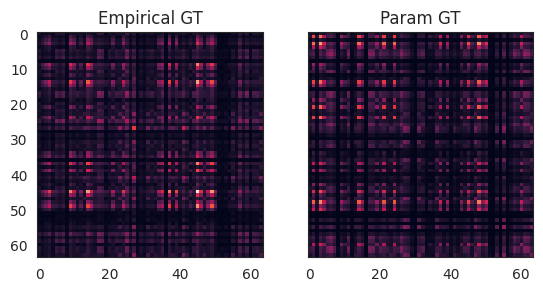

d_tv: 0.3391039895564042
KL: 0.39133463660564927


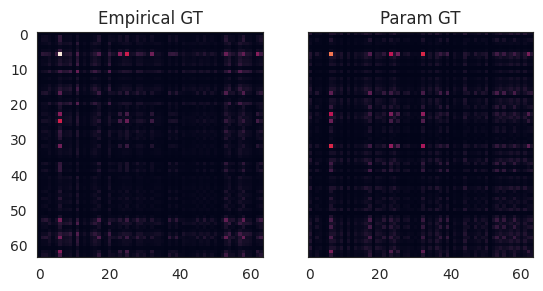

d_tv: 0.36305828084723235
KL: 0.4481331533728553


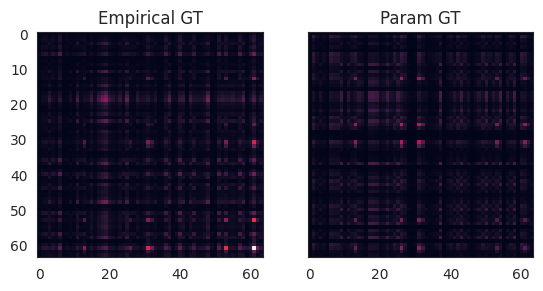

d_tv: 0.35195892592986244
KL: 0.41621748935717034


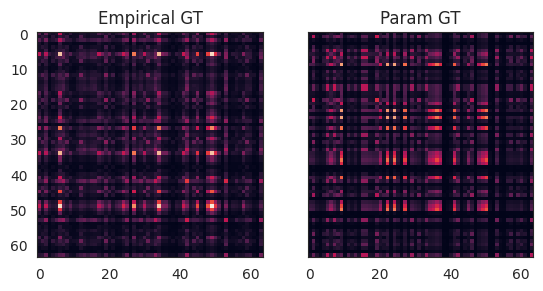

d_tv: 0.32062709664067424
KL: 0.36220871988920894


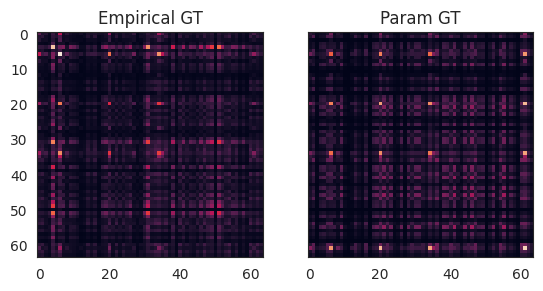

d_tv: 0.3486459482671508
KL: 0.4032091219437664


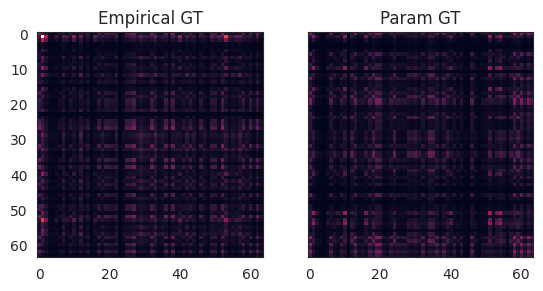

d_tv: 0.3115207560457899
KL: 0.34169409995387157


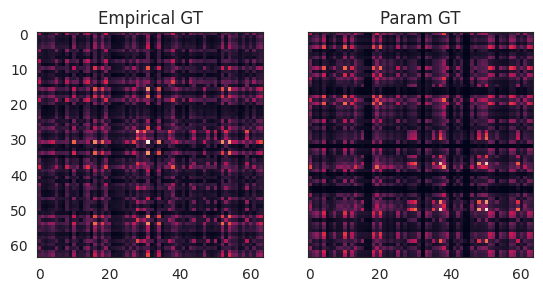

d_tv: 0.38068529042985993
KL: 0.49322709249449287


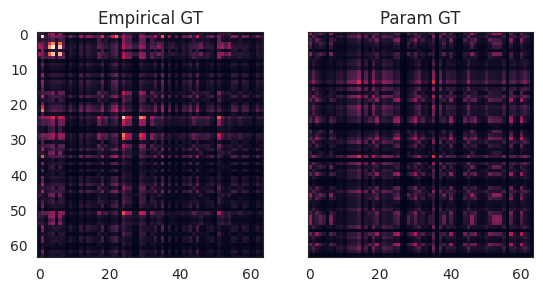

d_tv: 0.35878349299635587
KL: 0.4180313910463819


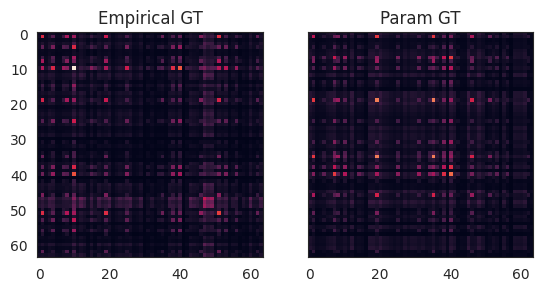

d_tv: 0.37395056558438383
KL: 0.4953989486383029


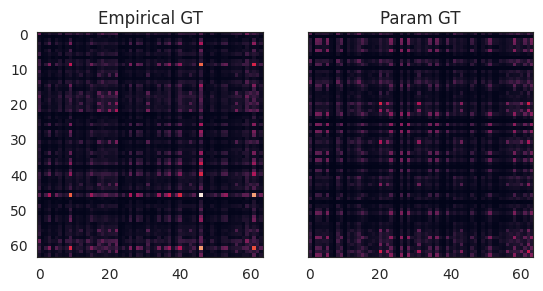



### random n=100

/tmp/ipykernel_2424639/152888981.py:2: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.where(p != 0, p * np.log(p / q), 0))
/tmp/ipykernel_2424639/152888981.py:2: RuntimeWarning: invalid value encountered in multiply
  return np.sum(np.where(p != 0, p * np.log(p / q), 0))


d_tv: 0.36532434471295183
KL: 0.47254573907078123


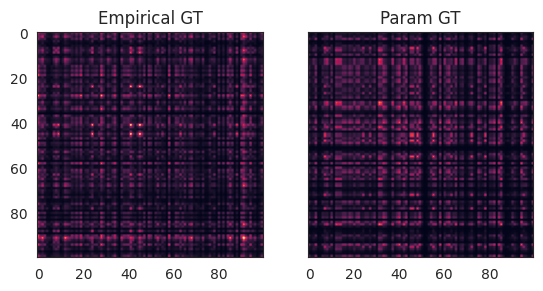

d_tv: 0.36693148748646187
KL: 0.4796888758749052


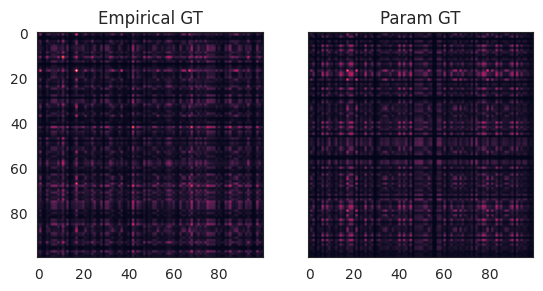

d_tv: 0.42630507480416097
KL: 0.6861748484147128


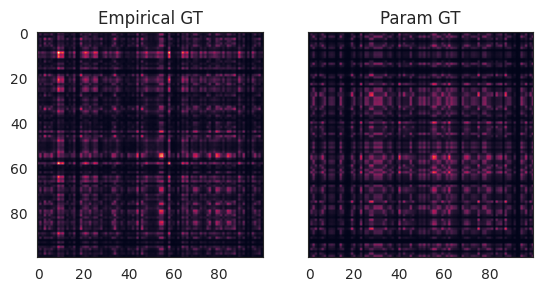

d_tv: 0.39014822246999903
KL: 0.5087276922460241


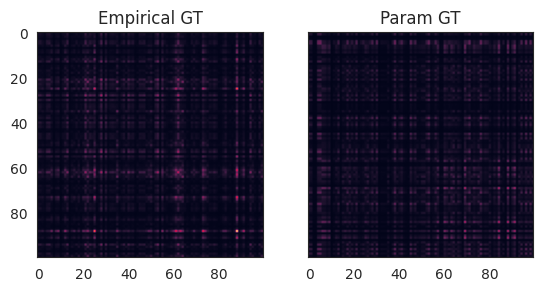

d_tv: 0.3522408829459911
KL: 0.4258106334889966


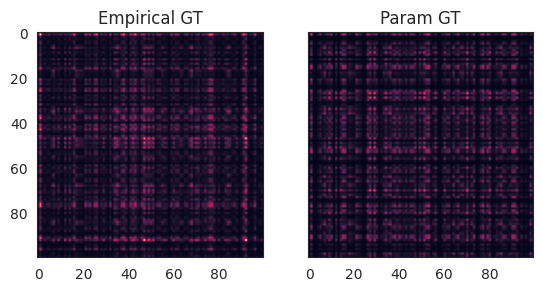

d_tv: 0.3369604705523868
KL: 0.4042390622314511


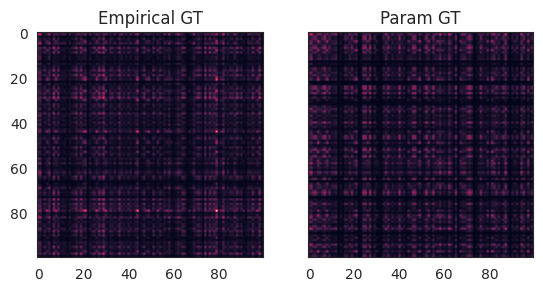

d_tv: 0.4111096419816677
KL: 0.583289914727712


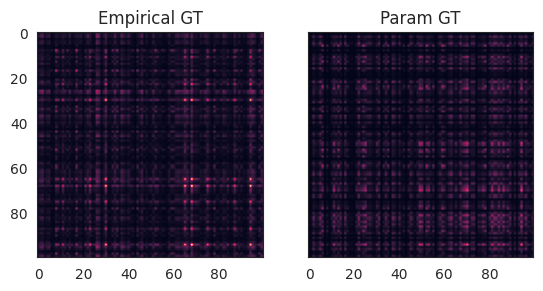

d_tv: 0.3650655252681856
KL: 0.4353345442732754


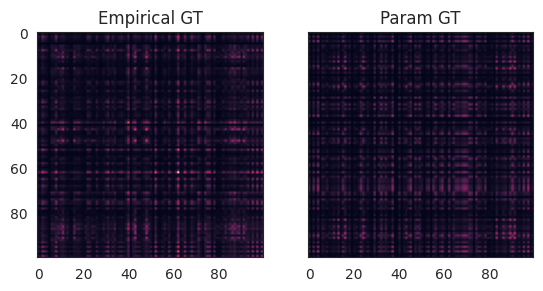

d_tv: 0.3611533269841736
KL: 0.45989208107191865


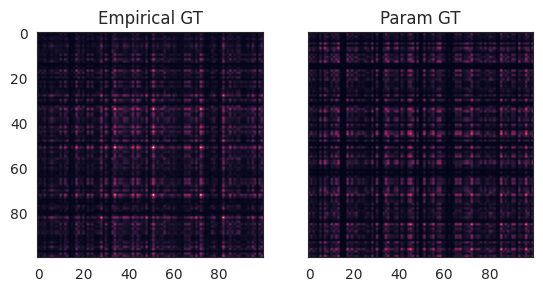

d_tv: 0.4560438308289273
KL: 0.7488645079928071


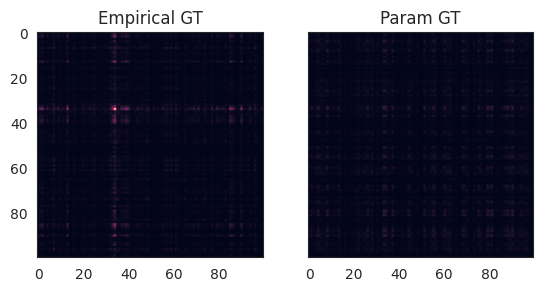



### random n=400

d_tv: 0.4377252805880307
KL: 0.741307024780628


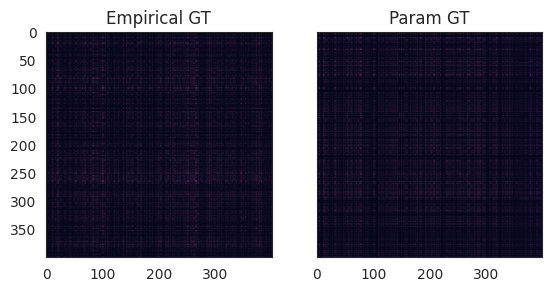

d_tv: 0.442866562186709
KL: 0.7592726667843747


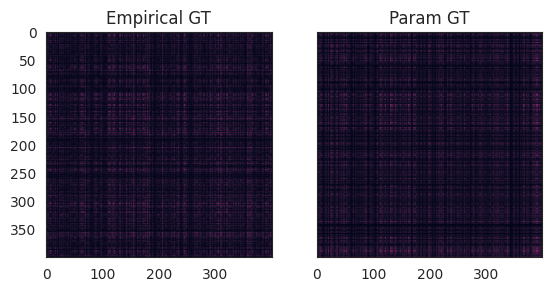

d_tv: 0.447165826334062
KL: 0.7356682985629746


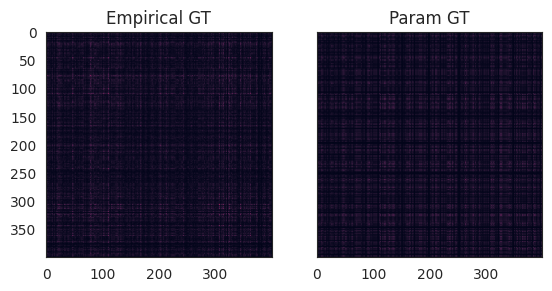

d_tv: 0.434544885565419
KL: 0.7195337600808295


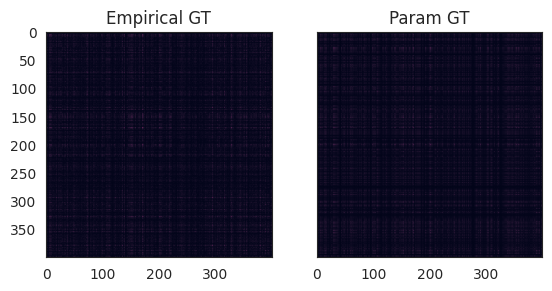

d_tv: 0.43230516706444294
KL: 0.7190147315018628


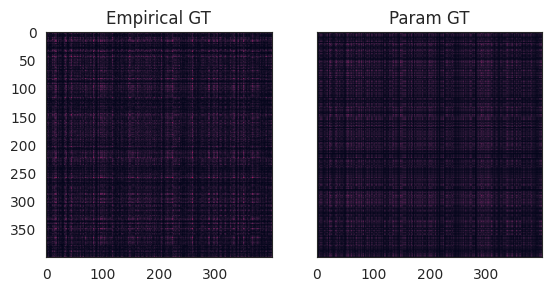

d_tv: 0.4513694087327944
KL: 0.758482016417149


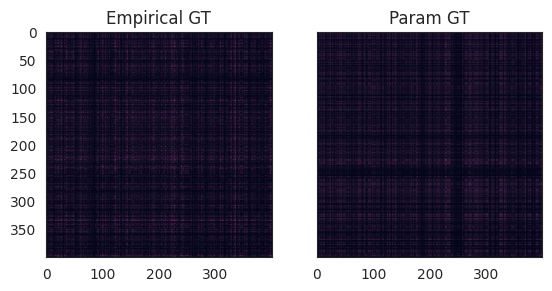

d_tv: 0.4621670584785834
KL: 0.8171157653441109


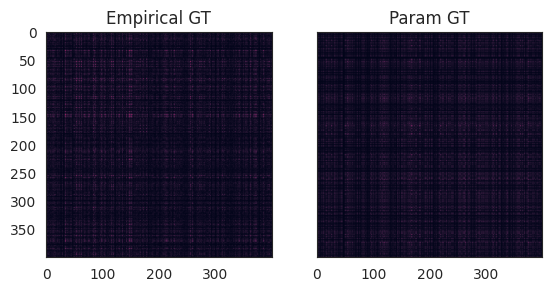

d_tv: 0.45682545515376644
KL: 0.7949460601585672


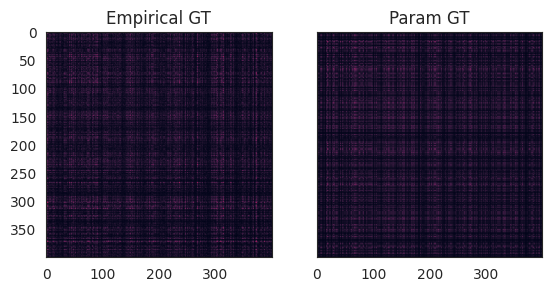

d_tv: 0.43318631289634374
KL: 0.7340499372846457


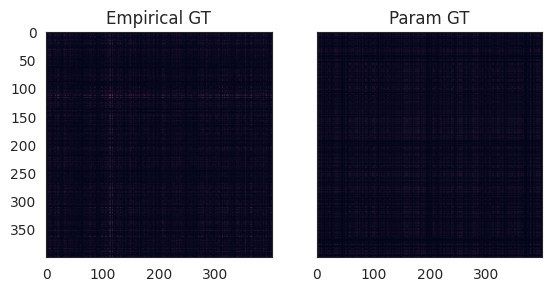

d_tv: 0.45233605743879646
KL: 0.759838022451501


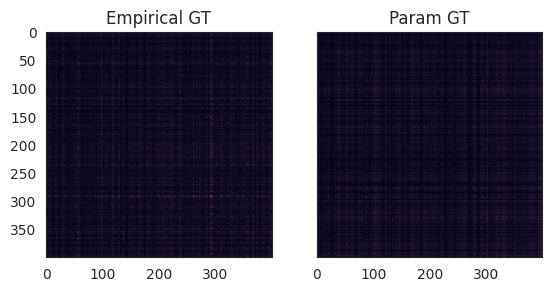



### random n=900

d_tv: 0.5403773255248592
KL: 1.128905597588215


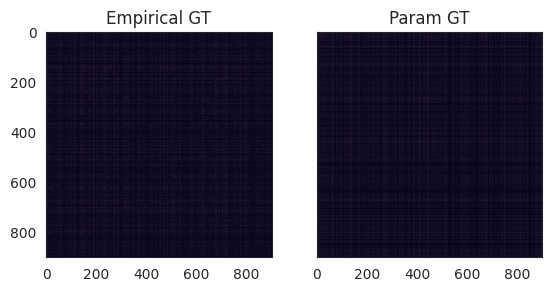

d_tv: 0.5380478679462192
KL: 1.1349195335317996


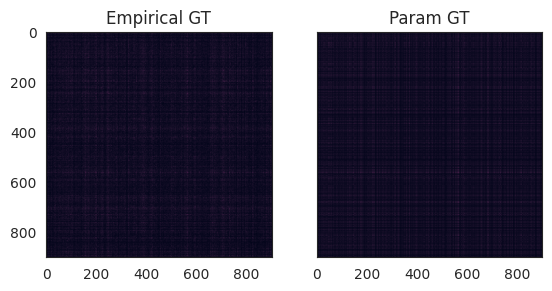

d_tv: 0.5372251435126001
KL: 1.123944149438335


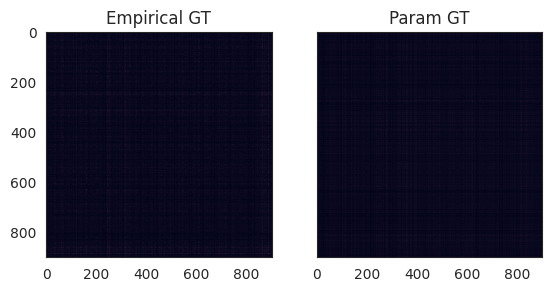

d_tv: 0.524819028110464
KL: 1.0707331029129092


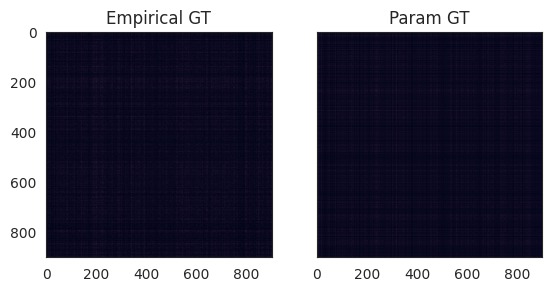

d_tv: 0.5253170799939243
KL: 1.0839159478071358


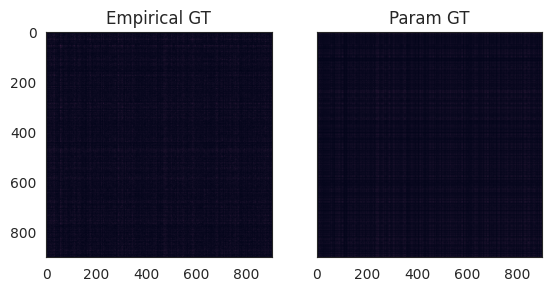

d_tv: 0.5457027581913609
KL: 1.157678173692065


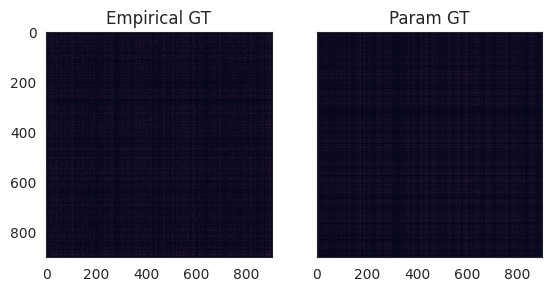

d_tv: 0.5175944415283382
KL: 1.053666259539699


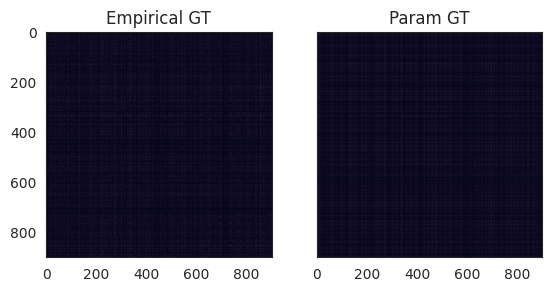

d_tv: 0.5421377773352871
KL: 1.138042473230268


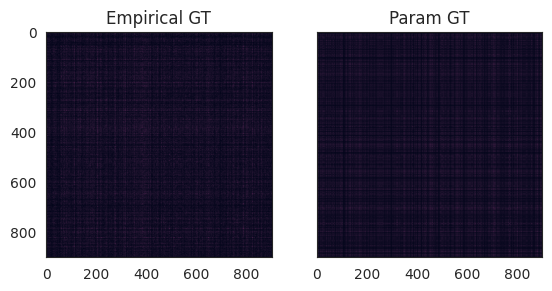

d_tv: 0.5455739668695497
KL: 1.1757220607624377


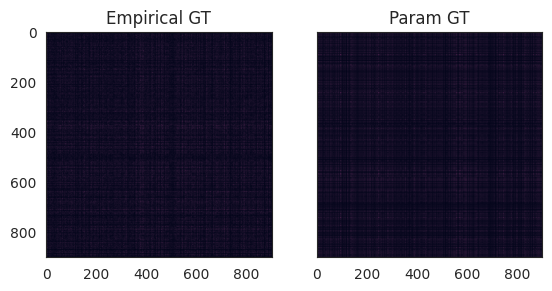

d_tv: 0.5398740459159508
KL: 1.1318854358724655


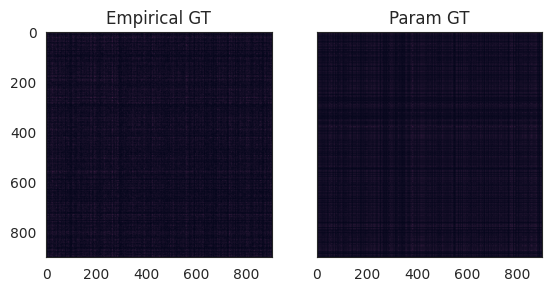



## latin_cube_u



### latin_cube_u n=9

d_tv: 0.05738802125908222
KL: 0.4251679443879782


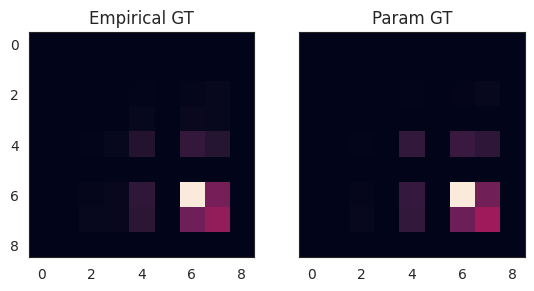

d_tv: 0.09949527017732698
KL: 0.06787306809352572


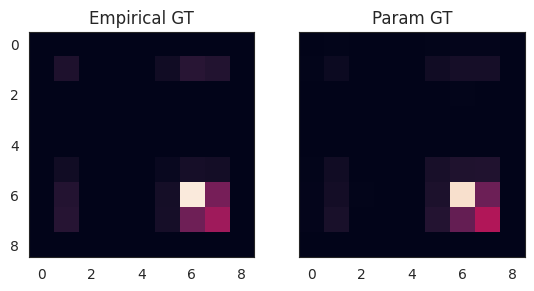

d_tv: 0.28514461558244114
KL: 0.5867384640669413


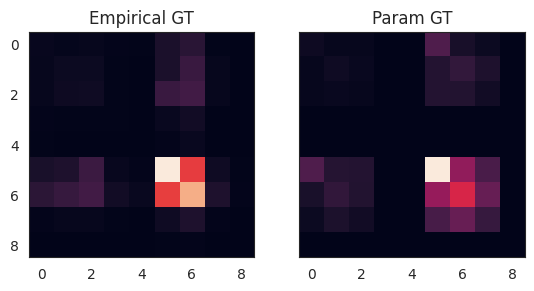

d_tv: 0.28692242584809713
KL: 0.5660315730965508


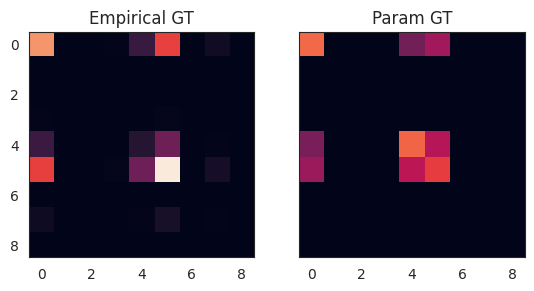

d_tv: 0.43187848414559604
KL: 0.9386869077079


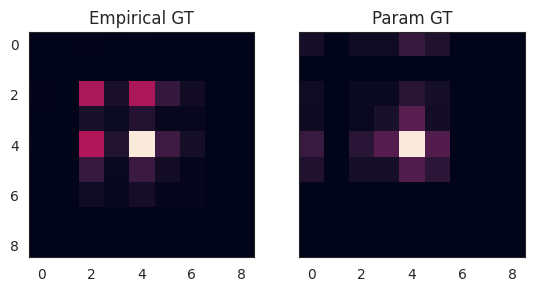

d_tv: 0.47955541422636955
KL: 0.6890979054147184


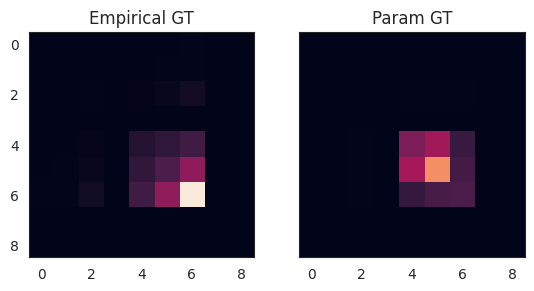

d_tv: 0.2707403766799106
KL: 0.4191461349296039


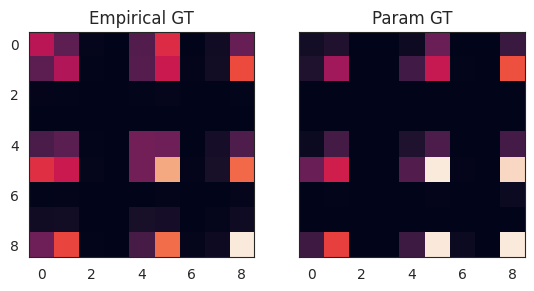

d_tv: 0.16097475143568632
KL: 0.5228167972576652


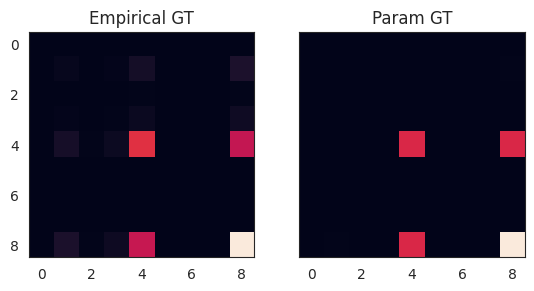

d_tv: 0.2395553839576619
KL: 0.32249697722119985


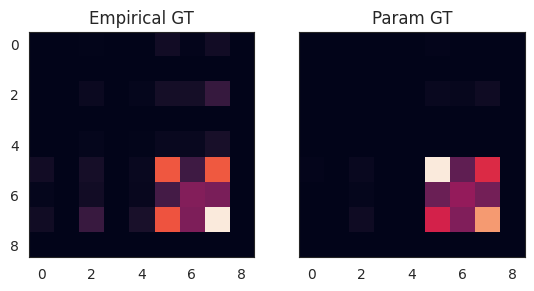

d_tv: 0.07919293289198627
KL: 0.4049463135700513


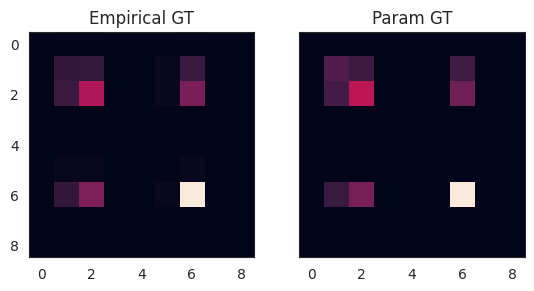



### latin_cube_u n=16

d_tv: 0.24080801138433128
KL: 0.36892868289993486


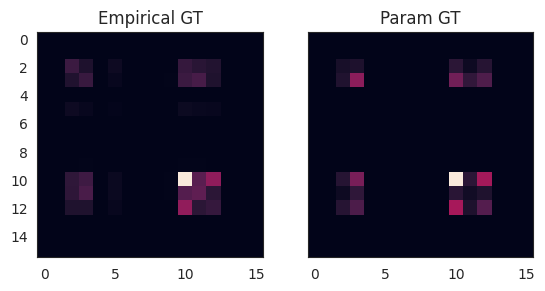

d_tv: 0.47819036185641717
KL: 2.8051578051991792


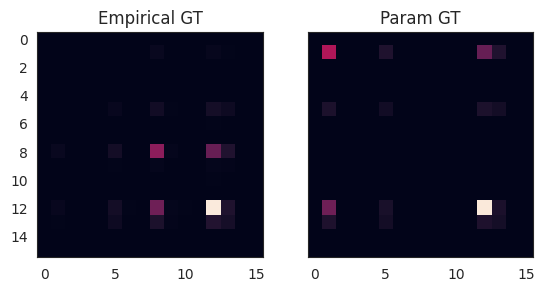

d_tv: 0.20800376936471104
KL: 0.2521379252739244


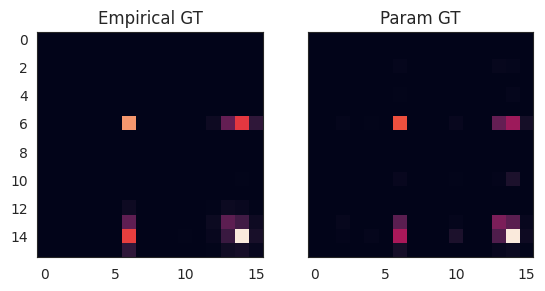

d_tv: 0.2540674609763964
KL: 0.36100509839760797


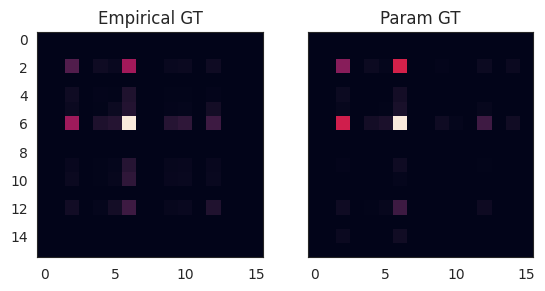

d_tv: 0.24413770401273233
KL: 0.4420313411555427


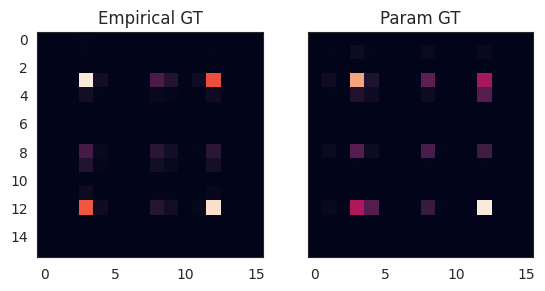

d_tv: 0.26573327215547254
KL: 0.49273989578447


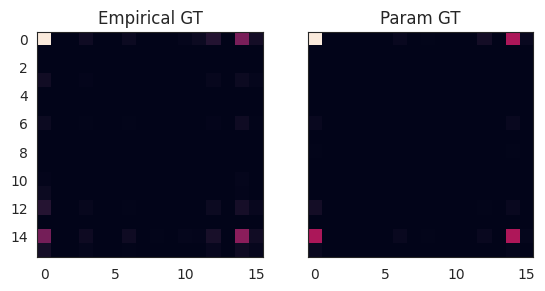

d_tv: 0.24263373395598456
KL: 0.33425891047597445


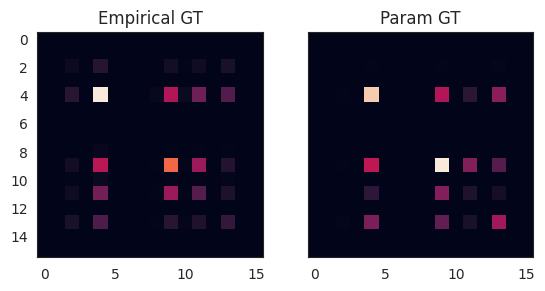

d_tv: 0.2575893274590058
KL: 0.3015299219544272


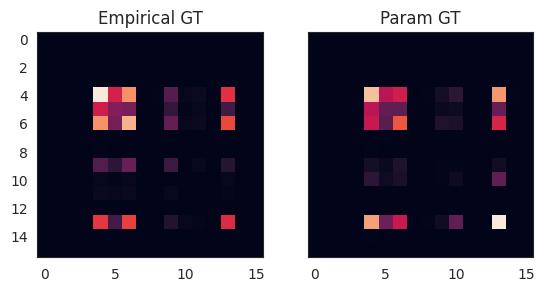

d_tv: 0.29480544347491855
KL: 0.6282608803889671


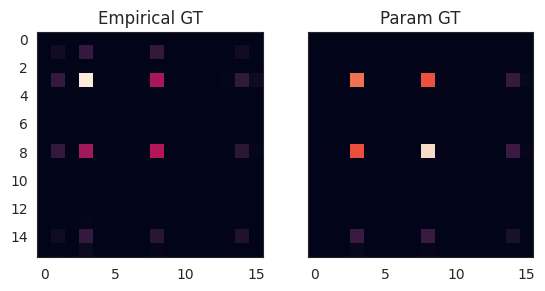

d_tv: 0.2581234420682388
KL: 0.2758293538275935


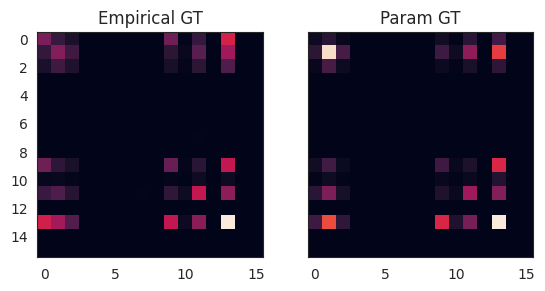



### latin_cube_u n=25

d_tv: 0.3904116516627084
KL: 0.6079275750974713


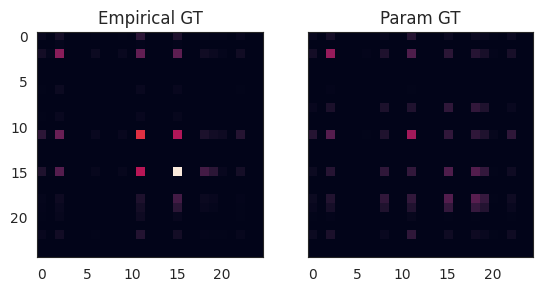

d_tv: 0.25436067632470305
KL: 0.7194864609868199


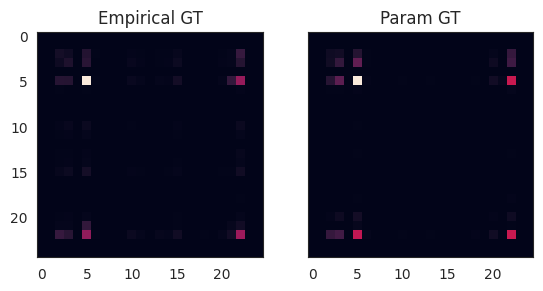

d_tv: 0.3143248990272056
KL: 0.5255025321334513


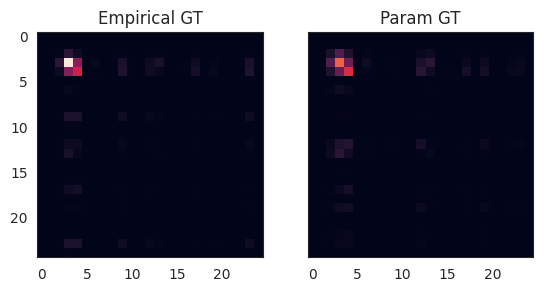

d_tv: 0.42262155519808153
KL: 0.6357455476640921


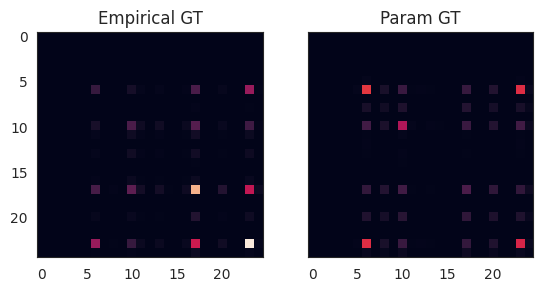

d_tv: 0.3508616196688289
KL: 0.5068737485801866


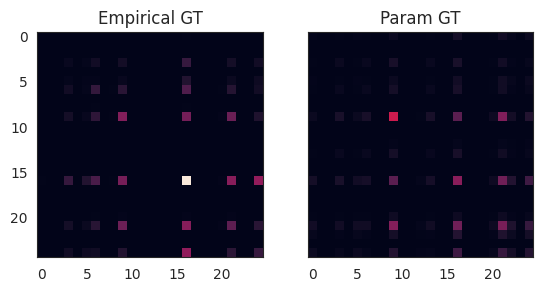

d_tv: 0.37607470213344113
KL: 0.4872120992662359


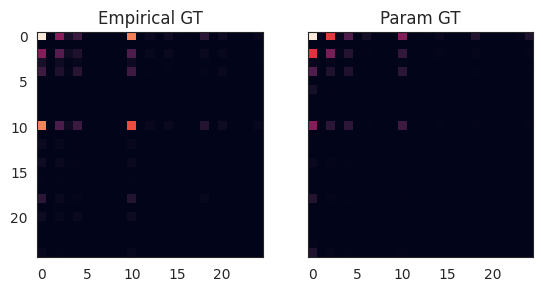

d_tv: 0.20230435531012753
KL: 0.49949106349103983


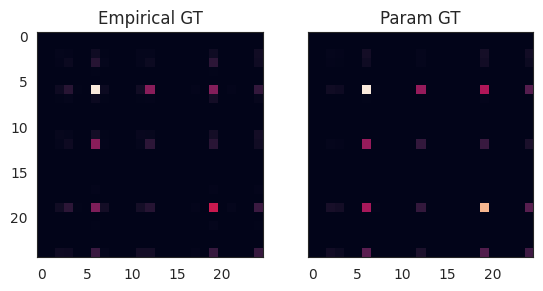

d_tv: 0.5573047163644973
KL: 1.560690118177325


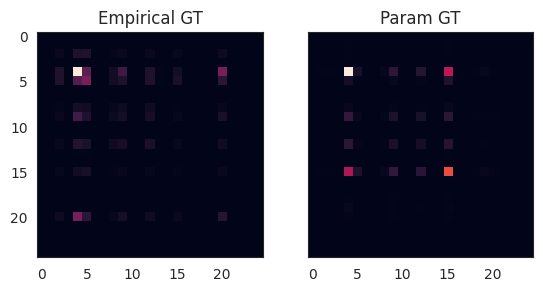

d_tv: 0.2657559464027885
KL: 0.7645411531041518


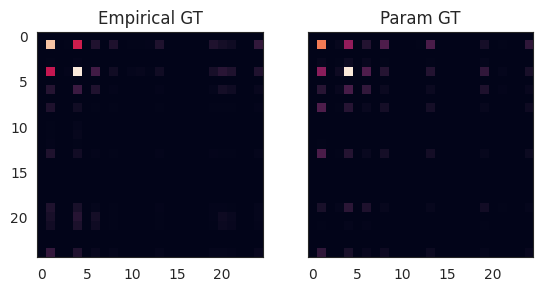

d_tv: 0.40953152359778144
KL: 0.5659917587912947


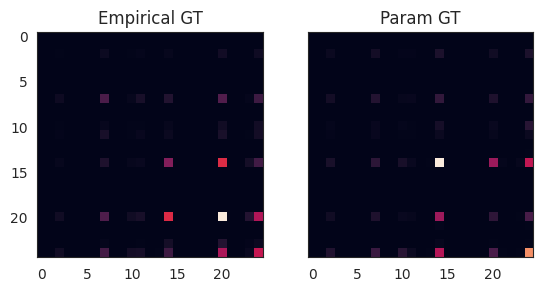



### latin_cube_u n=64

d_tv: 0.3257870579550612
KL: 0.6662066874952596


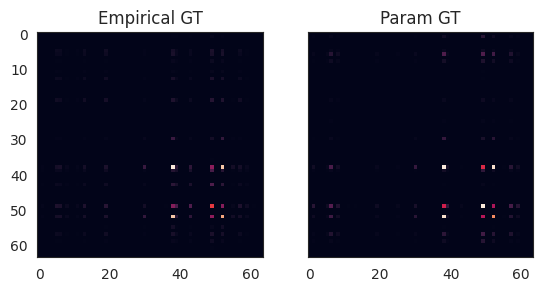

d_tv: 0.3414811743237027
KL: 0.6200610503445678


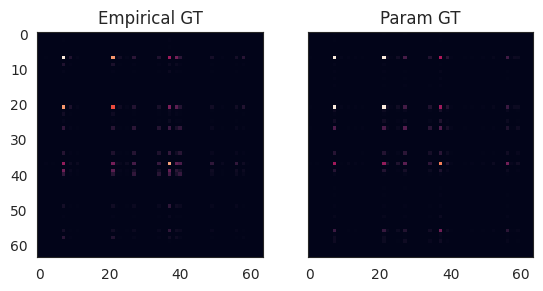

d_tv: 0.4693756850315876
KL: 0.6753337169715286


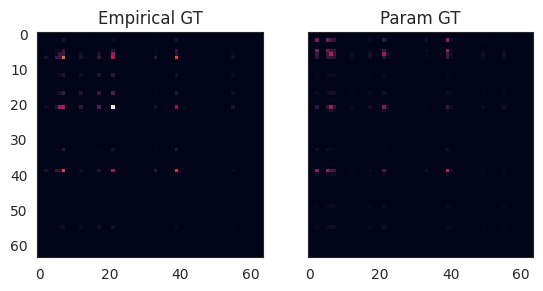

d_tv: 0.5487775274637378
KL: 1.7195767357799143


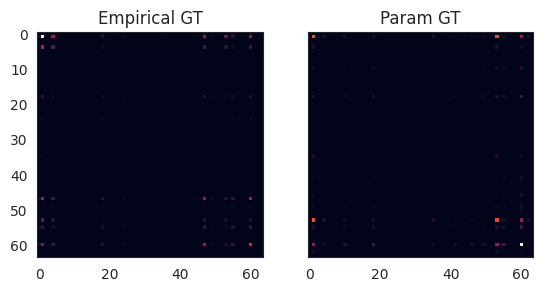

d_tv: 0.4023788517358929
KL: 0.7522990238494964


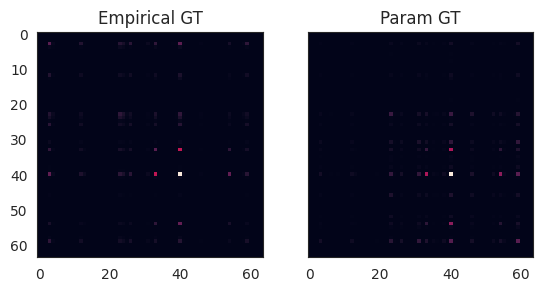

d_tv: 0.3580288587224832
KL: 0.5719549003957525


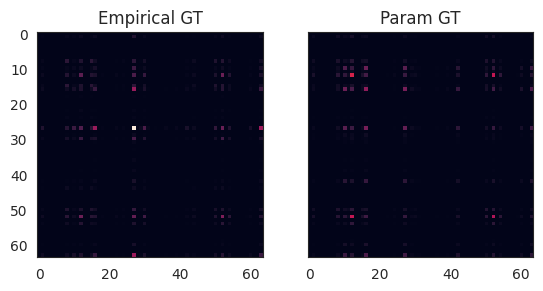

d_tv: 0.4159050552590009
KL: 0.6846881693312441


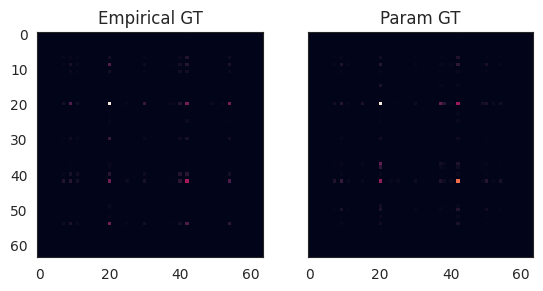

d_tv: 0.25810763322464136
KL: 0.484097097881351


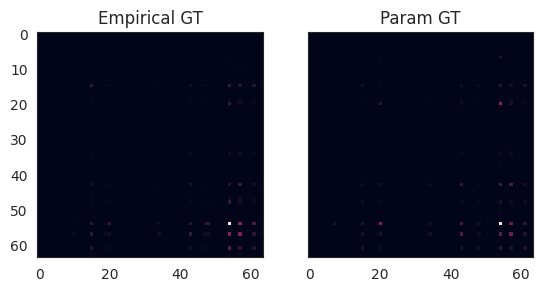

d_tv: 0.3446719450476434
KL: 0.4683715520526469


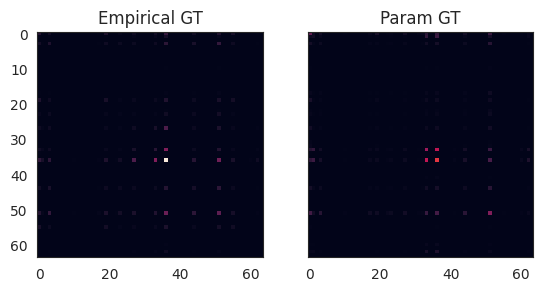

d_tv: 0.31812178553997816
KL: 0.44857633187642265


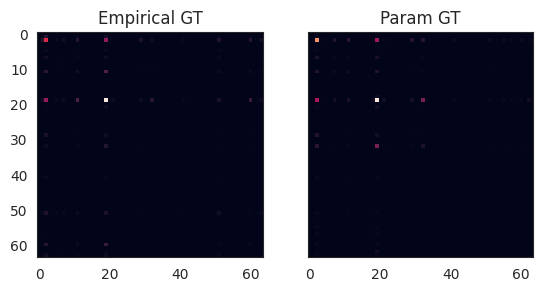



### latin_cube_u n=100

d_tv: 0.2620576555002174
KL: 0.37757754168549773


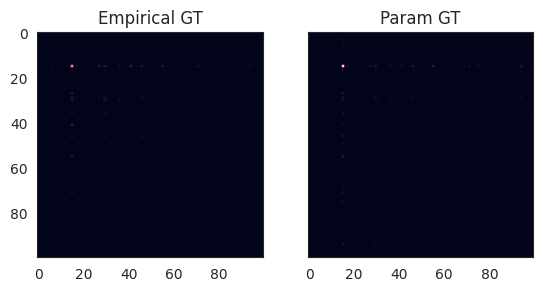

d_tv: 0.3900422056455822
KL: 0.6229168378856188


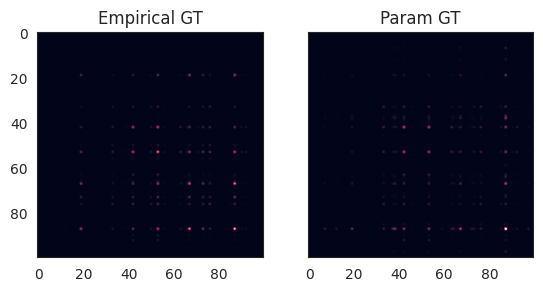

d_tv: 0.34796409232543074
KL: 0.4895518769347628


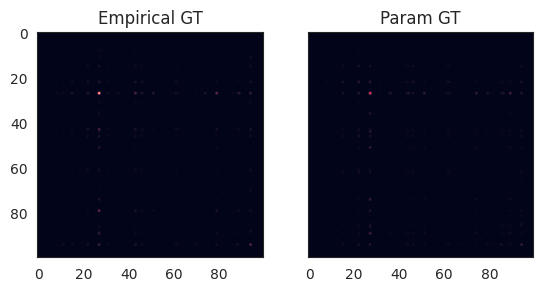

d_tv: 0.4423553845026177
KL: 0.6636812376984874


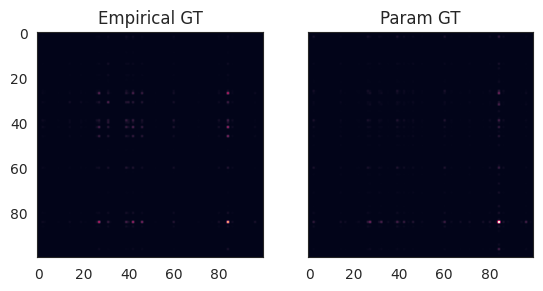

d_tv: 0.4449598306090254
KL: 0.8318432588885103


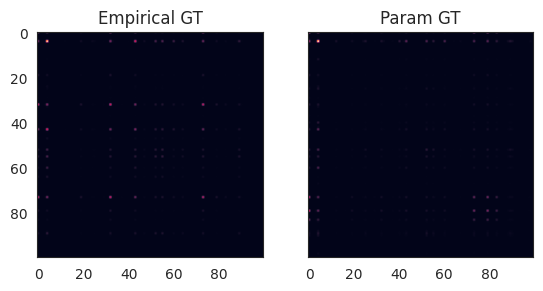

d_tv: 0.4185321611950731
KL: 0.5935329243988758


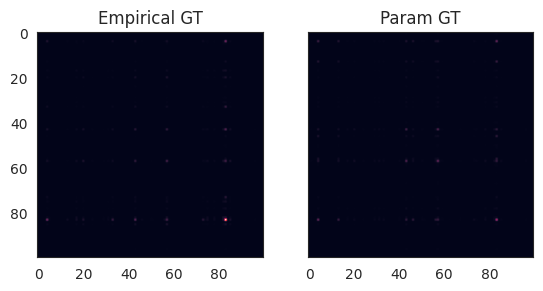

d_tv: 0.4415996096003696
KL: 0.7212620424751288


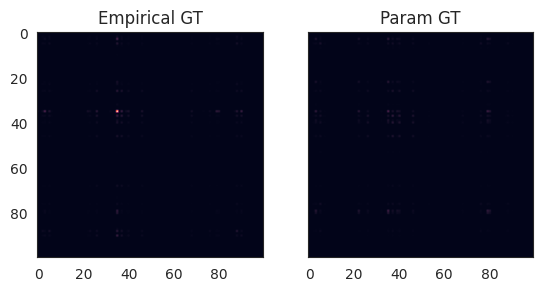

d_tv: 0.4086199628783517
KL: 0.7267956203837889


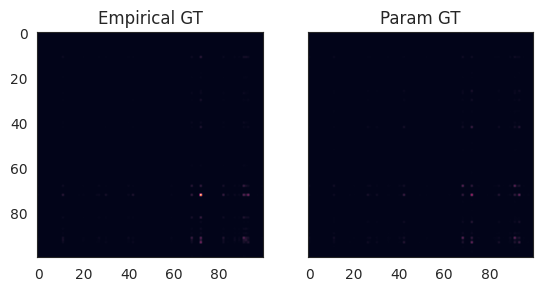

d_tv: 0.34148145052368317
KL: 0.4422679413183962


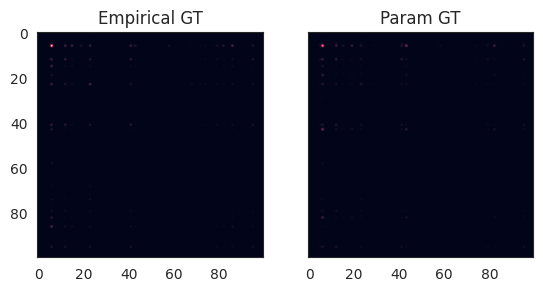

d_tv: 0.3901388547594442
KL: 0.6244295142258689


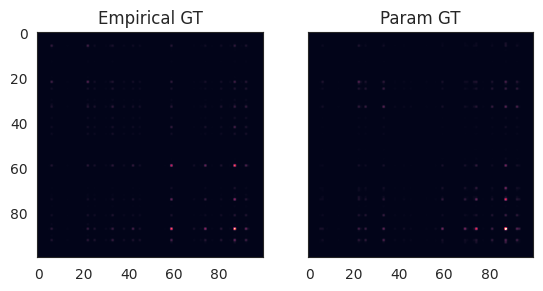



### latin_cube_u n=400

d_tv: 0.5227915846432767
KL: 0.9742847254945488


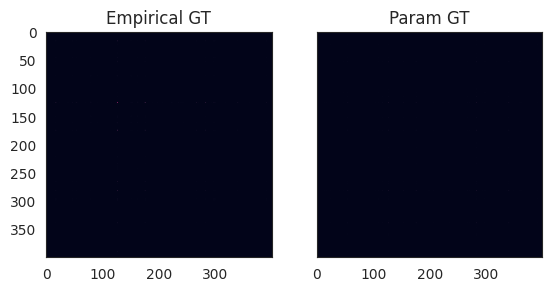

d_tv: 0.6199196946476473
KL: 1.5175650851772635


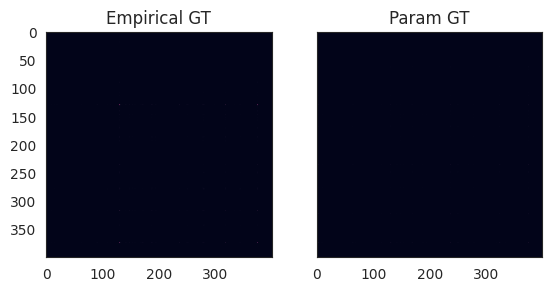

d_tv: 0.6293308958223678
KL: 1.4503629843558075


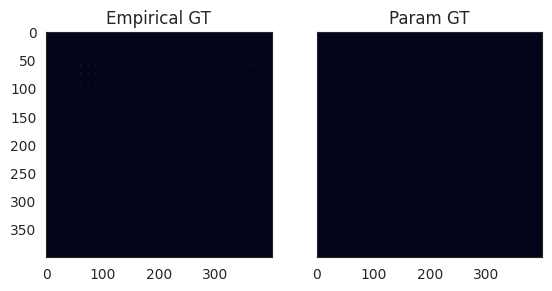

d_tv: 0.5037165420283259
KL: 0.899903017734683


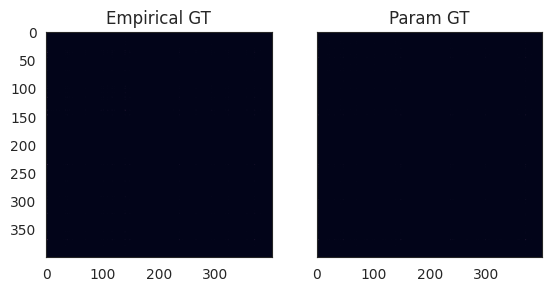

d_tv: 0.4650193652107931
KL: 0.8331932679027211


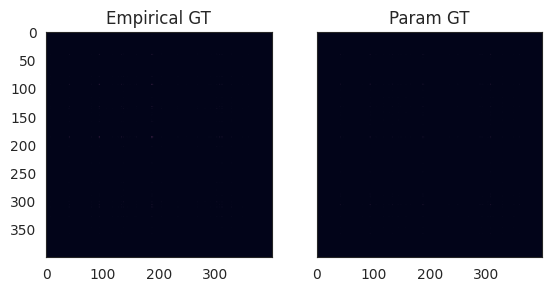

d_tv: 0.5913604422331965
KL: 1.301943058488623


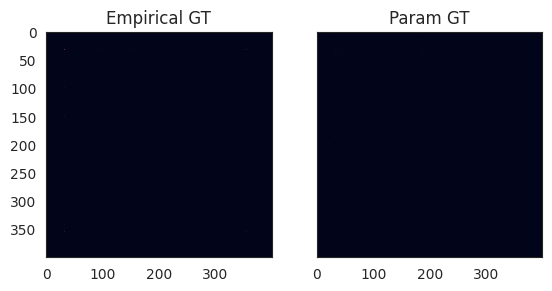

d_tv: 0.5506560272134442
KL: 1.1625825716159524


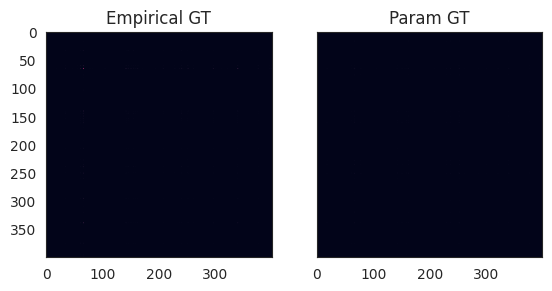

d_tv: 0.5711867585419192
KL: 1.2391887706309528


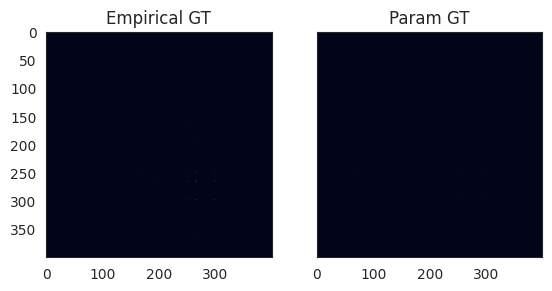

d_tv: 0.5235808448568627
KL: 1.0198391634555195


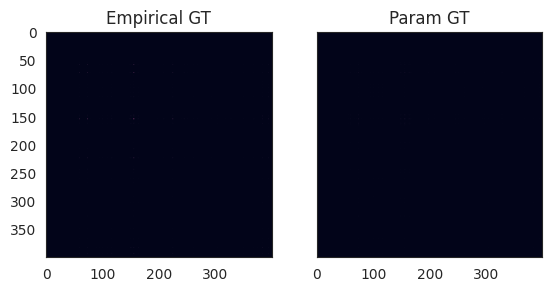

d_tv: 0.5632817470855347
KL: 1.109437151525298


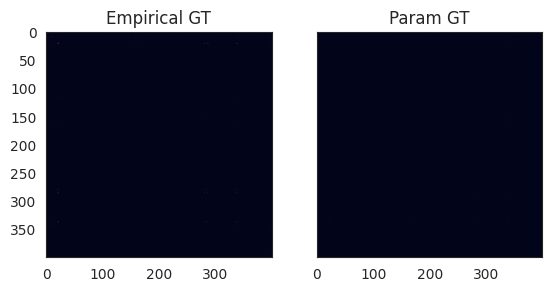



### latin_cube_u n=900

d_tv: 0.6467295635520721
KL: 1.6708305383754603


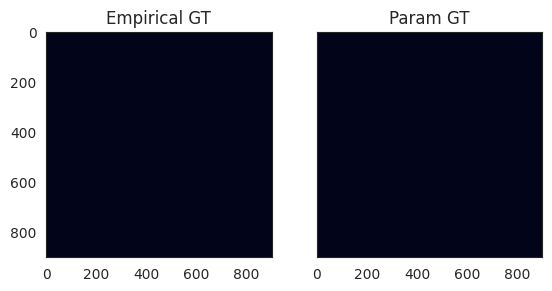

d_tv: 0.6291749757089524
KL: 1.598965669316229


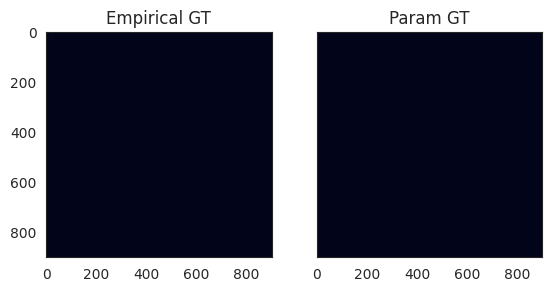

d_tv: 0.6543458732751327
KL: 1.725931130366277


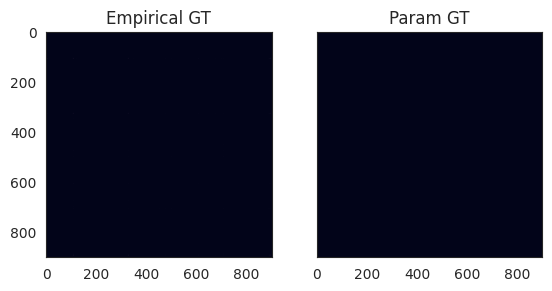

d_tv: 0.63828531998891
KL: 1.6238496354784573


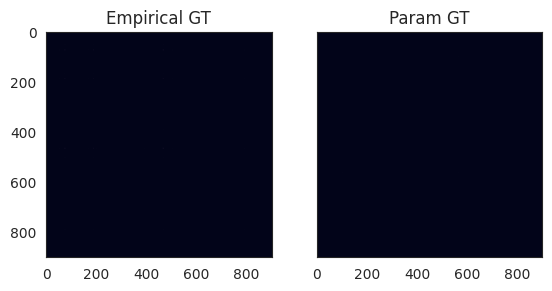

d_tv: 0.6789316067852105
KL: 2.0370664499949607


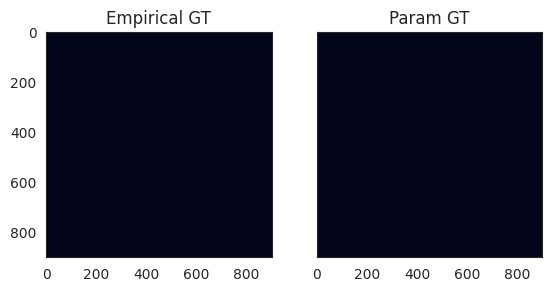

d_tv: 0.6184929627539111
KL: 1.5311672173021016


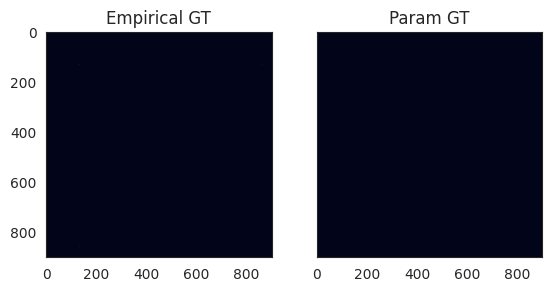

d_tv: 0.6210981555566284
KL: 1.574644635271337


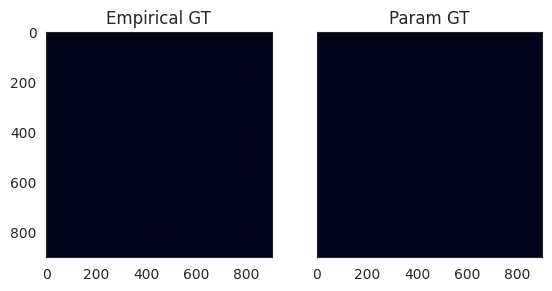

d_tv: 0.6244696369044807
KL: 1.6001684374656162


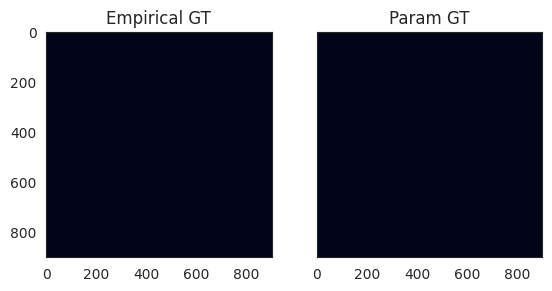

d_tv: 0.6087895934089753
KL: 1.4952669287102562


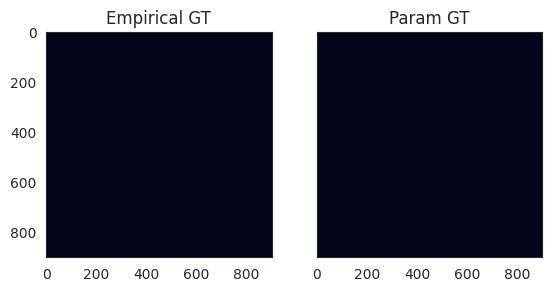

d_tv: 0.59661897538295
KL: 1.4718499541163093


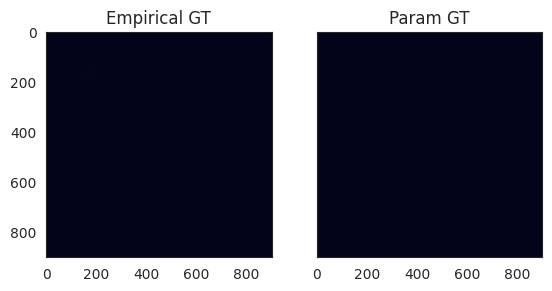



## latin_cube_q



### latin_cube_q n=9

d_tv: 0.18769608143345373
KL: 0.17169711361339587


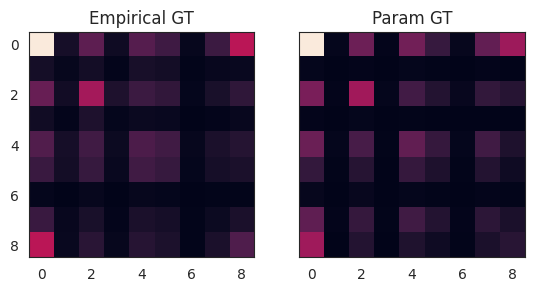

d_tv: 0.14597974203373762
KL: 0.6386404488409305


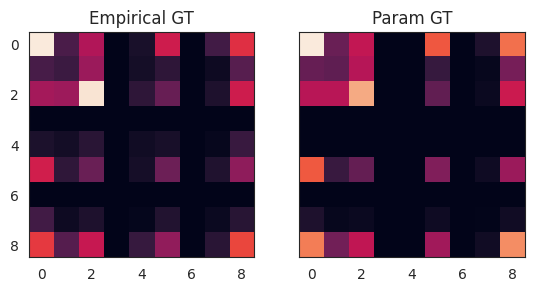

d_tv: 0.26937072047257277
KL: 0.27136294219881524


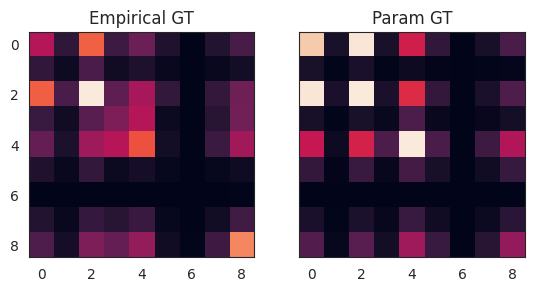

d_tv: 0.2465878745676589
KL: 0.21313251887836238


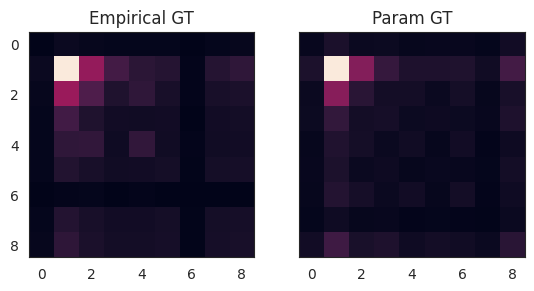

d_tv: 0.267256439890151
KL: 0.3787871456580044


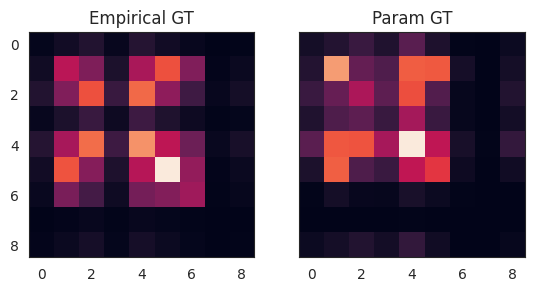

d_tv: 0.216800673066893
KL: 0.1548340337607723


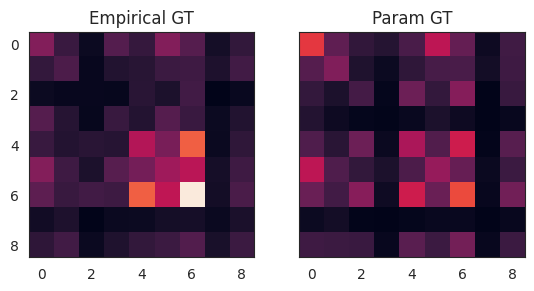

d_tv: 0.25263799277685567
KL: 0.29402198688940817


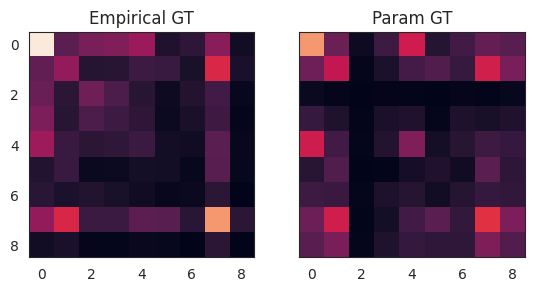

d_tv: 0.17014881859662126
KL: 0.20585408165894037


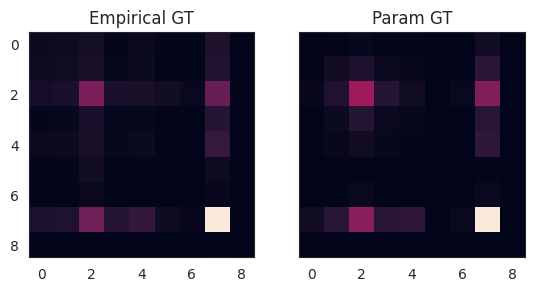

d_tv: 0.21830620947163862
KL: 0.30320272287036143


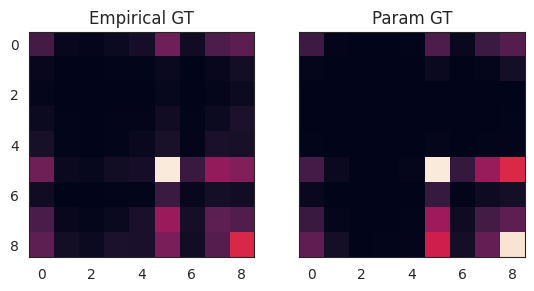

d_tv: 0.275821089481733
KL: 0.5356110561788363


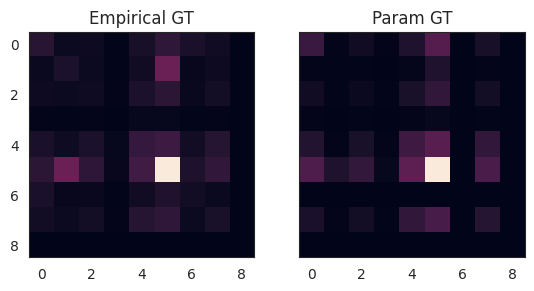



### latin_cube_q n=16

d_tv: 0.3344398070801889
KL: 0.4056873571300102


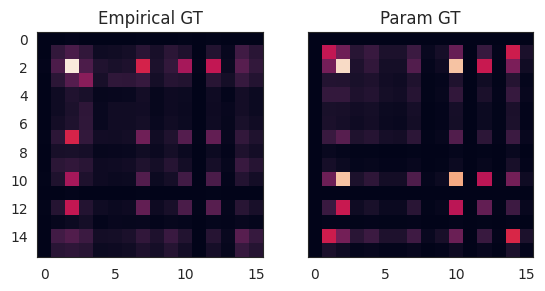

d_tv: 0.2628061139785738
KL: 0.26502957074194305


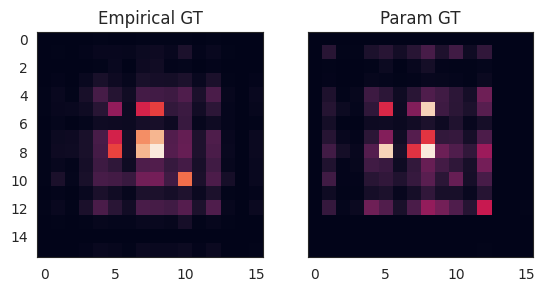

d_tv: 0.2750163903714297
KL: 0.24526155309626646


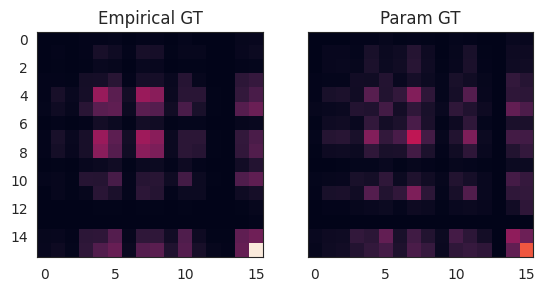

d_tv: 0.277998026406334
KL: 0.27879801236162277


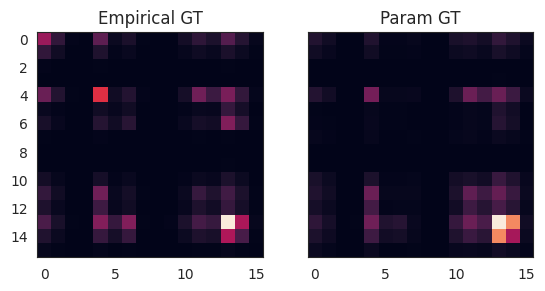

d_tv: 0.37476207822418595
KL: 0.6802573631341965


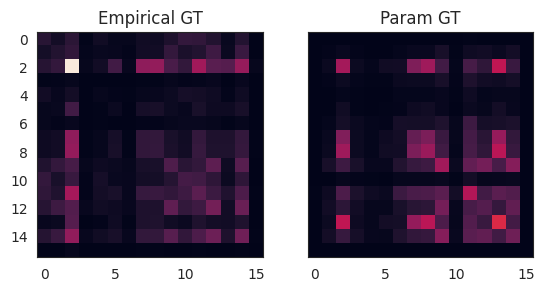

d_tv: 0.34675946550270764
KL: 0.38312344253067243


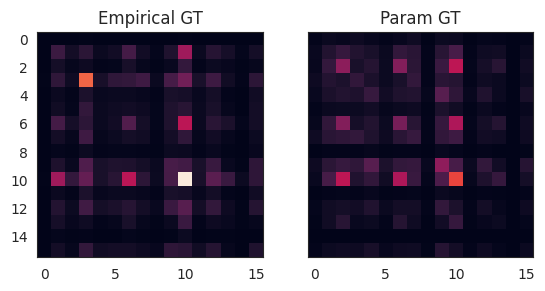

d_tv: 0.32794039796068564
KL: 0.7327295322676968


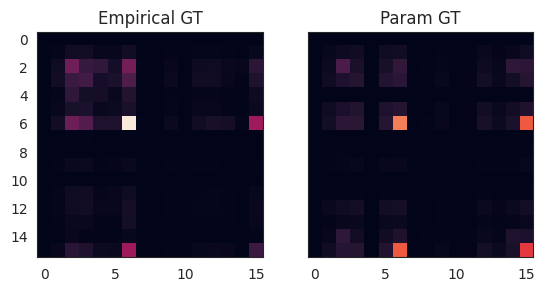

d_tv: 0.2976404282874005
KL: 0.2927735722769468


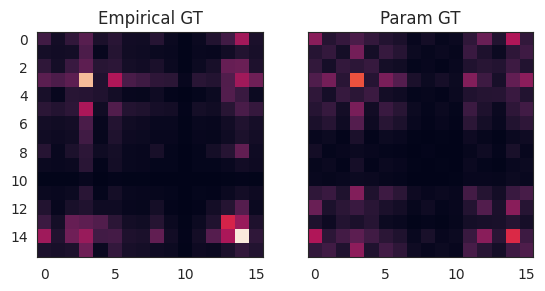

d_tv: 0.32371438658115154
KL: 0.6305708180523213


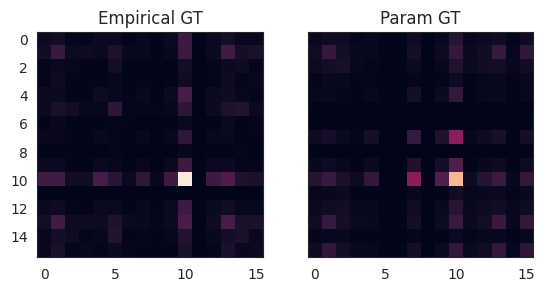

d_tv: 0.246138918838433
KL: 0.3313263771215442


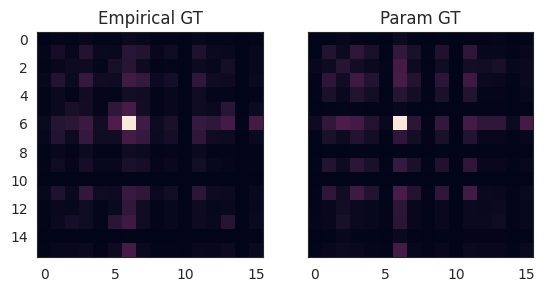



### latin_cube_q n=25

d_tv: 0.37285061964633054
KL: 0.5718844986400788


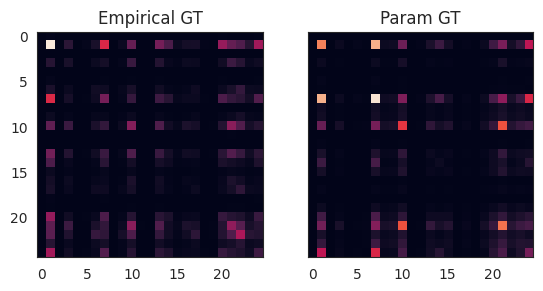

d_tv: 0.38941356162032414
KL: 0.5664939152475461


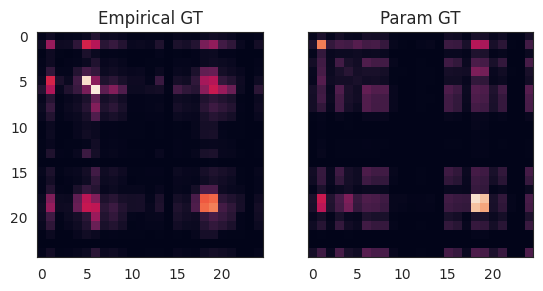

d_tv: 0.38546516817469867
KL: 0.5007311923302258


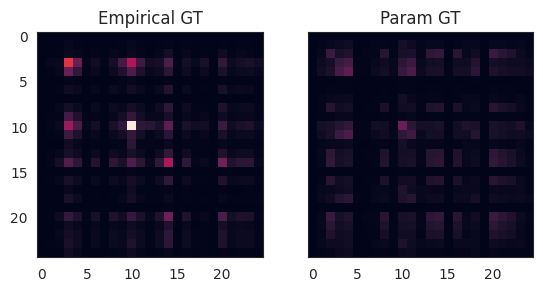

d_tv: 0.30713352568603824
KL: 0.434530363728618


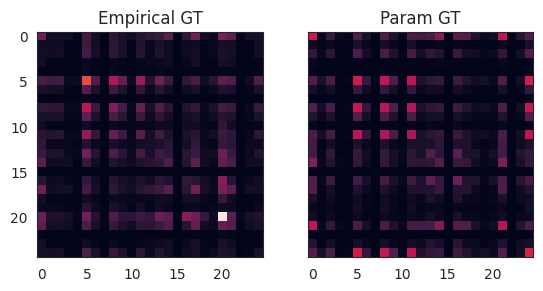

d_tv: 0.2827658974236235
KL: 0.31541694298353196


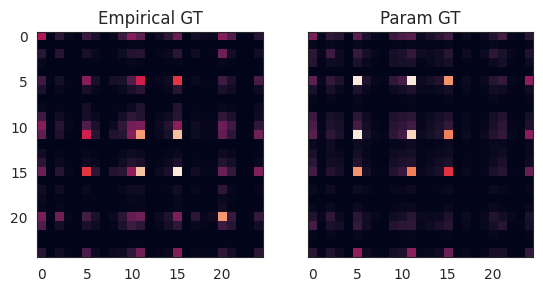

d_tv: 0.39646357438301627
KL: 0.554745199396261


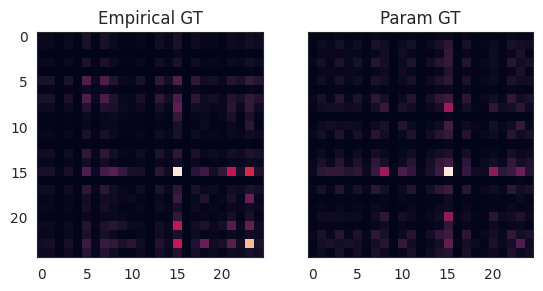

d_tv: 0.4629074696746811
KL: 1.0185820135235093


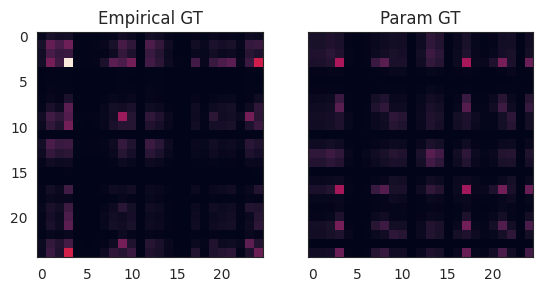

d_tv: 0.37634417074973514
KL: 0.5033082150423985


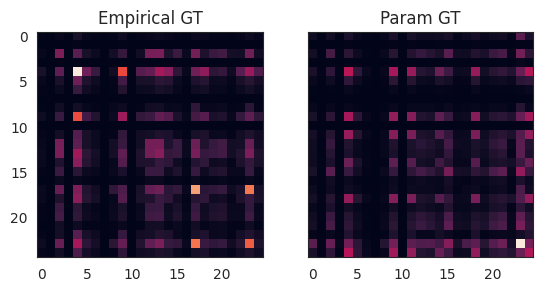

d_tv: 0.29222183117402684
KL: 0.28897296875531614


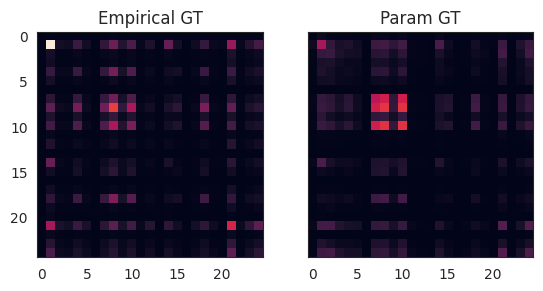

d_tv: 0.3265102315167881
KL: 0.36101287522019304


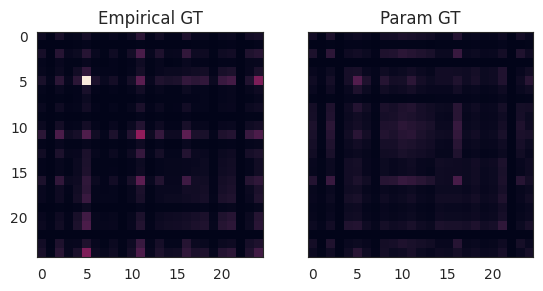



### latin_cube_q n=64

d_tv: 0.45762311368068465
KL: 0.8071608628939403


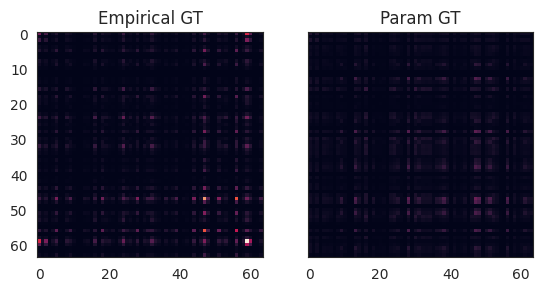

d_tv: 0.433226632640801
KL: 0.654714519359375


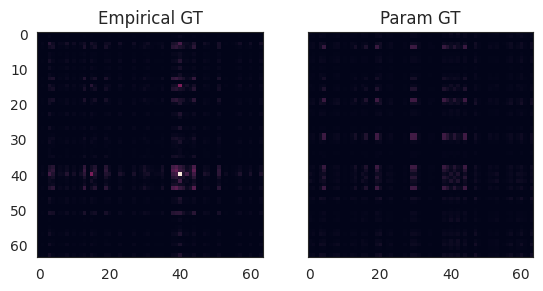

d_tv: 0.4204509263787831
KL: 0.7136667791772342


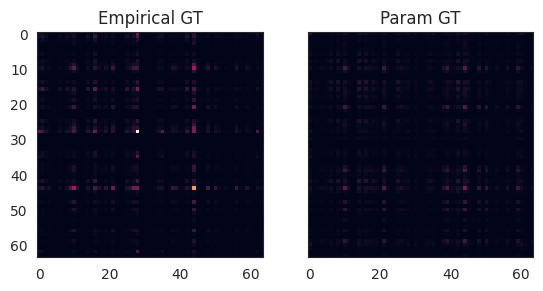

d_tv: 0.4010730334815026
KL: 0.7693579795289738


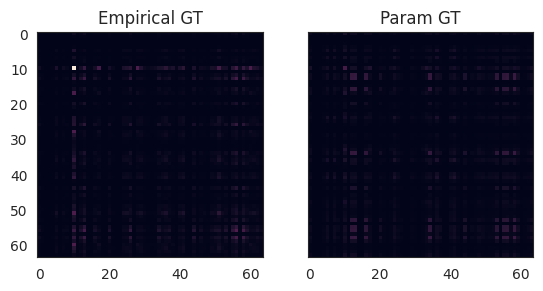

d_tv: 0.46755847204033235
KL: 0.8191109142353603


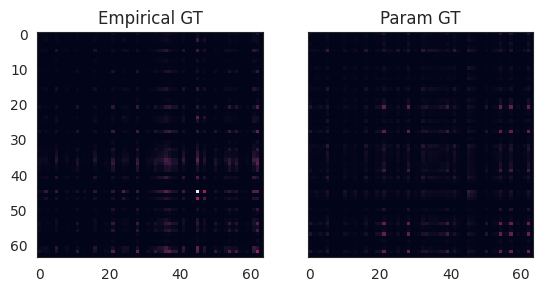

d_tv: 0.39276073322266736
KL: 0.558273286114155


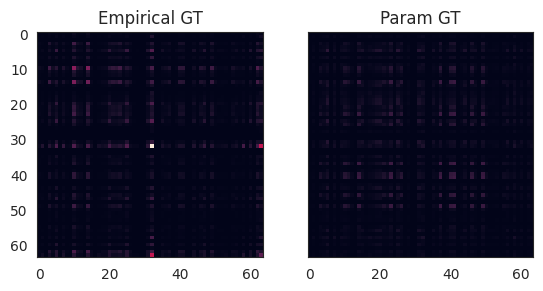

d_tv: 0.4511124312440272
KL: 0.742292400780745


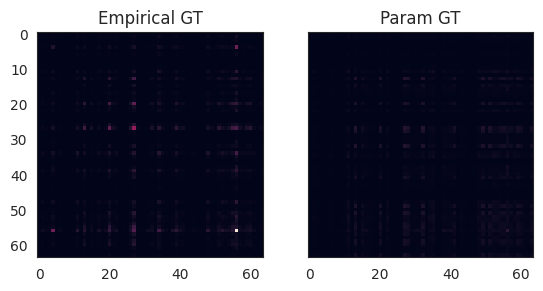

d_tv: 0.4905169948113259
KL: 0.8189371972868135


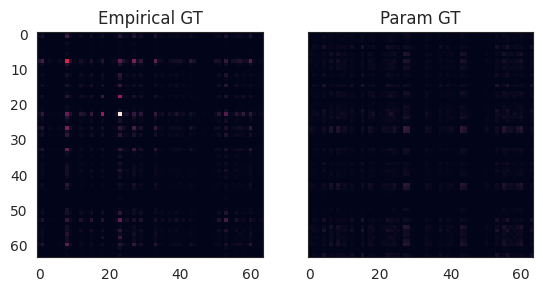

d_tv: 0.4886861013270539
KL: 0.9033480439905615


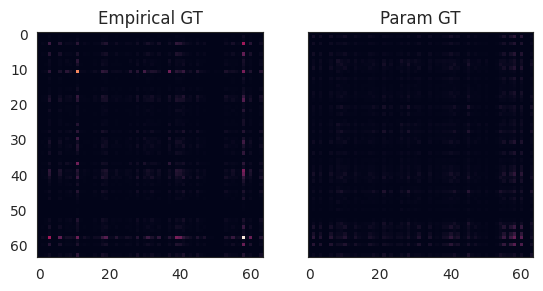

d_tv: 0.442887205576839
KL: 0.7259545658008557


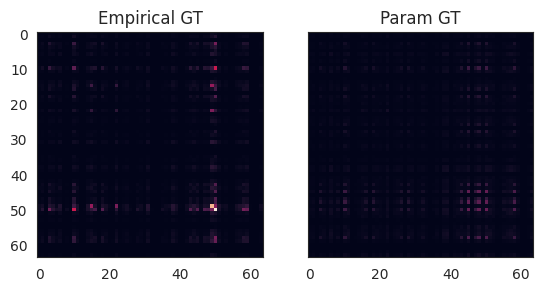



### latin_cube_q n=100

d_tv: 0.4988072168048665
KL: 0.9900991382171176


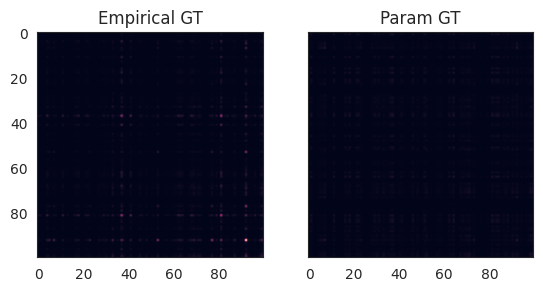

d_tv: 0.5627768856827442
KL: 1.1903202496914609


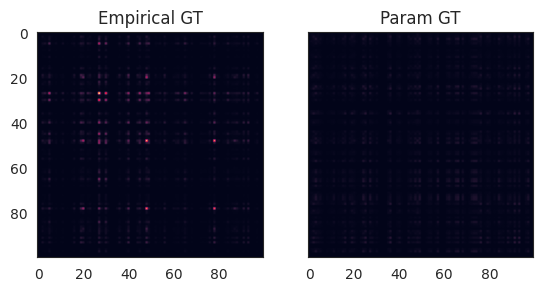

d_tv: 0.4766506736116653
KL: 0.898033547083491


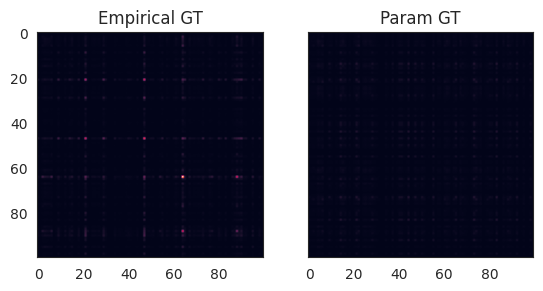

d_tv: 0.4704355090779119
KL: 0.9373050090372822


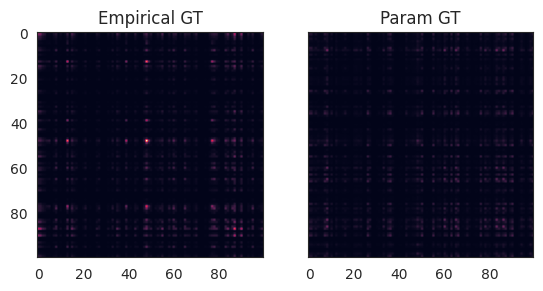

d_tv: 0.5048553928801937
KL: 1.087739693829918


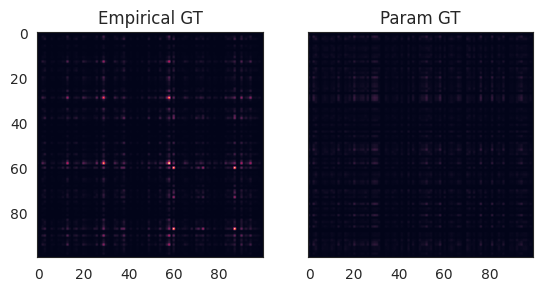

d_tv: 0.4828225747588044
KL: 0.9202546225824737


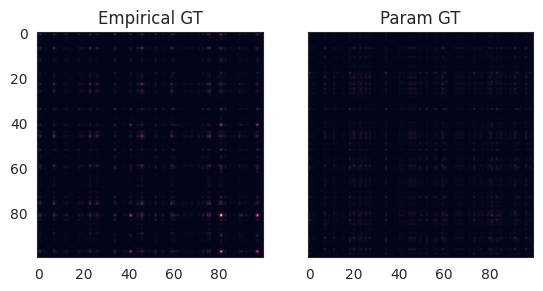

d_tv: 0.5537241820279379
KL: 1.24200783281354


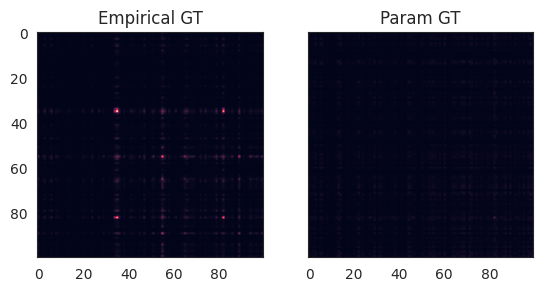

d_tv: 0.46683347421209587
KL: 0.9488163040490791


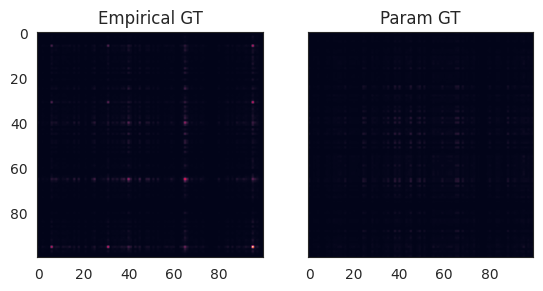

d_tv: 0.5022730577114046
KL: 0.9540376359725364


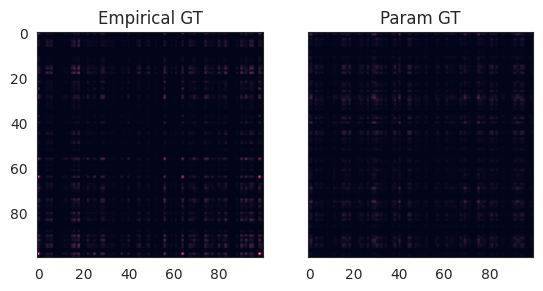

d_tv: 0.5238984974426367
KL: 1.0956835782508998


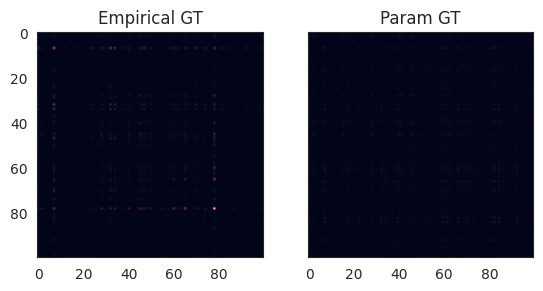



### latin_cube_q n=400

d_tv: 0.5975904407476489
KL: 1.6127408733839446


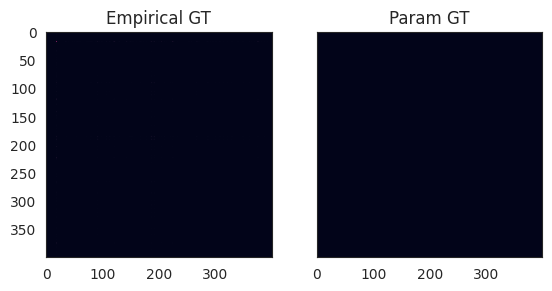

d_tv: 0.5974115726128919
KL: 1.6175971428694311


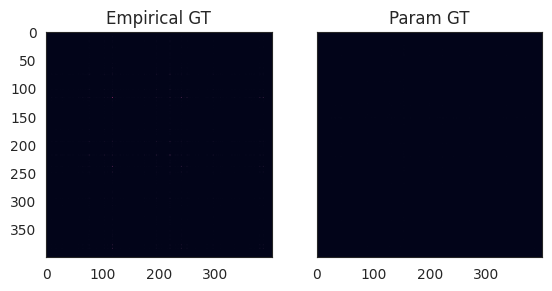

d_tv: 0.5747069770794991
KL: 1.398259698696022


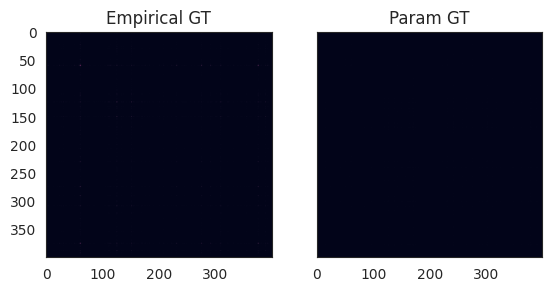

d_tv: 0.5904476974900618
KL: 1.6467827421413244


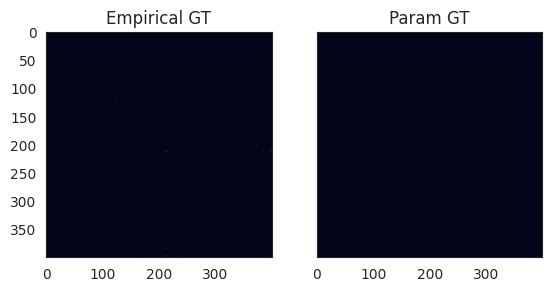

d_tv: 0.6067666792479555
KL: 1.7148972496825259


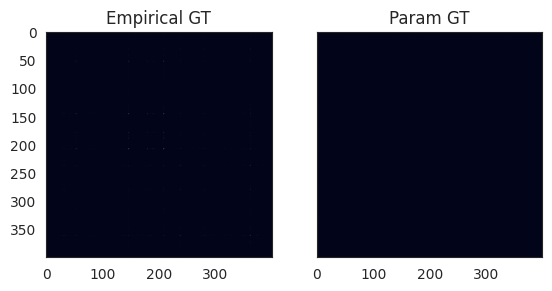

d_tv: 0.5859750548124646
KL: 1.536984448885491


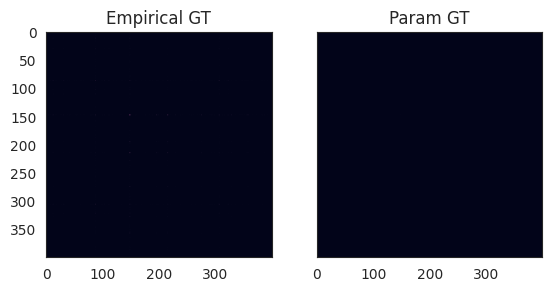

d_tv: 0.5827383559791641
KL: 1.5824767641054935


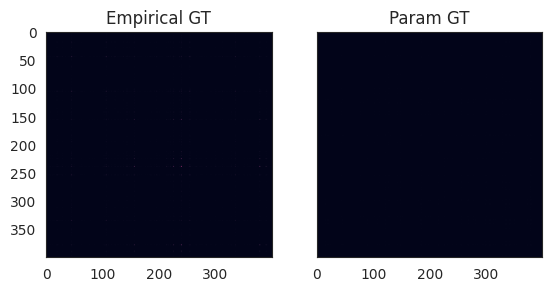

d_tv: 0.5906111313554814
KL: 1.4414056151991406


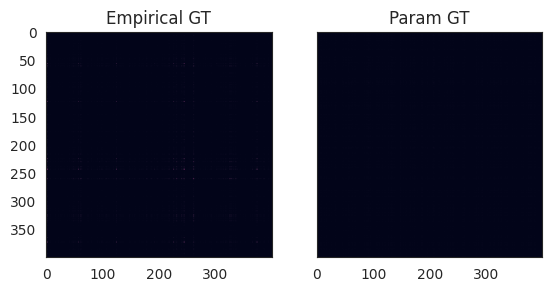

d_tv: 0.5730406261567946
KL: 1.444788079659323


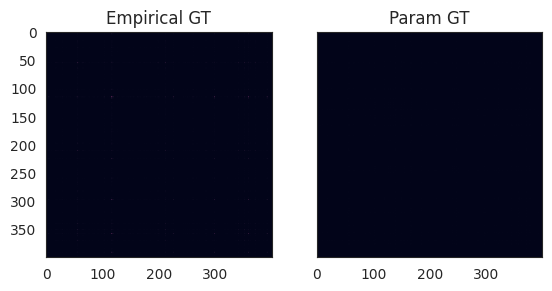

d_tv: 0.609580192815609
KL: 1.717193222591454


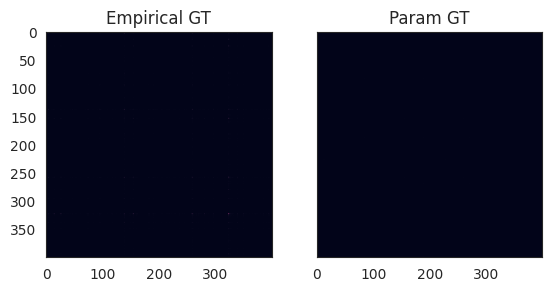



### latin_cube_q n=900

d_tv: 0.6628852799713801
KL: 2.024601263621666


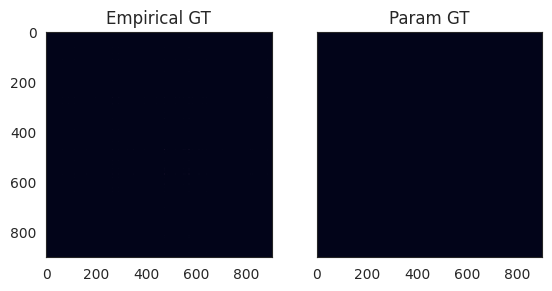

d_tv: 0.6495970864249784
KL: 2.040059745089536


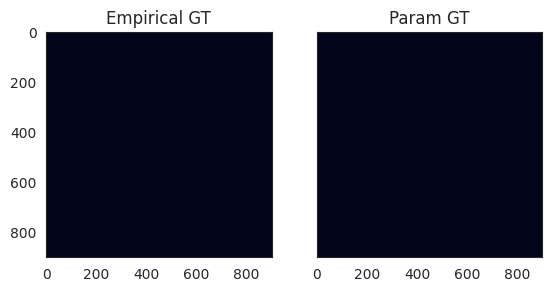

d_tv: 0.6812762976692519
KL: 2.2572169078030866


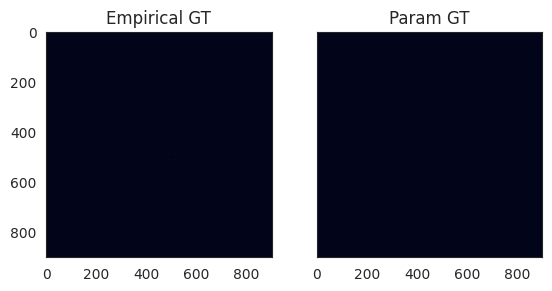

d_tv: 0.6633158482163554
KL: 2.075608477248948


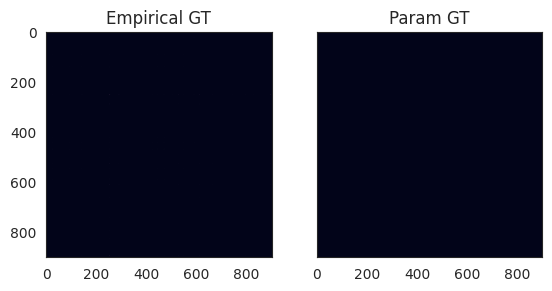

d_tv: 0.6697042941108137
KL: 2.109229564907964


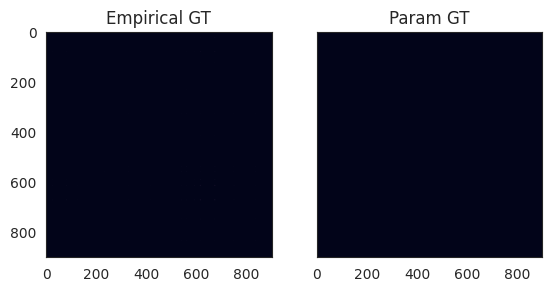

d_tv: 0.6599894047534863
KL: 2.0610646629656415


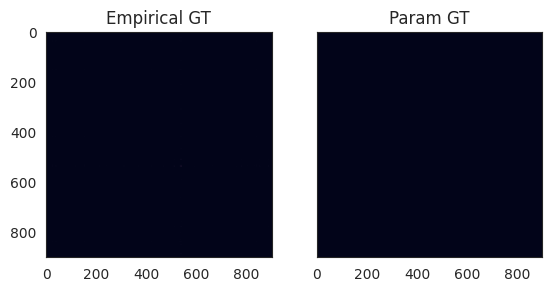

d_tv: 0.6673413052793137
KL: 2.1471297946463648


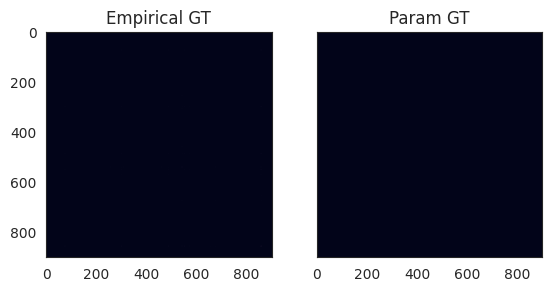

d_tv: 0.6469249870638919
KL: 1.988445535390497


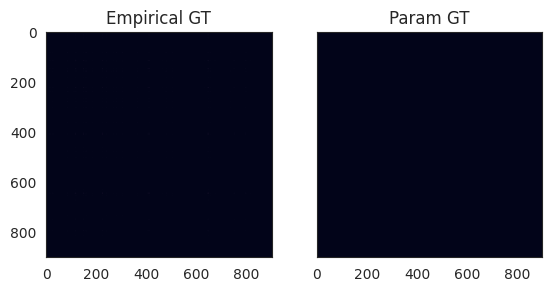

d_tv: 0.6632537047801094
KL: 2.0272171848070855


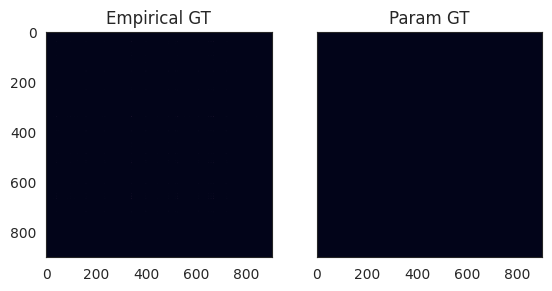

d_tv: 0.6556222963303241
KL: 1.9848577790333848


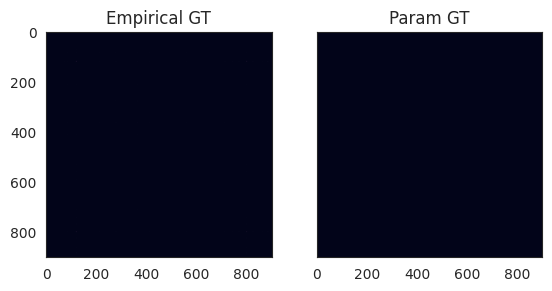



## uniform



### uniform n=9

d_tv: 0.32177975929344604
KL: 0.33253301677877306


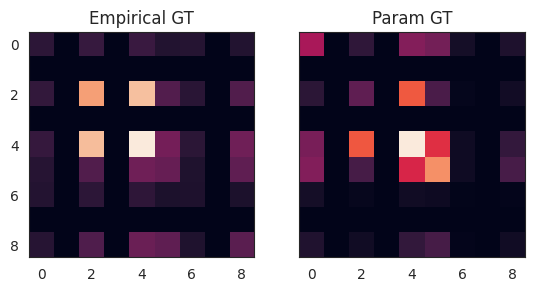

d_tv: 0.21145811137341058
KL: 0.26242277415525017


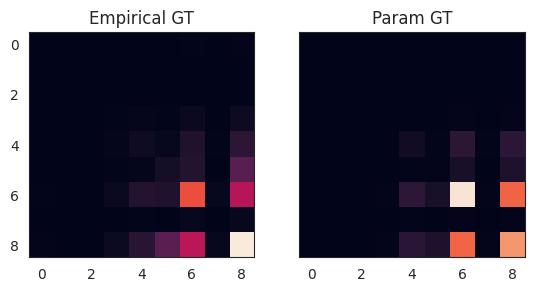

d_tv: 0.34021281026172767
KL: 1.0327959315732334


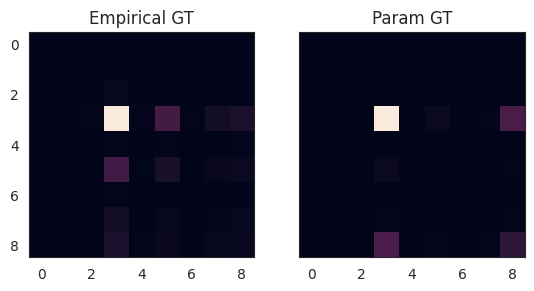

d_tv: 0.2716358887880048
KL: 2.138339624806979


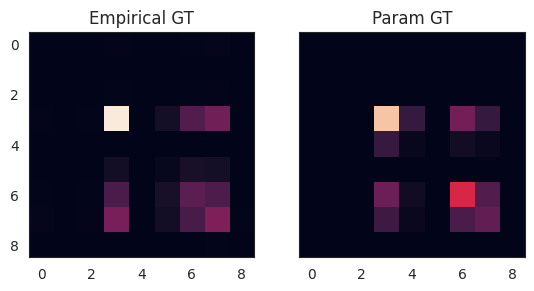

d_tv: 0.16592471491311997
KL: 0.35058825212055633


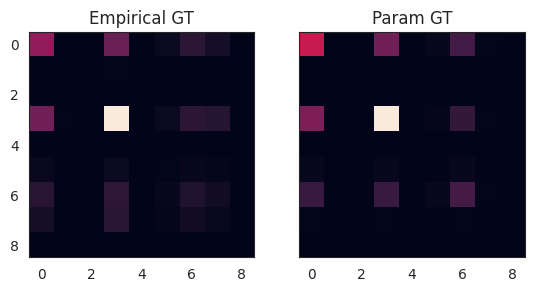

d_tv: 0.6562807408049975
KL: 4.934052980933923


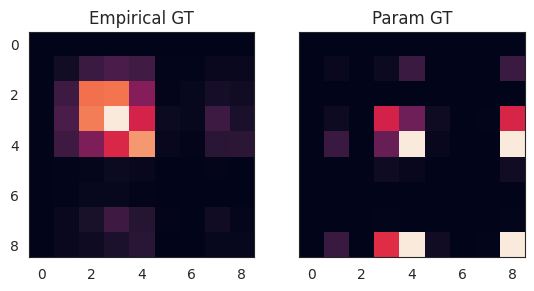

d_tv: 0.43400515266334044
KL: 0.7595843185410887


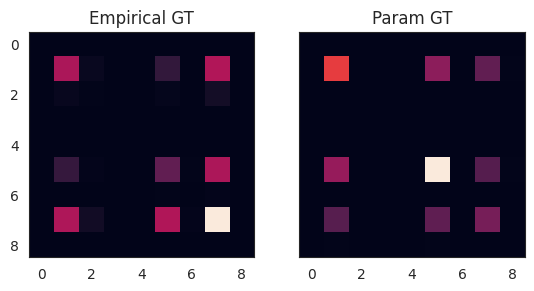

d_tv: 0.18122716813483258
KL: 1.8619686358121215


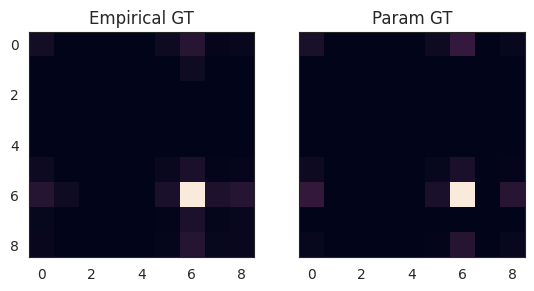

d_tv: 0.16203295994563066
KL: 0.41339133591091637


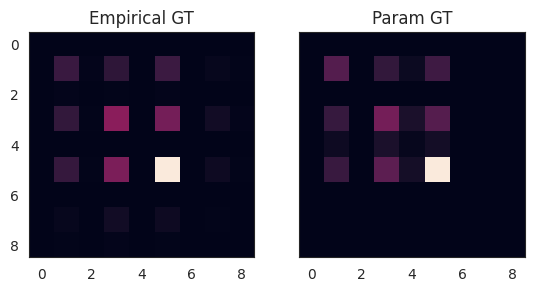

d_tv: 0.6136176974594547
KL: 2.3908044178762142


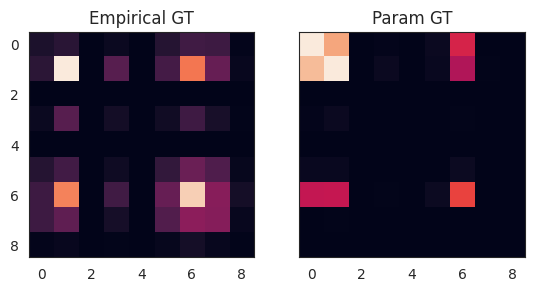



### uniform n=16

d_tv: 0.16764640036648626
KL: 0.35110324020904937


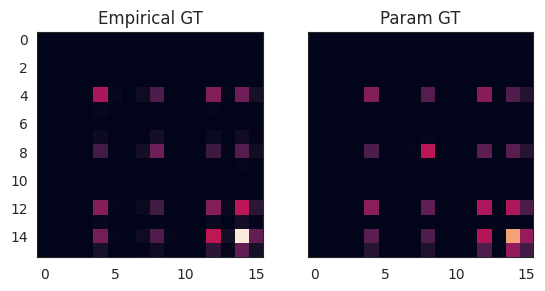

d_tv: 0.23598854818605997
KL: 0.3225400625740421


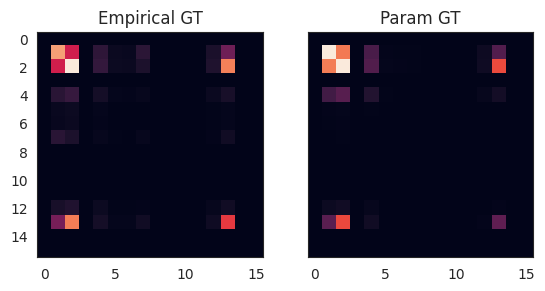

d_tv: 0.3764705739758636
KL: 0.576794178983398


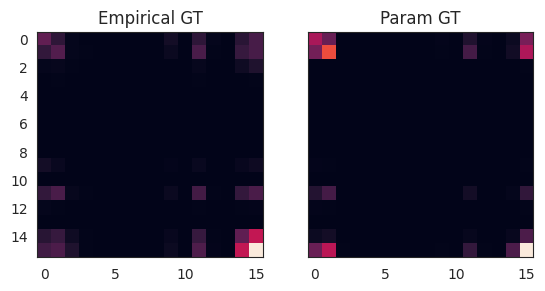

d_tv: 0.4431275575218282
KL: 1.3379207969305449


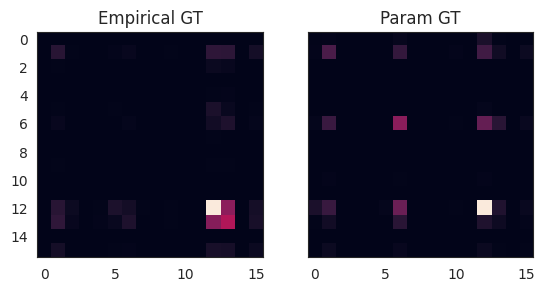

d_tv: 0.43393178926793763
KL: 0.8869694780935566


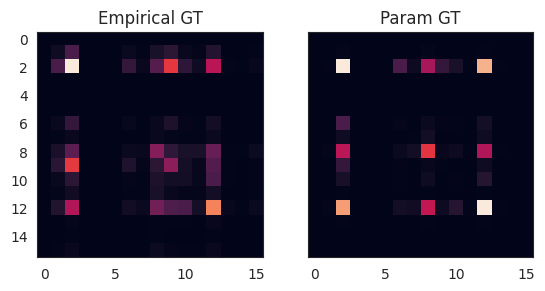

d_tv: 0.5205244630121293
KL: 2.223188590339767


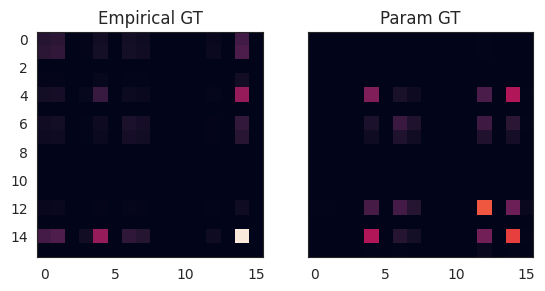

d_tv: 0.34075938819750223
KL: 0.4632253352534075


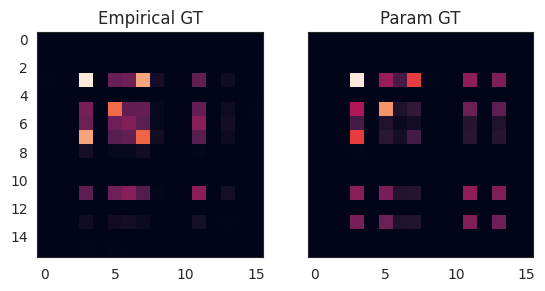

d_tv: 0.6181616584093446
KL: 2.3509435071507525


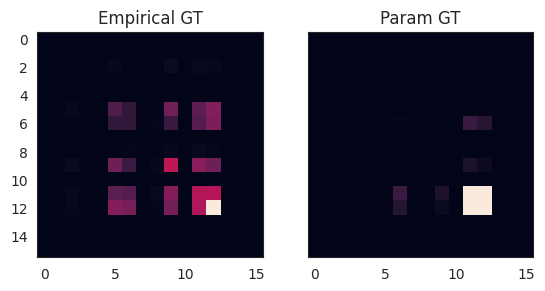

d_tv: 0.392295042713691
KL: 1.0305881135101558


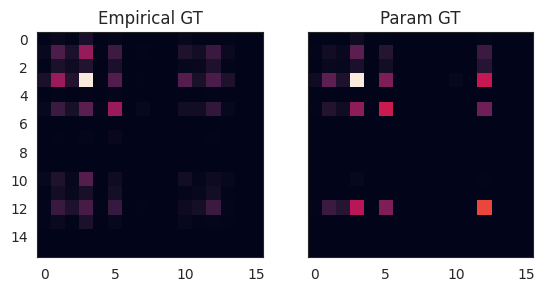

d_tv: 0.3919368693405772
KL: 0.9233358264787582


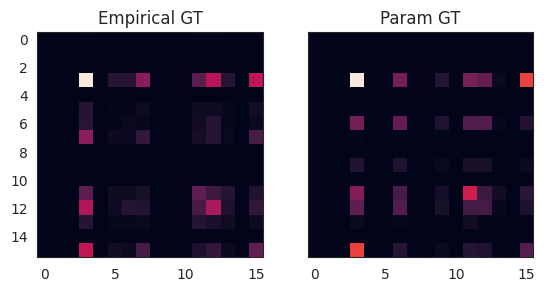



### uniform n=25

d_tv: 0.2503375380645523
KL: 0.4463967883157871


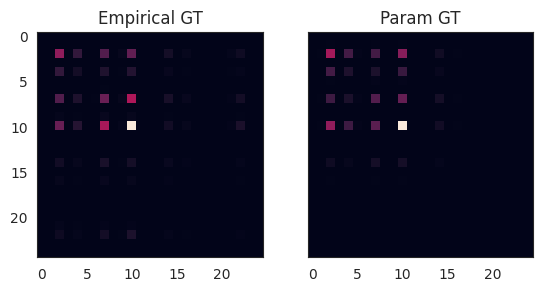

d_tv: 0.4248849144212315
KL: 0.9343655897687813


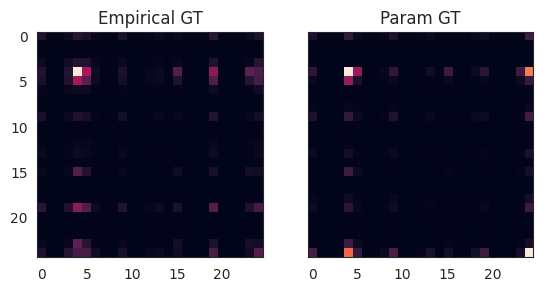

d_tv: 0.31992052655442704
KL: 0.47856124239526343


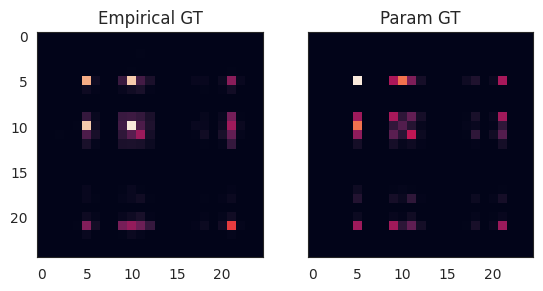

d_tv: 0.22693765026832155
KL: 0.26009404383931817


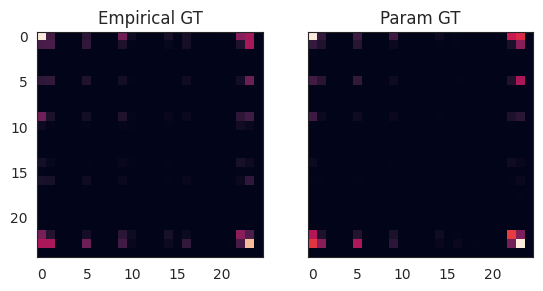

d_tv: 0.24961248800003313
KL: 0.34073278154916786


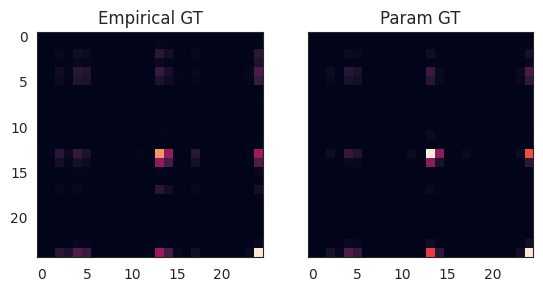

d_tv: 0.2840326605293731
KL: 0.6083209438356916


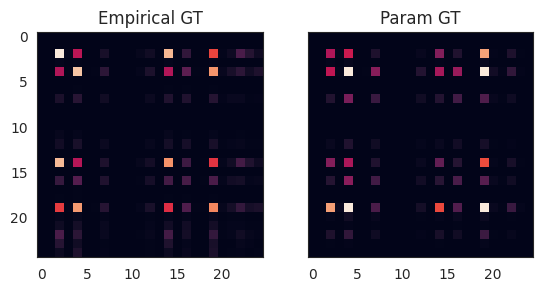

d_tv: 0.6437665608086469
KL: 2.484589375078954


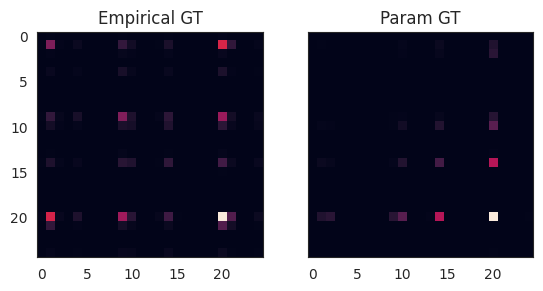

d_tv: 0.26117206454315056
KL: 0.5893405485470375


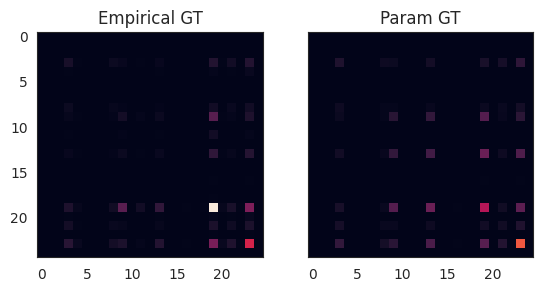

d_tv: 0.34354109579746933
KL: 0.7359730395511104


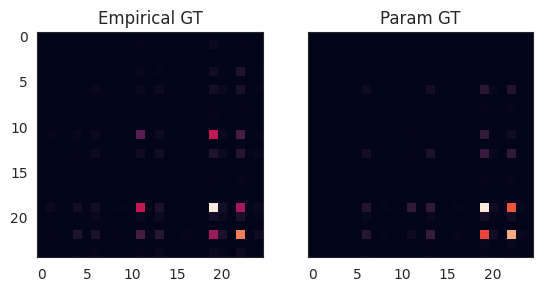

d_tv: 0.5471742352584944
KL: 1.4967355585578206


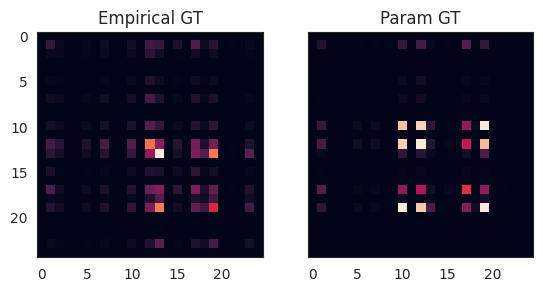



### uniform n=64

d_tv: 0.23370208225658157
KL: 0.2710244935661863


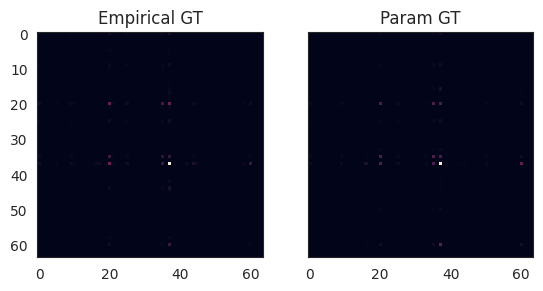

d_tv: 0.280714538525406
KL: 0.4780773519172851


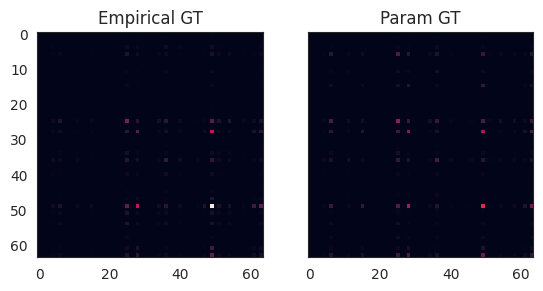

d_tv: 0.34281502385784934
KL: 0.7307221798827008


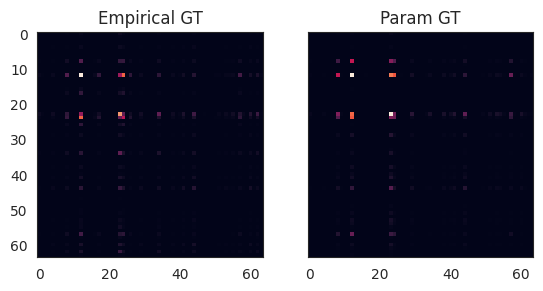

d_tv: 0.2942439057913381
KL: 0.4916126834044462


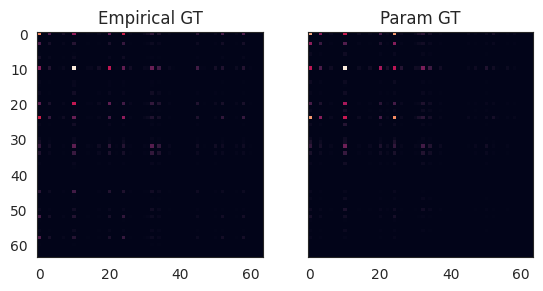

d_tv: 0.24232594623988488
KL: 0.3391297844797384


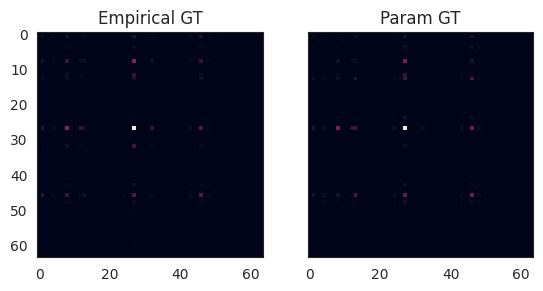

d_tv: 0.36827292022203084
KL: 0.6604399611063706


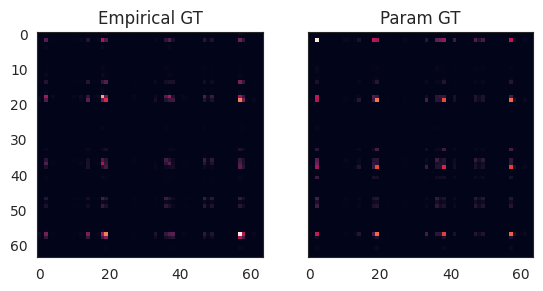

d_tv: 0.2145439639385601
KL: 0.2964797123852865


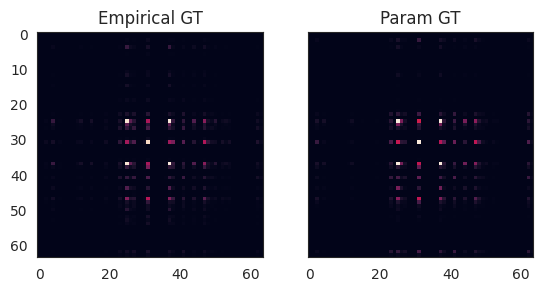

d_tv: 0.34098075163148134
KL: 0.5972176996649597


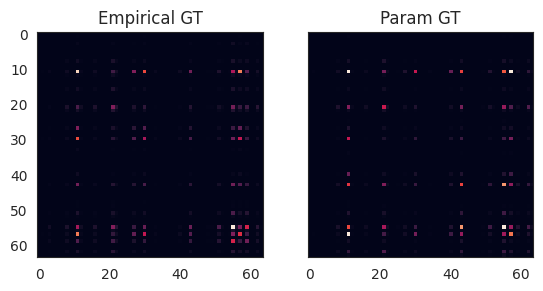

d_tv: 0.3565422389176989
KL: 0.6463050470215226


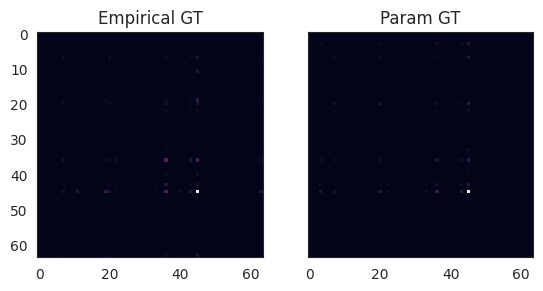

d_tv: 0.63339773068796
KL: 1.9262461384799936


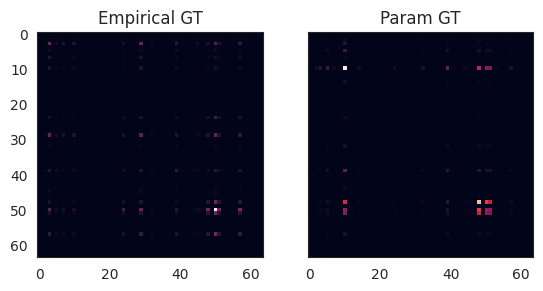



### uniform n=100

d_tv: 0.24415334890725737
KL: 0.3404364005457511


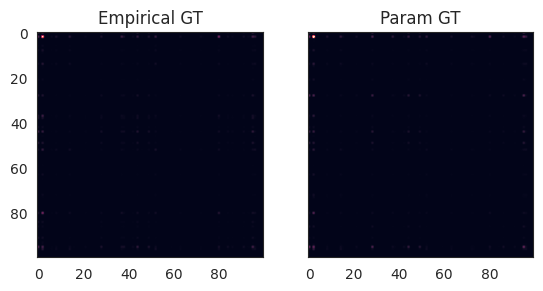

d_tv: 0.1436553083708364
KL: 0.12239125337281323


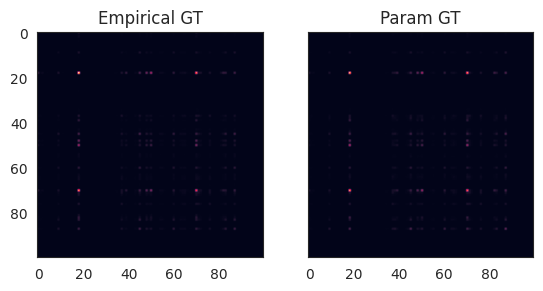

d_tv: 0.20157870929380825
KL: 0.28313519601405207


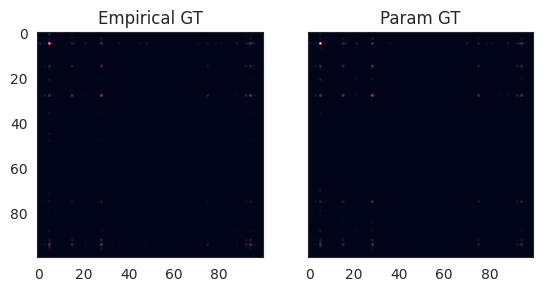

d_tv: 0.28248520050735826
KL: 0.46976402743419554


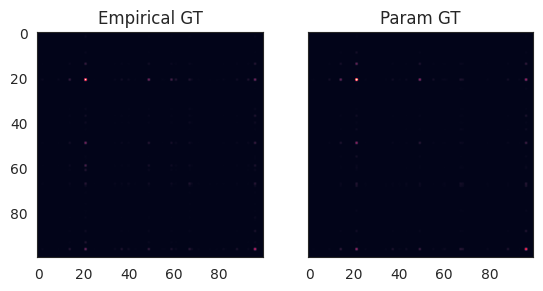

d_tv: 0.2997104134250696
KL: 0.31802016196459837


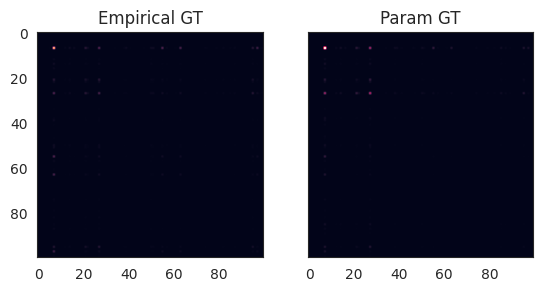

d_tv: 0.3875932304384836
KL: 0.5128883401108427


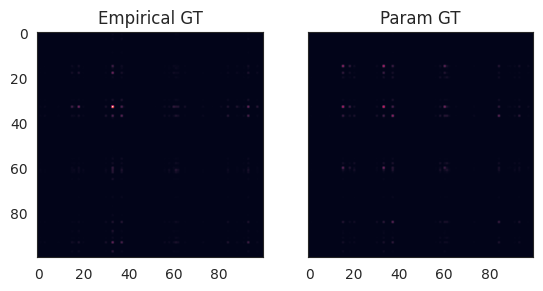

d_tv: 0.3439286015302048
KL: 0.6810345777622431


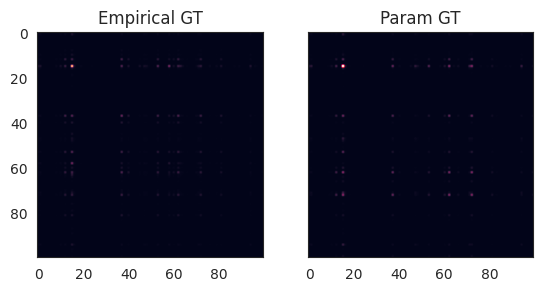

d_tv: 0.21696024833215563
KL: 0.22504964435110333


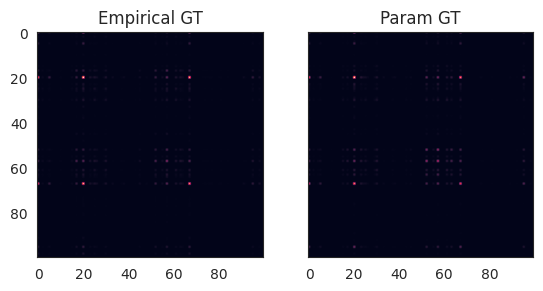

d_tv: 0.28897454925271865
KL: 0.3745774923448417


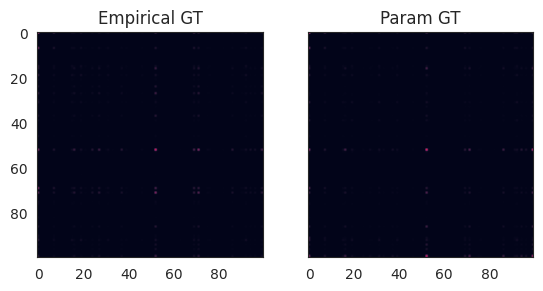

d_tv: 0.22877701472891881
KL: 0.33991911206189535


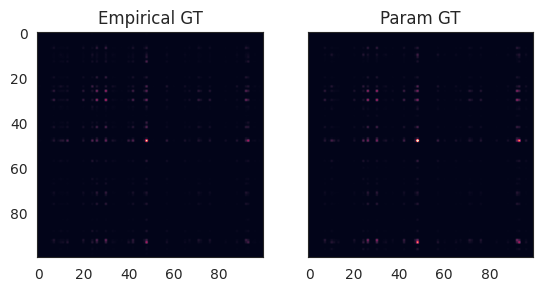



### uniform n=400

d_tv: 0.27021221027062625
KL: 0.23860104211833535


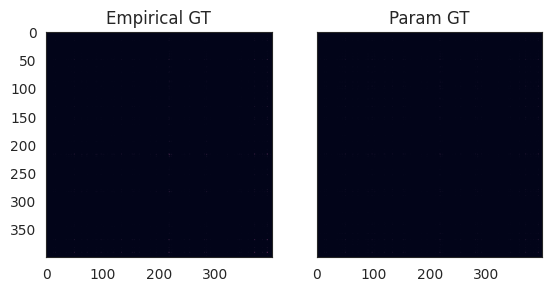

d_tv: 0.2954940889637978
KL: 0.3386497346071071


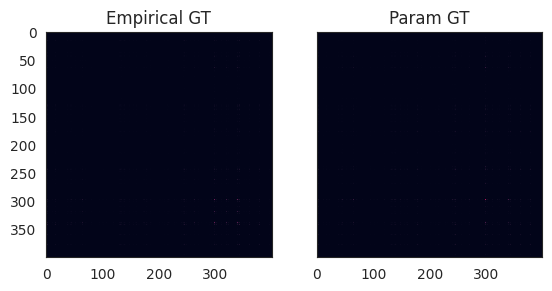

d_tv: 0.360041637158299
KL: 0.45497532551387443


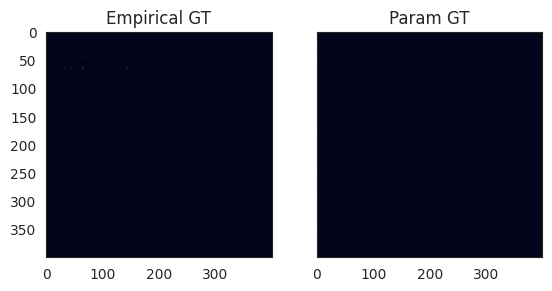

d_tv: 0.2407752426285788
KL: 0.20907593950657608


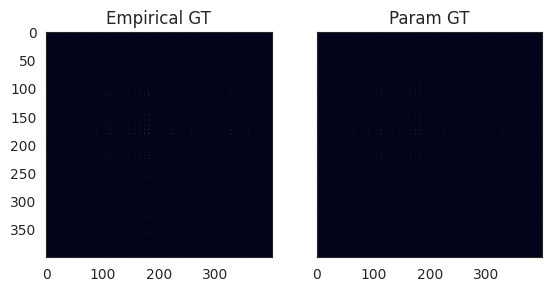

d_tv: 0.30296911342346955
KL: 0.311105839340756


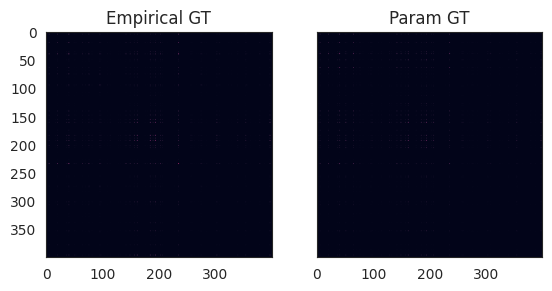

d_tv: 0.26932562096483514
KL: 0.24646760540792187


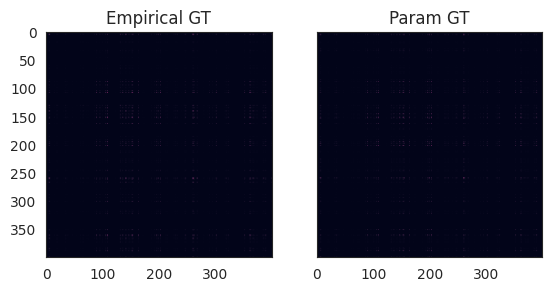

d_tv: 0.23292426664966867
KL: 0.18753930606390318


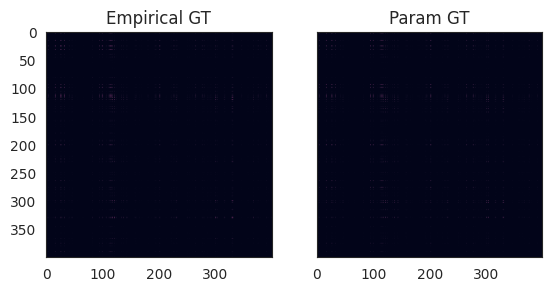

d_tv: 0.3092962390659036
KL: 0.32820770490537304


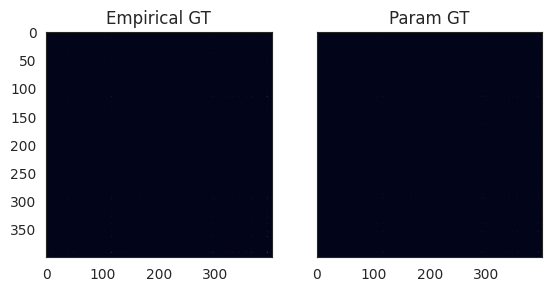

d_tv: 0.3251726999617227
KL: 0.37732951316680713


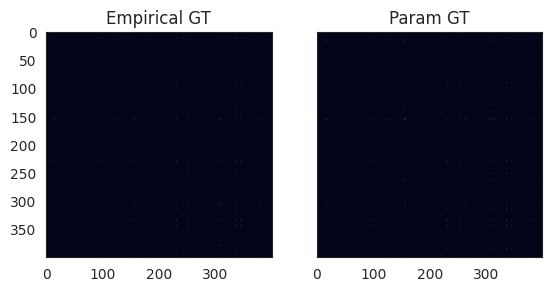

d_tv: 0.3540992905682417
KL: 0.3957047625614534


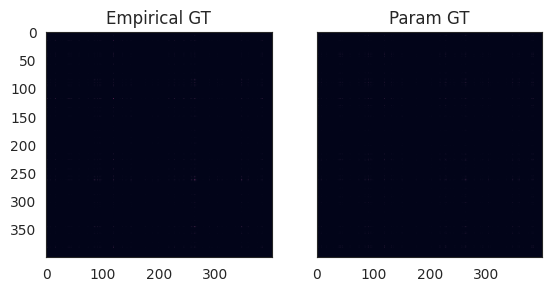



### uniform n=900

d_tv: 0.3223324540760986
KL: 0.3427747613716189


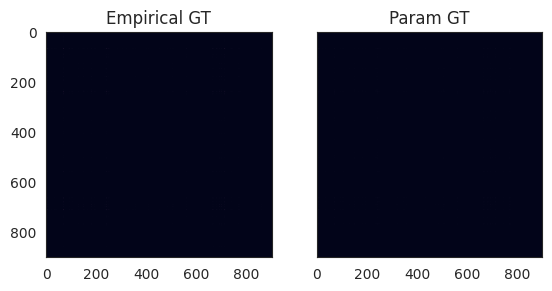

d_tv: 0.3255798490317477
KL: 0.3705243540327889


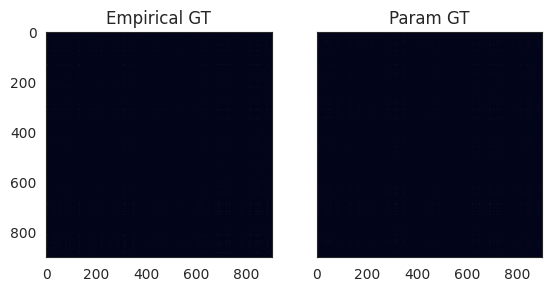

d_tv: 0.32121540022780265
KL: 0.34821328261157664


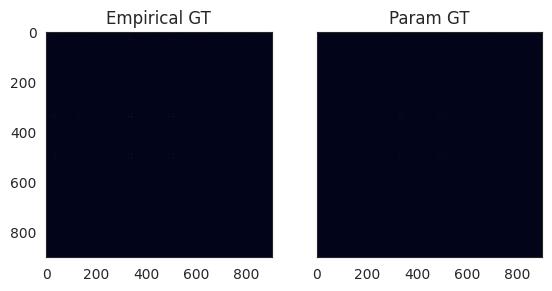

d_tv: 0.33673118122704077
KL: 0.36668161777870023


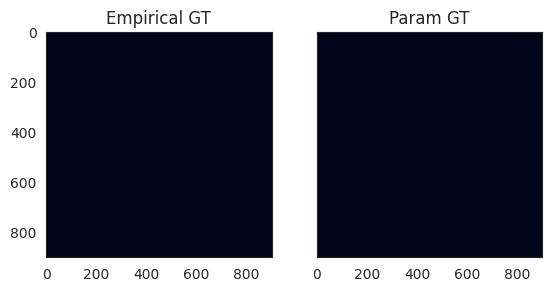

d_tv: 0.3215937818867996
KL: 0.340795216595853


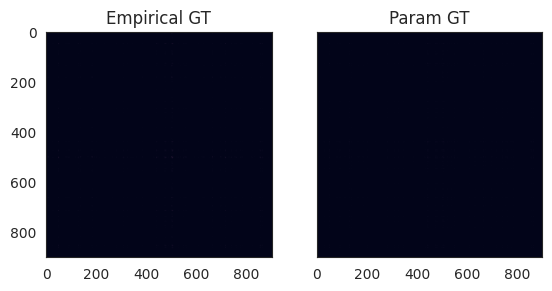

d_tv: 0.3236322942199068
KL: 0.3515972924962467


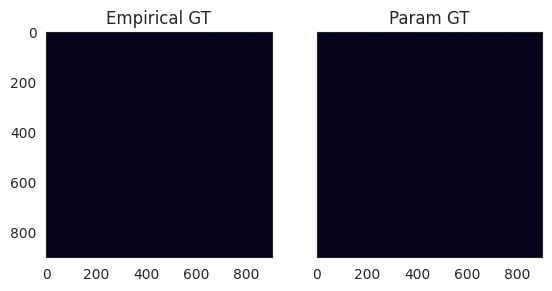

d_tv: 0.33830333479649655
KL: 0.3850637483372688


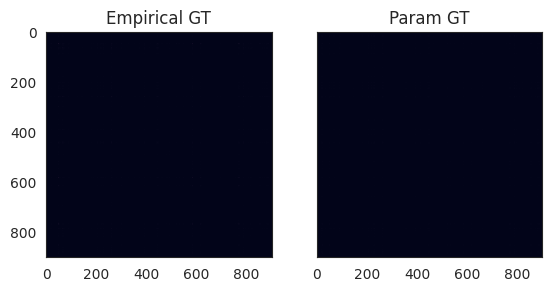

d_tv: 0.28828643675137
KL: 0.28970770762033304


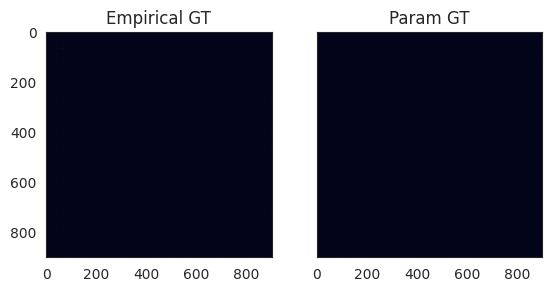

d_tv: 0.2974566375509051
KL: 0.3075465752797158


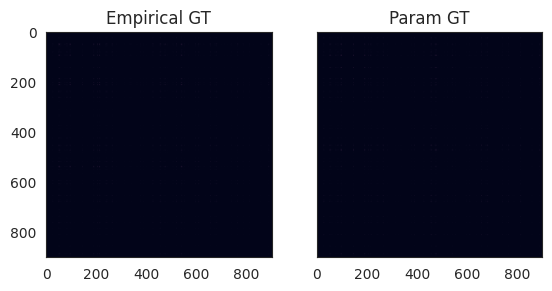

d_tv: 0.27645860359338564
KL: 0.26649182060673465


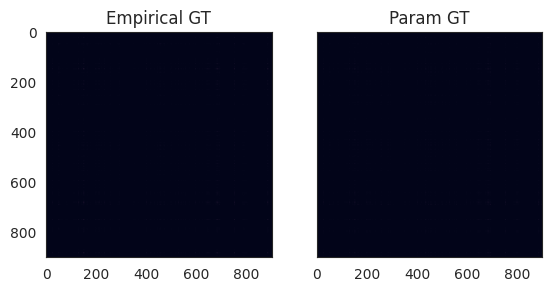



## grid



### grid n=9

d_tv: 0.4427893185652292
KL: 2.740871468682515


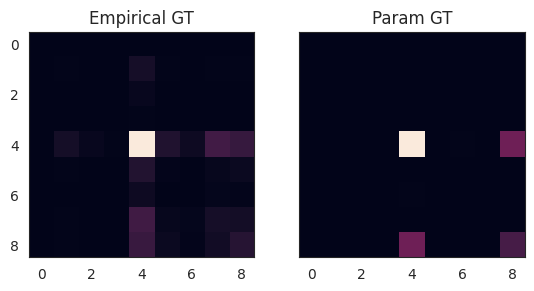

d_tv: 0.4427893185652292
KL: 2.740871468682515


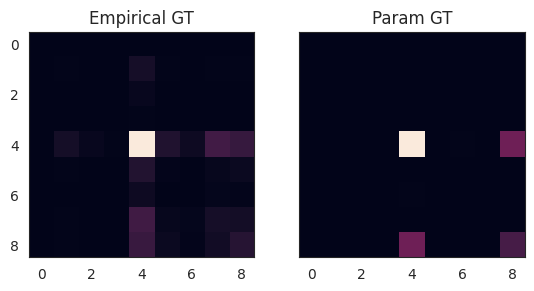

d_tv: 0.4427893185652292
KL: 2.740871468682515


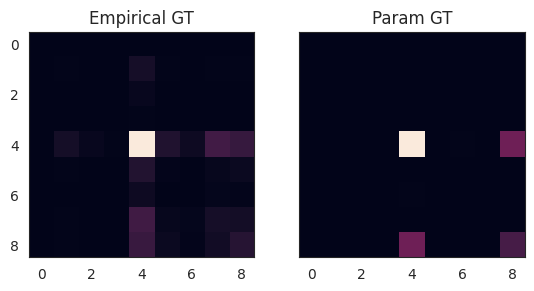

d_tv: 0.4427893185652292
KL: 2.740871468682515


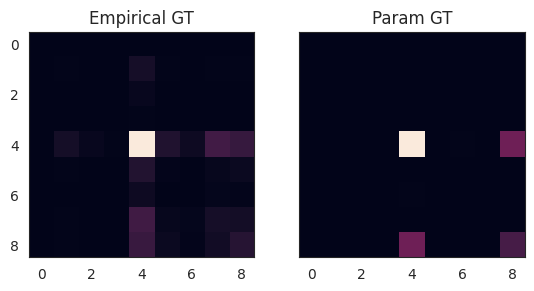

d_tv: 0.4427893185652292
KL: 2.740871468682515


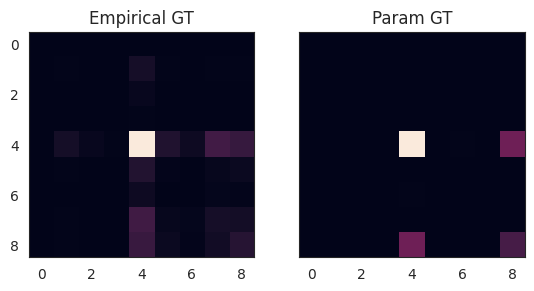

d_tv: 0.4427893185652292
KL: 2.740871468682515


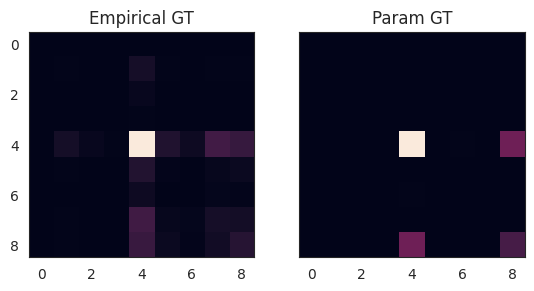

d_tv: 0.4427893185652292
KL: 2.740871468682515


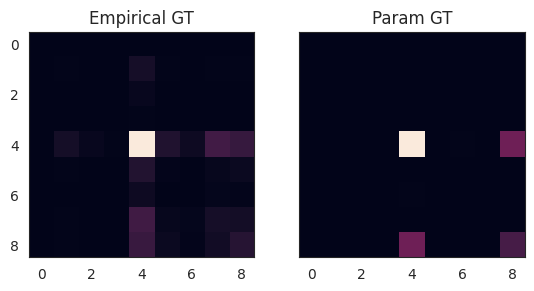

d_tv: 0.4427893185652292
KL: 2.740871468682515


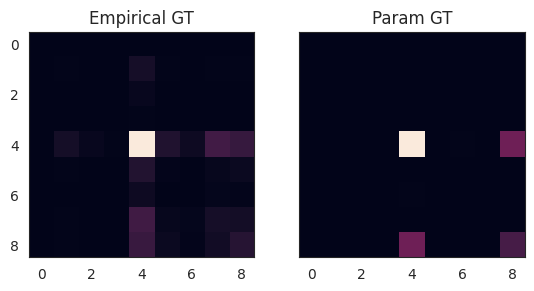

d_tv: 0.4427893185652292
KL: 2.740871468682515


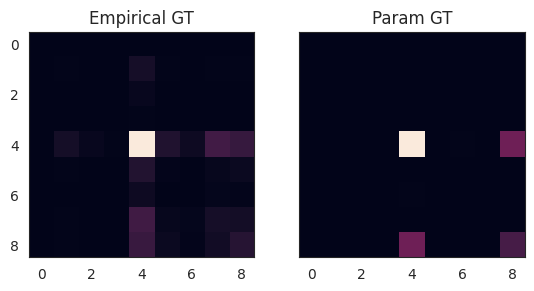

d_tv: 0.4427893185652292
KL: 2.740871468682515


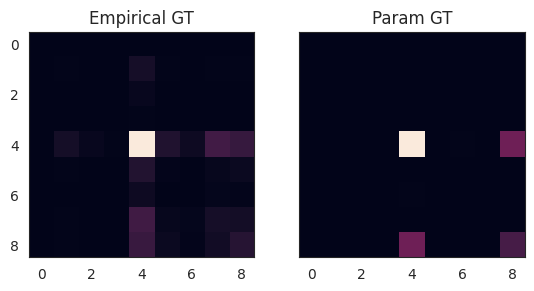



### grid n=16

d_tv: 0.28321559863878176
KL: 0.6746934481402322


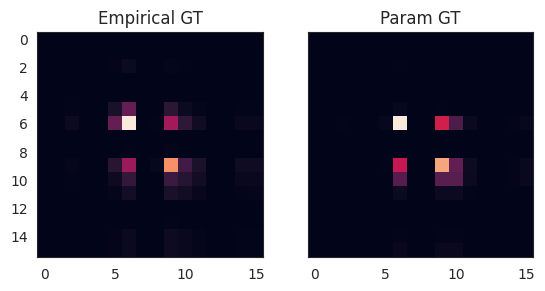

d_tv: 0.28321559863878176
KL: 0.6746934481402322


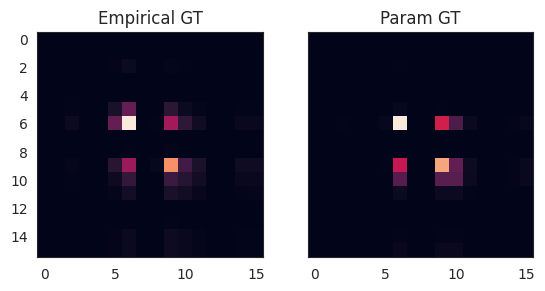

d_tv: 0.28321559863878176
KL: 0.6746934481402322


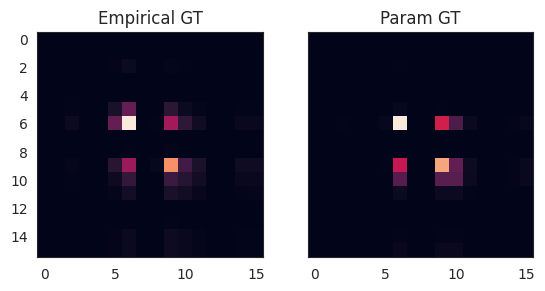

d_tv: 0.28321559863878176
KL: 0.6746934481402322


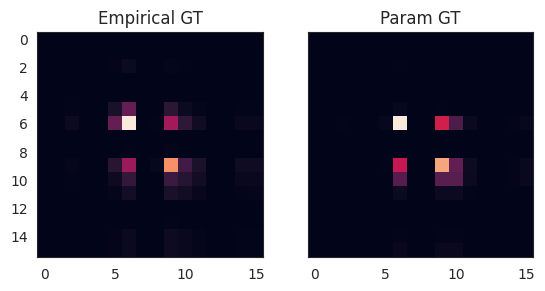

d_tv: 0.28321559863878176
KL: 0.6746934481402322


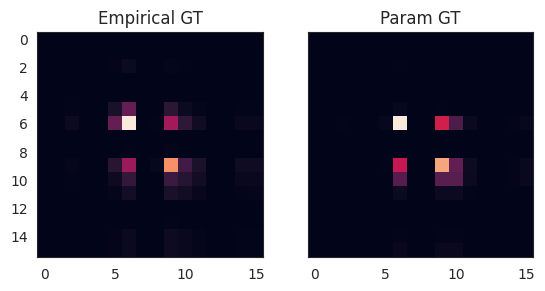

d_tv: 0.28321559863878176
KL: 0.6746934481402322


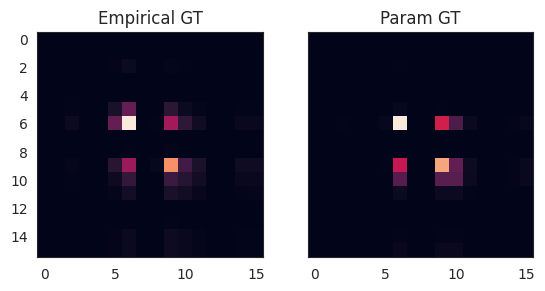

d_tv: 0.28321559863878176
KL: 0.6746934481402322


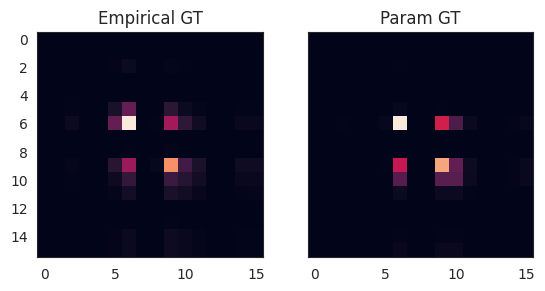

d_tv: 0.28321559863878176
KL: 0.6746934481402322


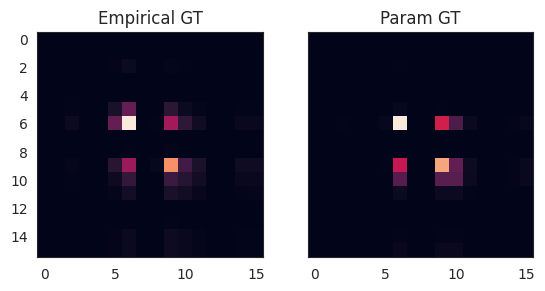

d_tv: 0.28321559863878176
KL: 0.6746934481402322


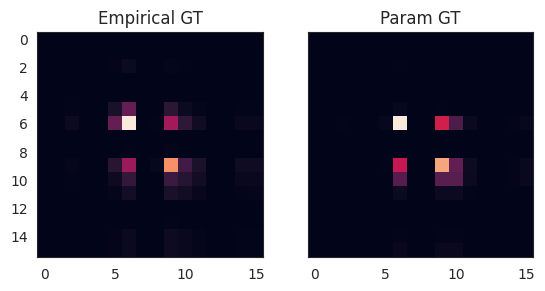

d_tv: 0.28321559863878176
KL: 0.6746934481402322


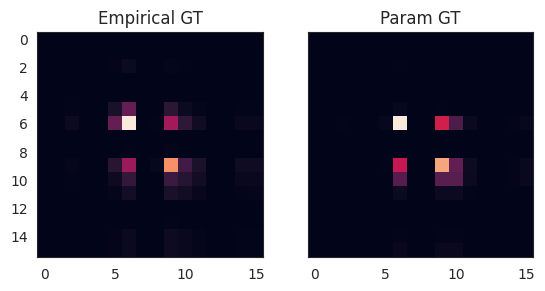



### grid n=25

d_tv: 0.3168210162753226
KL: 0.41275047310737745


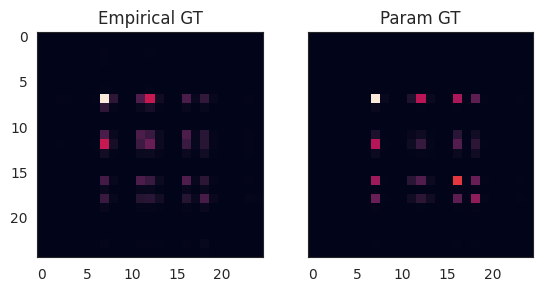

d_tv: 0.3168210162753226
KL: 0.41275047310737745


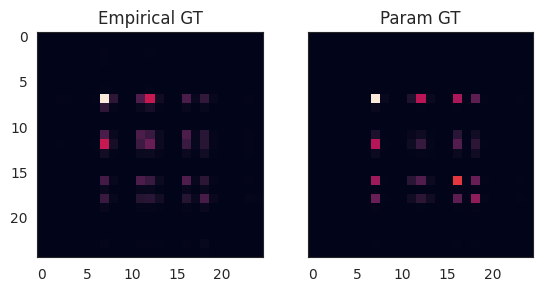

d_tv: 0.3168210162753226
KL: 0.41275047310737745


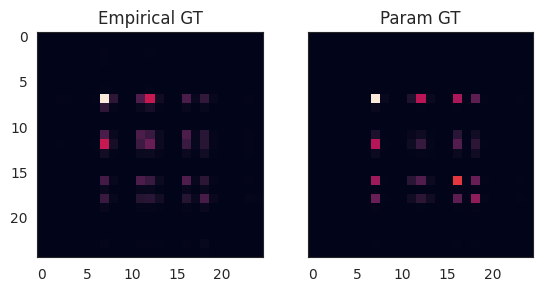

d_tv: 0.3168210162753226
KL: 0.41275047310737745


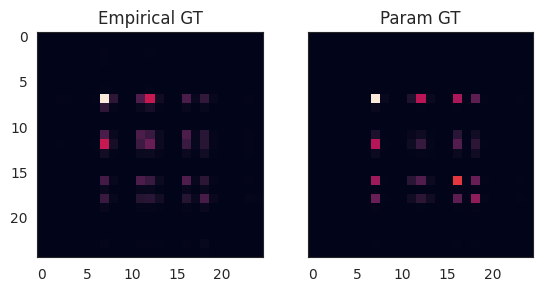

d_tv: 0.3168210162753226
KL: 0.41275047310737745


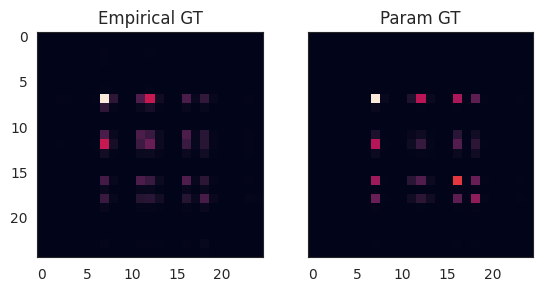

d_tv: 0.3168210162753226
KL: 0.41275047310737745


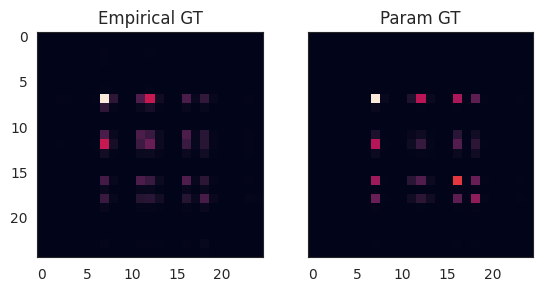

d_tv: 0.3168210162753226
KL: 0.41275047310737745


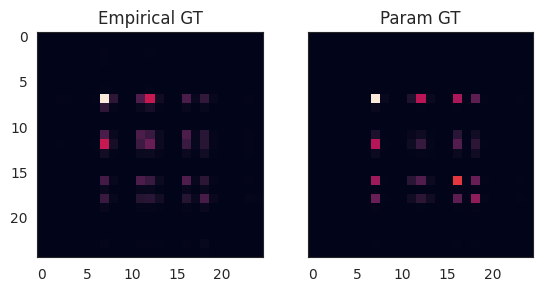

d_tv: 0.3168210162753226
KL: 0.41275047310737745


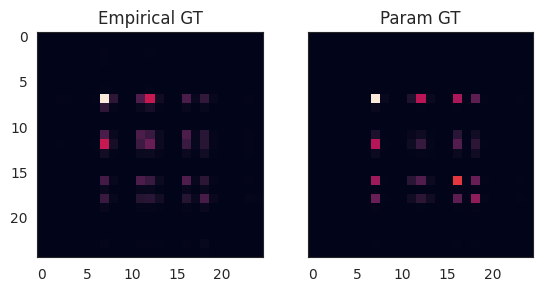

d_tv: 0.3168210162753226
KL: 0.41275047310737745


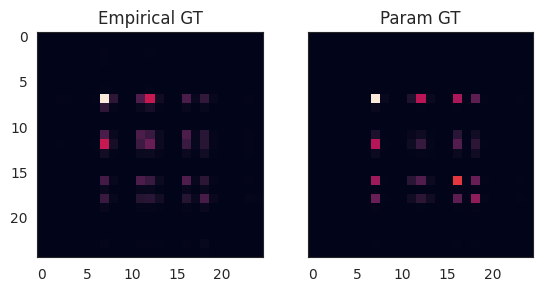

d_tv: 0.3168210162753226
KL: 0.41275047310737745


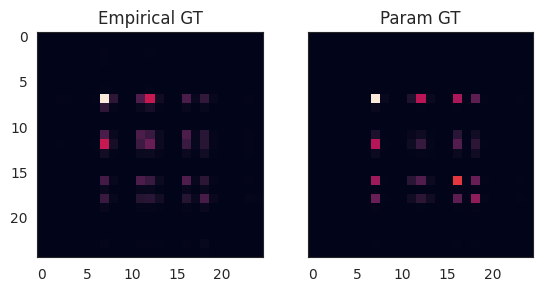



### grid n=64

d_tv: 0.2187812443565733
KL: 0.21010457206091418


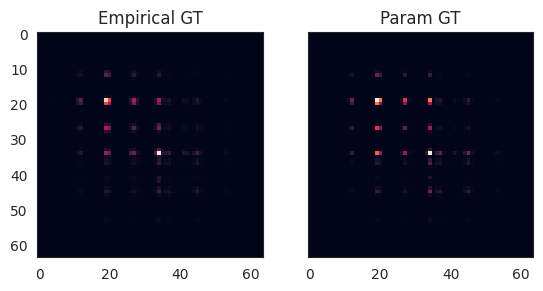

d_tv: 0.2187812443565733
KL: 0.21010457206091418


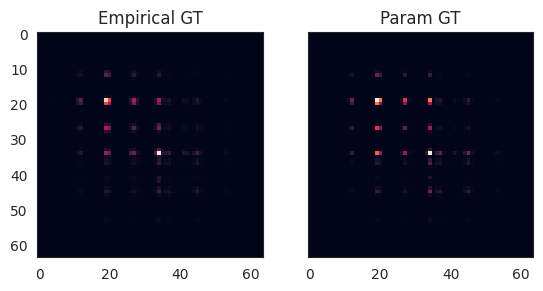

d_tv: 0.2187812443565733
KL: 0.21010457206091418


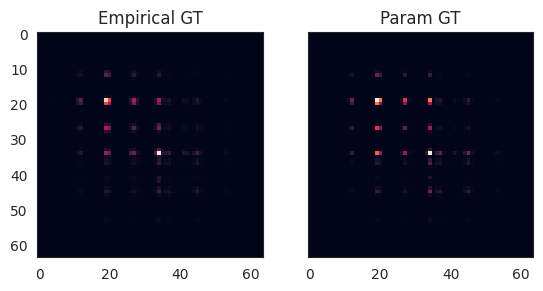

d_tv: 0.2187812443565733
KL: 0.21010457206091418


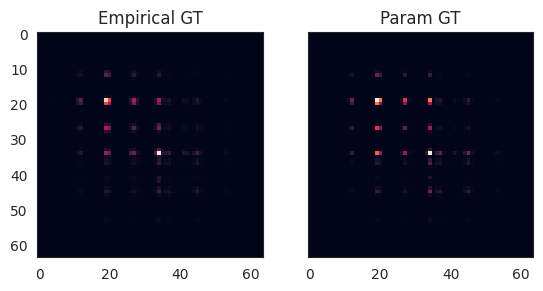

d_tv: 0.2187812443565733
KL: 0.21010457206091418


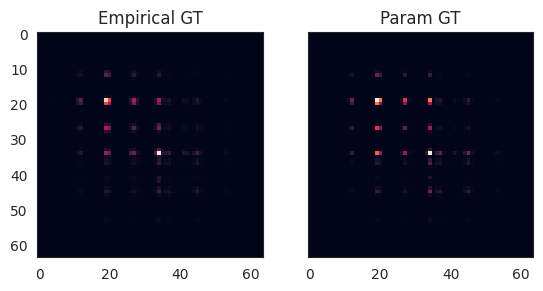

d_tv: 0.2187812443565733
KL: 0.21010457206091418


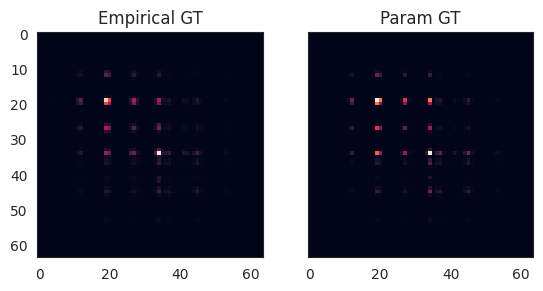

d_tv: 0.2187812443565733
KL: 0.21010457206091418


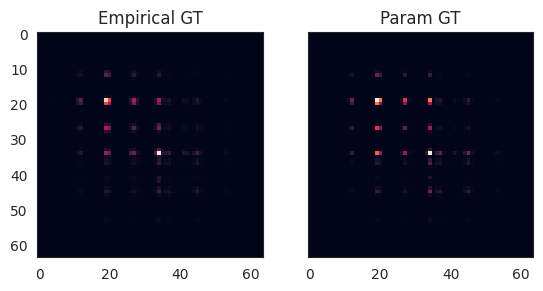

d_tv: 0.2187812443565733
KL: 0.21010457206091418


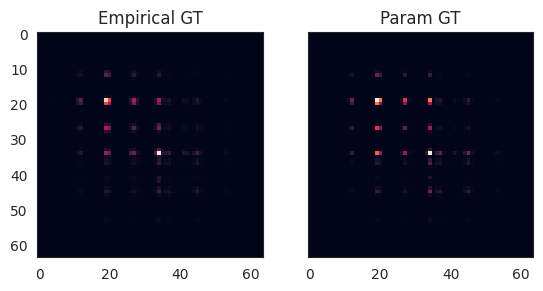

d_tv: 0.2187812443565733
KL: 0.21010457206091418


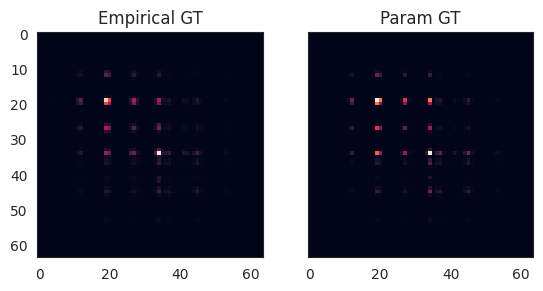

d_tv: 0.2187812443565733
KL: 0.21010457206091418


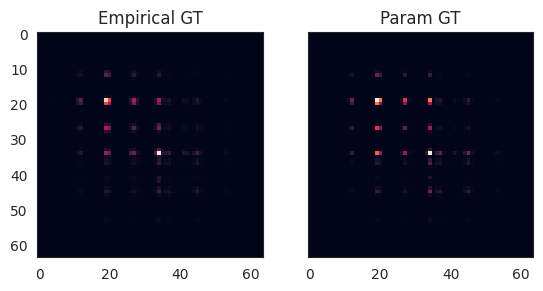



### grid n=100

d_tv: 0.13427430772344853
KL: 0.08123918203905185


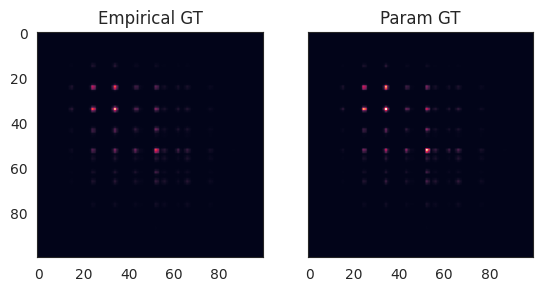

d_tv: 0.13427430772344853
KL: 0.08123918203905185


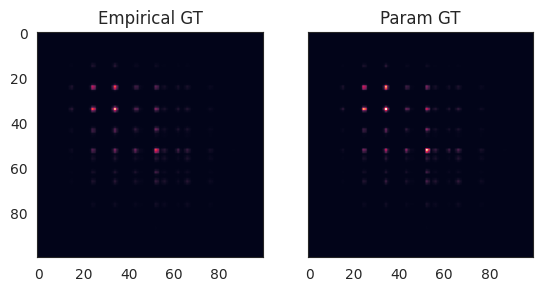

d_tv: 0.13427430772344853
KL: 0.08123918203905185


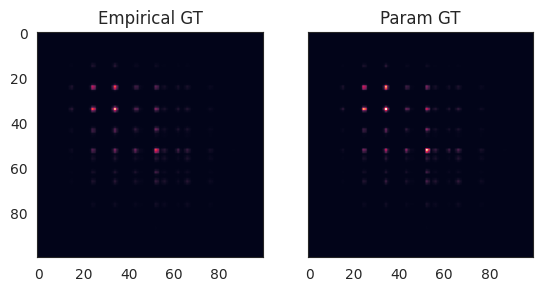

d_tv: 0.13427430772344853
KL: 0.08123918203905185


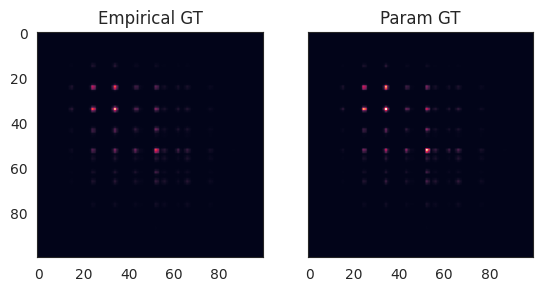

d_tv: 0.13427430772344853
KL: 0.08123918203905185


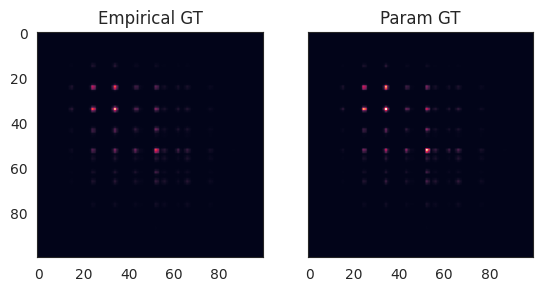

d_tv: 0.13427430772344853
KL: 0.08123918203905185


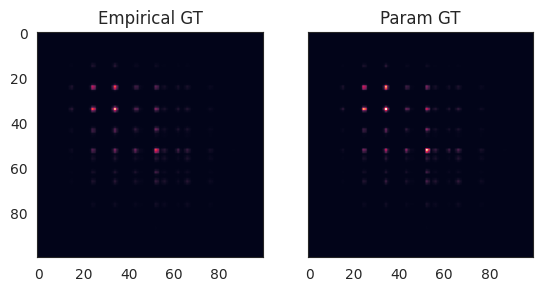

d_tv: 0.13427430772344853
KL: 0.08123918203905185


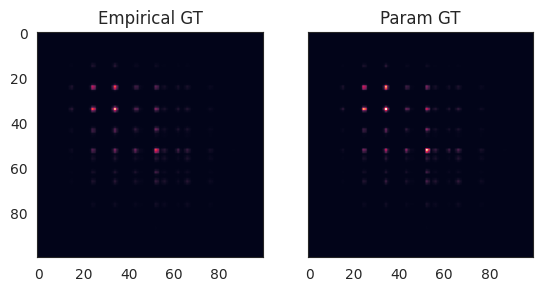

d_tv: 0.13427430772344853
KL: 0.08123918203905185


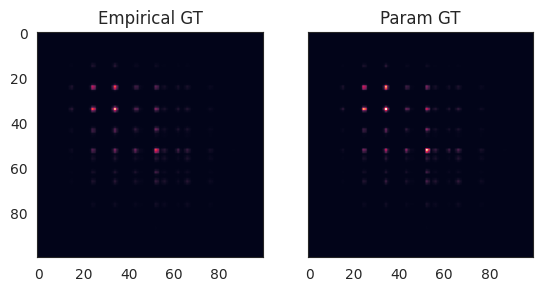

d_tv: 0.13427430772344853
KL: 0.08123918203905185


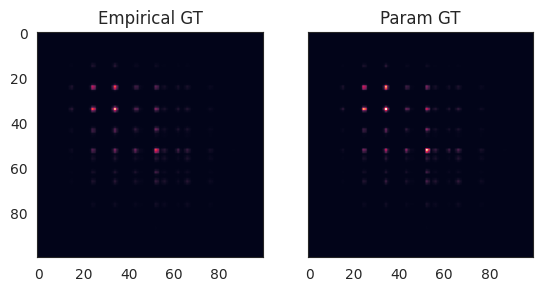

d_tv: 0.13427430772344853
KL: 0.08123918203905185


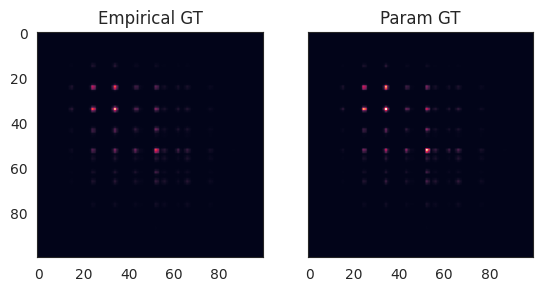



### grid n=400

d_tv: 0.05985939105204847
KL: 0.022613014358526615


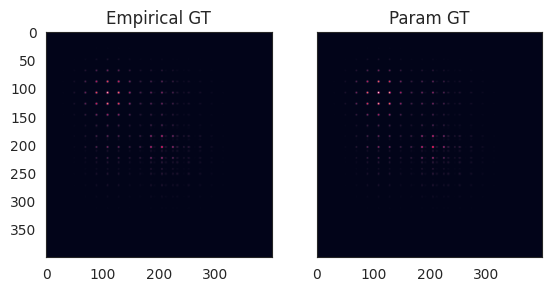

d_tv: 0.05985939105204847
KL: 0.022613014358526615


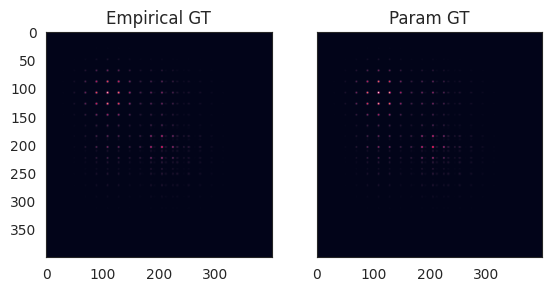

d_tv: 0.05985939105204847
KL: 0.022613014358526615


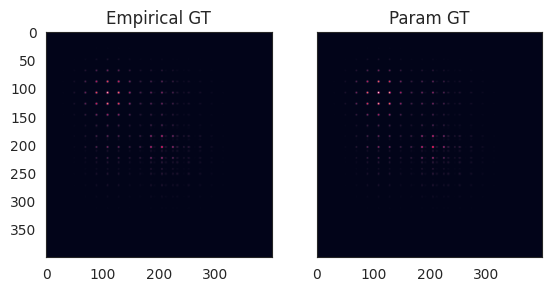

d_tv: 0.05985939105204847
KL: 0.022613014358526615


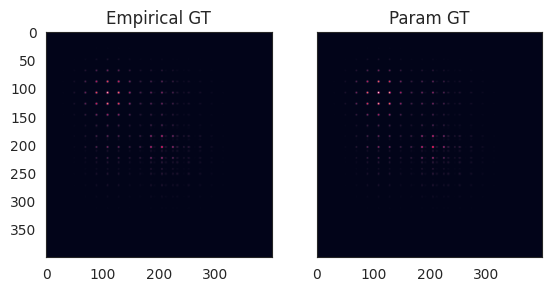

d_tv: 0.05985939105204847
KL: 0.022613014358526615


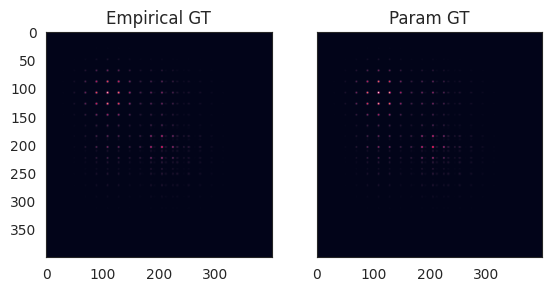

d_tv: 0.05985939105204847
KL: 0.022613014358526615


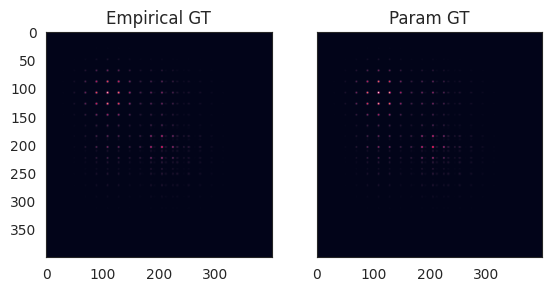

d_tv: 0.05985939105204847
KL: 0.022613014358526615


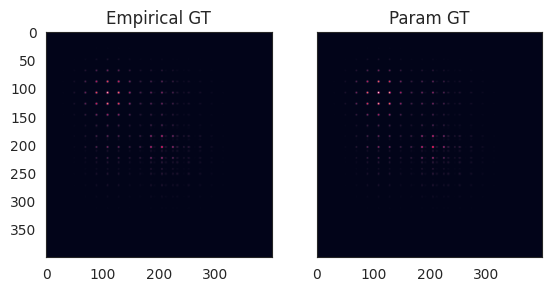

d_tv: 0.05985939105204847
KL: 0.022613014358526615


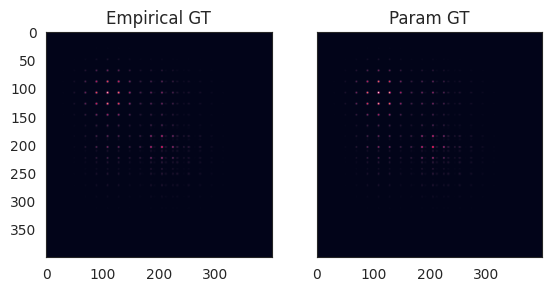

d_tv: 0.05985939105204847
KL: 0.022613014358526615


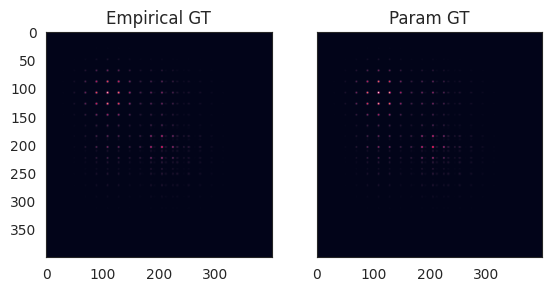

d_tv: 0.05985939105204847
KL: 0.022613014358526615


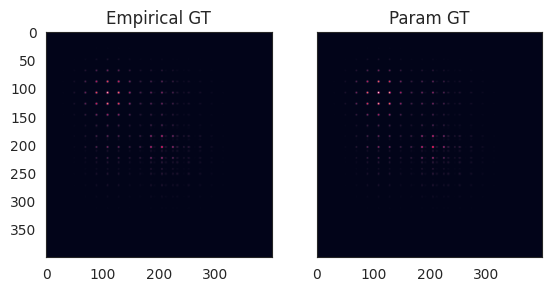



### grid n=900

d_tv: 0.08675807751937299
KL: 0.06037722152073534


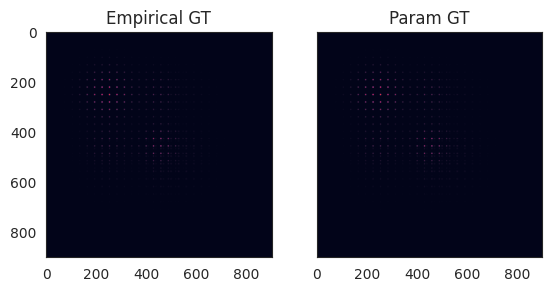

d_tv: 0.08675807751937299
KL: 0.06037722152073534


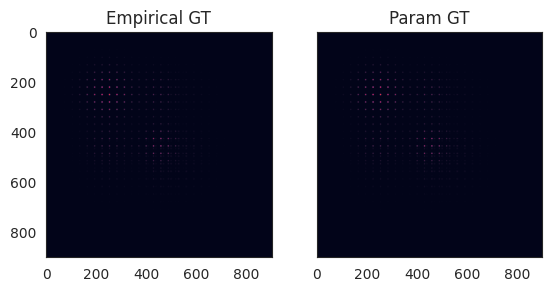

d_tv: 0.08675807751937299
KL: 0.06037722152073534


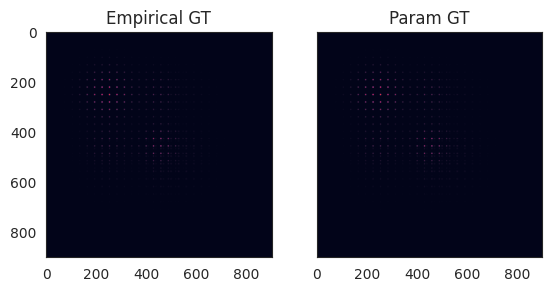

d_tv: 0.08675807751937299
KL: 0.06037722152073534


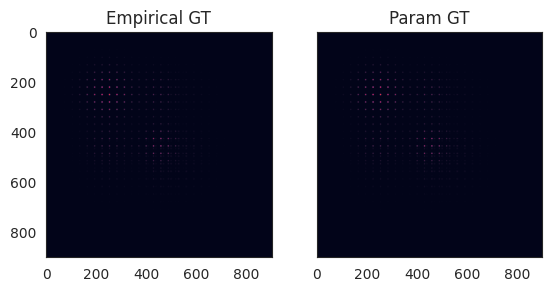

d_tv: 0.08675807751937299
KL: 0.06037722152073534


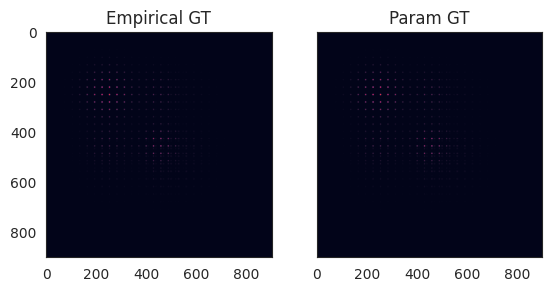

d_tv: 0.08675807751937299
KL: 0.06037722152073534


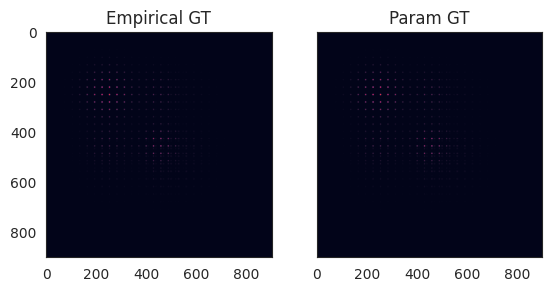

d_tv: 0.08675807751937299
KL: 0.06037722152073534


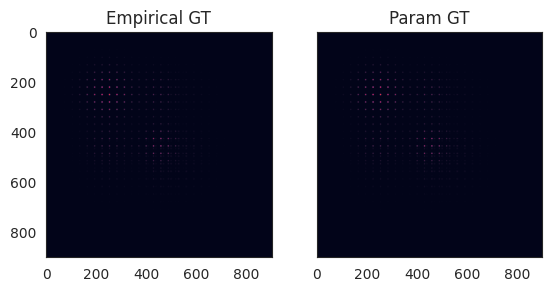

d_tv: 0.08675807751937299
KL: 0.06037722152073534


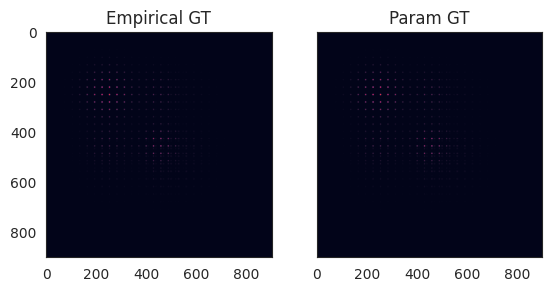

d_tv: 0.08675807751937299
KL: 0.06037722152073534


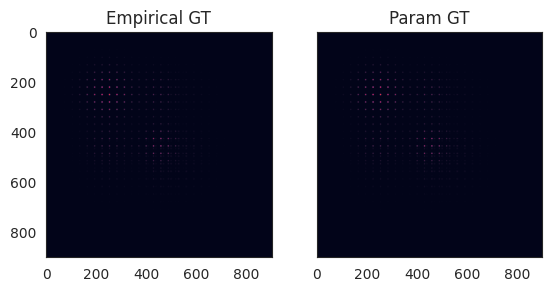

d_tv: 0.08675807751937299
KL: 0.06037722152073534


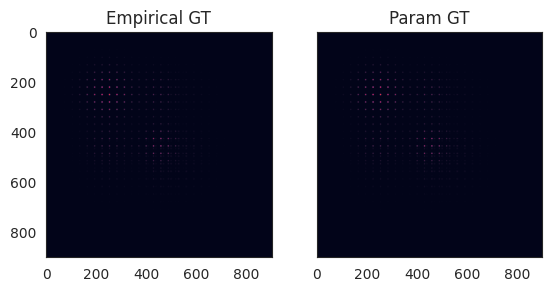

In [10]:
# TODO: znajdź gdzie jest niespójne
for discretize_meth in DISCRETIZATION_TECHNIQUES:
    display(Markdown(f"\n\n## {discretize_meth}"))
    for n in [9, 16, 25, 64, 100, 400, 900]:
        display(Markdown(f"\n\n### {discretize_meth} n={n}"))
        for i in range(10):
            fig, (ax0, ax1) = plt.subplots(1, 2, sharey=True)
            model = DiscreteHMM(discretize_meth, n, n_components=3, learning_alg='cooc', verbose=True, params="", init_params="",
                                optim_params=dict(max_epoch=50000, lr=0.1, weight_decay=0), n_iter=100)

            model.startprob_ = true_model.startprob_
            model.transmat_ = true_model.transmat_

            model.means_ = true_model.means_
            model.covars_ = true_model.covars_

            model._init(X_train)

            torch_model = model.model
            torch_model.eval()

            Xd = model.discretize(X_train, True)

            # true_model.nodes = model.nodes

            Q_cooc = model._cooccurence(Xd)
            vmin, vmax = Q_cooc.min(), Q_cooc.max()
            ax0.imshow(Q_cooc, vmin=vmin, vmax=vmax)
            ax0.set_title("Empirical GT")

            # Q_model = plot_Q_from_model(model)
            # vmin, vmax = Q_model.min(), Q_model.max()
            # ax3.imshow(Q_model, vmin=vmin, vmax=vmax)
            # ax3.set_title("Param (my) GT")

            Q_true_model = plot_Q_from_model(model)
            ax1.imshow(Q_true_model, vmin=vmin, vmax=vmax)
            ax1.set_title("Param GT")

            # Q_torch = torch_model.forward(model.nodes).detach().numpy()
            # ax2.imshow(Q_torch, vmin=vmin, vmax=vmax)
            # ax2.set_title("Torch GT")
            dtv = np.abs(Q_cooc - Q_true_model).sum() / 2
            kl = kl_divergence(Q_cooc, Q_true_model)
            print(f"d_tv: {dtv}")
            print(f"KL: {kl}")

            res.append({
                'nodes': DISCRETIZATION_TECHNIQUES,
                'no_nodes': n,
                'dtv': dtv,
                'kl': kl
            })
            # print(f"d_tv 0-2: {np.abs(Q_cooc - Q_torch).sum() / 2}")
            # print(f"d_tv 0-3: {np.abs(Q_cooc - Q_model).sum() / 2}")
            # print(f"d_tv 1-2: {np.abs(Q_true_model - Q_torch).sum() / 2}")
            # print(f"d_tv 1-3: {np.abs(Q_true_model - Q_model).sum() / 2}")
            plt.show()

In [12]:
results = pd.DataFrame(res)
results.to_csv('discretization.csv')

In [21]:
results.loc[:69, 'nodes'] = 'random'
results.loc[70:139, 'nodes'] = 'latin_cube_u'
results.loc[139:219, 'nodes'] = 'latin_cube_q'
results.loc[219:279, 'nodes'] = 'uniform'
results.loc[280:, 'nodes'] = 'grid'
results.to_csv('discretization.csv')

In [40]:
print(results.columns)

Index(['nodes', 'no_nodes', 'dtv', 'kl'], dtype='object')


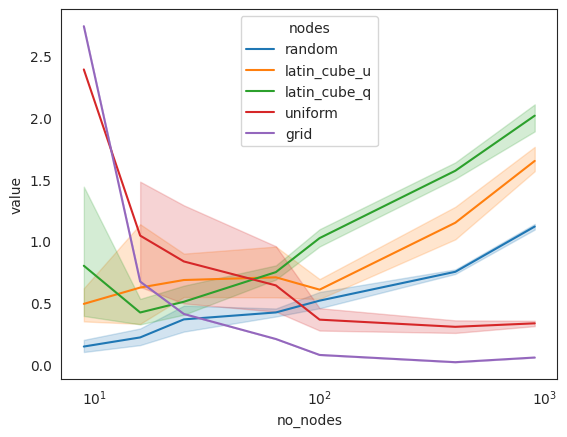

In [44]:
sns.lineplot(results.drop('dtv', axis=1).melt(id_vars=['nodes', 'no_nodes']), x='no_nodes', y = 'value', hue='nodes')
plt.xscale('log')
plt.show()
# display(results.groupby(['nodes', 'no_nodes']).std().sort_values('kl'))

# DEBUG

In [64]:
import torch
covars_torch = torch.tril(torch_model._covar_L_tensor) @ torch.transpose(
    torch.tril(torch_model._covar_L_tensor), 1, 2
)
distributions_torch = [
    torch.distributions.MultivariateNormal(torch_model._means_tensor[i], covars_torch[i])
    for i in range(torch_model.n_components)
]

B_torch = torch.nn.functional.normalize(
    torch.cat(
        [
            torch.exp(dist.log_prob(torch.Tensor(model.nodes.T))).reshape(
                1, -1
            )
            for dist in distributions_torch
        ],
        dim=0,
    ),
    dim=1, p=1
)

S_torch_ = torch.exp(torch_model._S_unconstrained)
S_torch = S_torch_ / S_torch_.sum()
Q_torch =  B_torch.T @ S_torch @ B_torch

In [74]:
plot_Q_from_model(model) - Q_numpy

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]])

In [73]:
Q_torch - torch_model.forward(model.nodes)

tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]], dtype=torch.float64)

In [65]:
S_numpy = model.transmat_ * model.startprob_[:, np.newaxis]
distributions_numpy = [
        scipy.stats.multivariate_normal(model.means_[i], model.covars_[i])
        for i in range(model.n_components)
    ]

B_numpy = np.concatenate(
        [
            dist.pdf(model.nodes.T).reshape(
                1, -1
            )
            for dist in distributions_numpy
        ],
        axis=0,
    )
B_numpy = B_numpy / B_numpy.sum(1)[:, np.newaxis]
Q_numpy = B_numpy.T @ S_numpy @ B_numpy

In [66]:
print(covars_torch)
print(model.covars_)

tensor([[[ 0.8000, -0.4000],
         [-0.4000,  0.9600]],

        [[ 0.4800, -0.4000],
         [-0.4000,  0.9600]],

        [[ 1.2000,  0.4000],
         [ 0.4000,  1.7600]]], dtype=torch.float64)
[[[ 0.8  -0.4 ]
  [-0.4   0.96]]

 [[ 0.48 -0.4 ]
  [-0.4   0.96]]

 [[ 1.2   0.4 ]
  [ 0.4   1.76]]]


In [67]:
print(torch_model._means_tensor)
print(model.means_)

Parameter containing:
tensor([[ 0.,  0.],
        [ 3., -3.],
        [ 4.,  3.]], dtype=torch.float64)
[[ 0.  0.]
 [ 3. -3.]
 [ 4.  3.]]


In [61]:
# print(torch.cat(
#         [
#             torch.exp(dist.log_prob(torch.Tensor(model.nodes.T))).reshape(
#                 1, -1
#             )
#             for dist in distributions_torch
#         ],
#         dim=0,
#     ))
# print(np.concatenate(
#         [
#             dist.pdf(model.nodes.T).reshape(
#                 1, -1
#             )
#             for dist in distributions_numpy
#         ],
#         axis=0,
#     ))

In [70]:
print(B_numpy)
print(B_torch)
print(np.max(np.abs(B_numpy - B_torch.detach().numpy())))

[[2.68568040e-03 6.61661170e-11 2.56016801e-08 3.35818987e-01
  6.11414388e-06 8.65085101e-09 1.81357146e-12 6.61486835e-01
  2.34972731e-06 4.14028733e-11]
 [2.04505223e-12 1.29581104e-33 2.76389135e-18 1.25578041e-03
  9.98744220e-01 1.02839131e-11 9.95320776e-30 3.65718998e-14
  8.30562113e-20 2.29145967e-21]
 [5.00874746e-05 5.06363998e-13 1.02043643e-05 9.99915312e-01
  3.35984892e-09 3.26944797e-11 3.38904809e-18 1.28992649e-07
  5.81215620e-11 2.42633013e-05]]
tensor([[2.6857e-03, 6.6166e-11, 2.5602e-08, 3.3582e-01, 6.1141e-06, 8.6509e-09,
         1.8136e-12, 6.6149e-01, 2.3497e-06, 4.1403e-11],
        [2.0450e-12, 1.2958e-33, 2.7639e-18, 1.2558e-03, 9.9874e-01, 1.0284e-11,
         9.9532e-30, 3.6572e-14, 8.3056e-20, 2.2915e-21],
        [5.0087e-05, 5.0636e-13, 1.0204e-05, 9.9992e-01, 3.3598e-09, 3.2694e-11,
         3.3890e-18, 1.2899e-07, 5.8122e-11, 2.4263e-05]], dtype=torch.float64)
2.899212658835637e-08


In [71]:
print(S_numpy)
print(S_torch)
print(np.max(np.abs(S_numpy - S_torch.detach().numpy())))

[[0.35    0.1     0.05   ]
 [0.09375 0.15625 0.0625 ]
 [0.05625 0.05625 0.075  ]]
tensor([[0.3500, 0.1000, 0.0500],
        [0.0938, 0.1562, 0.0625],
        [0.0563, 0.0563, 0.0750]], dtype=torch.float64)
5.551115123125783e-17


In [76]:
print(Q_numpy)
print(Q_torch)
print(np.sum(np.abs(Q_numpy - Q_torch.detach().numpy())))

[[2.53898853e-06 6.24516819e-14 1.43275379e-09 4.54981700e-04
  2.71050426e-04 8.16337452e-12 1.70984573e-15 6.23653485e-04
  2.21534400e-09 3.34935924e-09]
 [6.24394684e-14 1.53586331e-21 3.47403090e-17 1.11408531e-11
  6.63689167e-12 2.00761771e-19 4.20506107e-23 1.53376469e-11
  5.44824379e-17 8.11928363e-17]
 [1.60403116e-09 3.89601227e-17 7.83766596e-12 9.63034235e-07
  5.75835202e-07 5.07405929e-15 1.05723511e-18 3.85617872e-07
  1.36983238e-12 1.86004507e-11]
 [4.71639968e-04 1.15527782e-11 9.41856501e-07 1.50367145e-01
  8.99113647e-02 1.50830883e-09 3.15379683e-13 1.15032315e-01
  4.08622004e-07 2.22890889e-06]
 [2.54598654e-04 6.22703354e-12 6.39372189e-07 9.40567163e-02
  1.55858999e-01 8.13663035e-10 1.69812906e-13 6.19379380e-02
  2.20018960e-07 1.51456330e-06]
 [8.16104579e-12 2.00743694e-19 4.52299103e-15 1.45442454e-09
  8.67458873e-10 2.62404528e-17 5.49621301e-21 2.00470274e-09
  7.12111133e-15 1.05701265e-14]
 [1.70927805e-15 4.20448725e-23 9.41570461e-19 3.04060062e

In [22]:
torch_model._S_unconstrained_ = torch.nn.Parameter(
            torch.tensor(np.log(true_model.transmat_ * true_model.startprob_[:, np.newaxis])), requires_grad="t" in "tg"  # TODO: czemu tu był logarytm
        )
print(torch_model._S_unconstrained_)
print(np.log(S_numpy))

Parameter containing:
tensor([[-0.8675, -2.1203, -2.8134],
        [-2.4079, -1.8971, -2.8134],
        [-3.5066, -3.5066, -3.2189]], dtype=torch.float64, requires_grad=True)
[[-0.86750057 -2.12026354 -2.81341072]
 [-2.40794561 -1.89711998 -2.81341072]
 [-3.5065579  -3.5065579  -3.21887582]]


In [22]:
print(B_numpy - B_torch.detach().numpy())

[[ 1.40913462e-09 -4.12525333e-10  8.15885197e-08 -3.51324444e-03
   2.69078478e-07  9.08039205e-05  1.54767024e-03 -4.12860939e-10
   1.95391418e-03 -7.94951484e-05]
 [ 5.60556856e-19 -4.09940780e-23  2.84512105e-01 -7.54821640e-04
   7.07212527e-01  1.60893273e-16 -9.90951487e-01 -1.83774227e-05
   3.03875083e-08  2.24123527e-08]
 [-6.77235719e-02  1.00662132e-01 -7.17674803e-02 -3.17710144e-01
  -1.87044415e-03  1.04719944e-10  3.60323743e-01  6.62998154e-04
  -2.57620513e-03 -1.02725508e-06]]


In [12]:
# S = torch.exp(torch.nn.Parameter(
#             torch.tensor(np.log(true_model.transmat_ * true_model.startprob_[:, np.newaxis])), requires_grad="t" in "tg"  # TODO: czemu tu był logarytm
#         ))
S /= S.sum()
print(S)

tensor([[0.4200, 0.1200, 0.0600],
        [0.0900, 0.1500, 0.0600],
        [0.0300, 0.0300, 0.0400]], dtype=torch.float64, grad_fn=<DivBackward0>)


# Compare GT from data and GT from paramters for different nodes selections

transmat: [[0.7 0.2 0.1]
 [0.3 0.5 0.2]
 [0.3 0.3 0.4]]
startprob: [0.5    0.3125 0.1875]
transmat: [[0.7 0.2 0.1]
 [0.3 0.5 0.2]
 [0.3 0.3 0.4]]
startprob: [0.5    0.3125 0.1875]
Nodes have been already set. Use force=True to update them
Nodes have been already set. Use force=True to update them
Nodes have been already set. Use force=True to update them
Nodes have been already set. Use force=True to update them
d_tv 0-1: 0.324998302164128
Nodes have been already set. Use force=True to update them
d_tv 0-2: 0.28133419583459907
d_tv 1-2: 0.14943324188017285


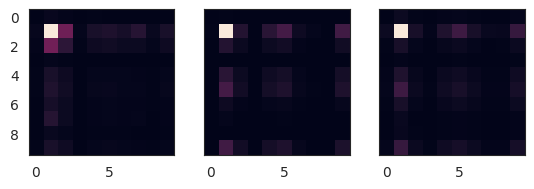

transmat: [[0.7 0.2 0.1]
 [0.3 0.5 0.2]
 [0.3 0.3 0.4]]
startprob: [0.5    0.3125 0.1875]
transmat: [[0.7 0.2 0.1]
 [0.3 0.5 0.2]
 [0.3 0.3 0.4]]
startprob: [0.5    0.3125 0.1875]
Nodes have been already set. Use force=True to update them
Nodes have been already set. Use force=True to update them
Nodes have been already set. Use force=True to update them
Nodes have been already set. Use force=True to update them
d_tv 0-1: 0.5688009347939155
Nodes have been already set. Use force=True to update them
d_tv 0-2: 0.11570933268233777
d_tv 1-2: 0.47185732366159755


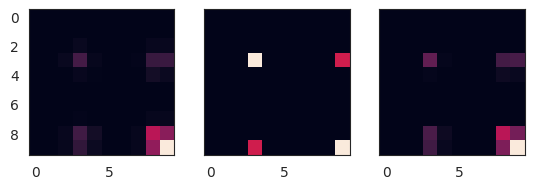

transmat: [[0.7 0.2 0.1]
 [0.3 0.5 0.2]
 [0.3 0.3 0.4]]
startprob: [0.5    0.3125 0.1875]
transmat: [[0.7 0.2 0.1]
 [0.3 0.5 0.2]
 [0.3 0.3 0.4]]
startprob: [0.5    0.3125 0.1875]
Nodes have been already set. Use force=True to update them
Nodes have been already set. Use force=True to update them
Nodes have been already set. Use force=True to update them
Nodes have been already set. Use force=True to update them
d_tv 0-1: 0.4991421761269389
Nodes have been already set. Use force=True to update them
d_tv 0-2: 0.129367502291725
d_tv 1-2: 0.4988712678162988


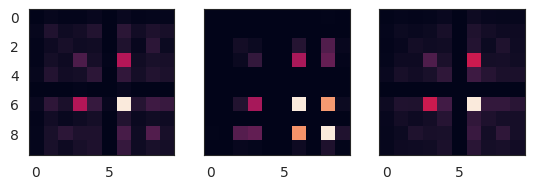

transmat: [[0.7 0.2 0.1]
 [0.3 0.5 0.2]
 [0.3 0.3 0.4]]
startprob: [0.5    0.3125 0.1875]
transmat: [[0.7 0.2 0.1]
 [0.3 0.5 0.2]
 [0.3 0.3 0.4]]
startprob: [0.5    0.3125 0.1875]
Nodes have been already set. Use force=True to update them
Nodes have been already set. Use force=True to update them
Nodes have been already set. Use force=True to update them
Nodes have been already set. Use force=True to update them
d_tv 0-1: 0.4394100184663863
Nodes have been already set. Use force=True to update them
d_tv 0-2: 0.18268178406871136
d_tv 1-2: 0.47051810662232585


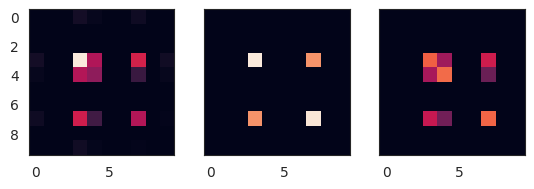

In [63]:
# TODO: znajdź gdzie jest niespójne
results = []
for _ in range(1):
    for discretize_meth in DISCRETIZATION_TECHNIQUES:
        fig, (ax0, ax1, ax2) = plt.subplots(1, 3, sharey=True, sharex=True)
        model = DiscreteHMM(discretize_meth, 10, n_components=3, learning_alg='cooc', verbose=True, params="", init_params="",
                            optim_params=dict(max_epoch=50000, lr=0.1, weight_decay=0), n_iter=100)

        model.startprob_ = true_model.compute_stationary(np.array([[0.7, 0.2, 0.1],
                                    [0.3, 0.5, 0.2],
                                    [0.3, 0.3, 0.4]]))
        model.transmat_ = np.array([[0.7, 0.2, 0.1],
                                    [0.3, 0.5, 0.2],
                                    [0.3, 0.3, 0.4]])

        model.means_ = np.array([[0.0, 0.0], [3.0, -3.0], [4.0, 3.0]])
        model.covars_ = np.array([[[1, -.5], [-.5, 1.2]], [[.6, -.5], [-.5, 1.2]], [[1.5, .5], [.5, 2.2]]]) * .8

        model._init(X_train)
        torch_inits = dict(
            n_components=model.n_components, n_dim=X_train.shape[1], trainable=model.params
        )

        torch_inits["means_"] = model.means_
        torch_inits["covars_"] = model.covars_
        torch_inits["startprob_"] = model.compute_stationary(np.array([[0.7, 0.2, 0.1],
                                    [0.3, 0.5, 0.2],
                                    [0.3, 0.3, 0.4]]))
        torch_inits["transmat_"] = model.transmat_
        torch_inits["trainable"] = ""

        torch_model =  HmmOptim(**torch_inits)
        torch_model.eval()

        model.discretize(X_train, True)

        Z_hat = model.predict(X_test)
        Z_hat = find_permutation(np.concatenate([Z_test, np.array([0, 1, 2])]), np.concatenate([Z_hat, np.array([0, 1, 2])]))[Z_hat]

        results.append({
            'discretize_meth': discretize_meth,
            'accuracy': (Z_hat == Z_test).mean(),
            'transmat_dtv': total_variance_dist(model.transmat_, true_model.transmat_),
            'means_diff': np.abs(model.means_, true_model.means_).sum(),
            'covars_diff': np.abs(model.covars_, true_model.covars_).sum(),
            'loglikelihood': model.score(X_test)
        })

        true_model.nodes = model.nodes
        vmin, vmax = model._cooccurence(model.discretize(X_train, force=False)).min(), model._cooccurence(model.discretize(X_train, force=False)).max()
        ax0.imshow(model._cooccurence(model.discretize(X_train, force=False)), vmin=vmin, vmax=vmax)
        ax1.imshow(plot_Q_from_model(true_model), vmin=vmin, vmax=vmax)
        ax2.imshow(torch_model.forward(model.nodes).detach().numpy(), vmin=vmin, vmax=vmax)
        print(f"d_tv 0-1: {np.abs(plot_Q_from_model(true_model) - model._cooccurence(model.discretize(X_train, force=False))).sum() / 2}")
        print(f"d_tv 0-2: {np.abs(model._cooccurence(model.discretize(X_train, force=False)) - torch_model.forward(model.nodes).detach().numpy()).sum() / 2}")
        print(f"d_tv 1-2: {np.abs(plot_Q_from_model(true_model) - torch_model.forward(model.nodes).detach().numpy()).sum() / 2}")
        plt.show()

In [16]:
S = model.transmat_ * model.startprob_[:, np.newaxis]
print(S)

[[0.42 0.12 0.06]
 [0.09 0.15 0.06]
 [0.03 0.03 0.04]]


In [17]:
torch_model.get_model_params()

(array([[ 0.,  0.],
        [ 3., -3.],
        [ 4.,  3.]]),
 array([[[ 0.8 , -0.4 ],
         [-0.4 ,  0.96]],
 
        [[ 0.48, -0.4 ],
         [-0.4 ,  0.96]],
 
        [[ 1.2 ,  0.4 ],
         [ 0.4 ,  1.76]]]),
 array([[0.8115942 , 0.14492754, 0.04347826],
        [0.43636364, 0.45454545, 0.10909091],
        [0.47058824, 0.29411765, 0.23529412]]),
 array([0.39428571, 0.31428571, 0.29142857]))

In [18]:
import torch
torch_model._S_unconstrained = torch.nn.Parameter(
            torch.tensor(np.log(model.transmat_ * model.startprob_)), requires_grad=True  # TODO: czemu tu był logarytm
        )
Ss = torch_model._S_unconstrained
print(Ss)


Parameter containing:
tensor([[-0.8675, -2.8134, -4.6052],
        [-1.7148, -1.8971, -3.9120],
        [-1.7148, -2.4079, -3.2189]], dtype=torch.float64, requires_grad=True)


In [26]:
S = model.transmat_ * model.startprob_[:, np.newaxis]
scipy.special.softmax(np.log(S))

array([[0.42, 0.12, 0.06],
       [0.09, 0.15, 0.06],
       [0.03, 0.03, 0.04]])

In [22]:
S = torch.softmax(Ss, dim=1)
print(Ss)
print(S.detach().numpy())

Parameter containing:
tensor([[-0.8675, -2.8134, -4.6052],
        [-1.7148, -1.8971, -3.9120],
        [-1.7148, -2.4079, -3.2189]], dtype=torch.float64, requires_grad=True)
[[0.85714286 0.12244898 0.02040816]
 [0.51428571 0.42857143 0.05714286]
 [0.58064516 0.29032258 0.12903226]]


In [20]:
torch_model.get_model_params()

(array([[ 0.,  0.],
        [ 3., -3.],
        [ 4.,  3.]]),
 array([[[ 0.8 , -0.4 ],
         [-0.4 ,  0.96]],
 
        [[ 0.48, -0.4 ],
         [-0.4 ,  0.96]],
 
        [[ 1.2 ,  0.4 ],
         [ 0.4 ,  1.76]]]),
 array([[0.85714286, 0.12244898, 0.02040816],
        [0.51428571, 0.42857143, 0.05714286],
        [0.58064516, 0.29032258, 0.12903226]]),
 array([0.42608696, 0.30434783, 0.26956522]))

em random


/ziob/klaudia/miniconda3/envs/preproc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
Even though the 'transmat_' attribute is set, it will be overwritten during initialization because 'init_params' contains 't'
Even though the 'means_' attribute is set, it will be overwritten during initialization because 'init_params' contains 'm'
/ziob/klaudia/miniconda3/envs/preproc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
Even though the 'covars_' attribute is set, it will be overwritten during initialization because 'init_params' contains 'c'
         1     -455395.7297             +nan
         2     -407669.4436      +47726.2860
         3     -3

cooc random
Nodes have been already set. Use force=True to update them


         1     -503646.4466             +nan
         2     -499839.4111       +3807.0355
         3     -496718.0114       +3121.3997
         4     -494146.6123       +2571.3991
         5     -492016.8586       +2129.7537
         6     -490242.8185       +1774.0401
         7     -488756.5398       +1486.2787
         8     -487504.2769       +1252.2629
         9     -486443.4195       +1060.8574
        10     -485540.0549        +903.3646
        11     -484767.0617        +772.9931
        12     -484102.6312        +664.4305
        13     -483529.1242        +573.5070
        14     -483032.1887        +496.9354
        15     -482600.0772        +432.1115
        16     -482223.1165        +376.9607
        17     -481893.2954        +329.8211
        18     -481603.9416        +289.3538
        19     -481349.4681        +254.4735
        20     -481125.1720        +224.2961
        21     -480927.0753        +198.0967
        22     -480751.7974        +175.2779
        23

Nodes have been already set. Use force=True to update them


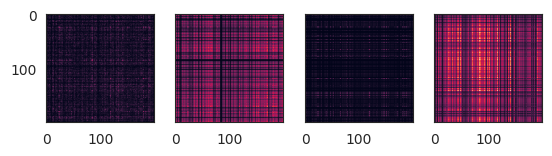

em latin_cube_u


/ziob/klaudia/miniconda3/envs/preproc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
Even though the 'transmat_' attribute is set, it will be overwritten during initialization because 'init_params' contains 't'
Even though the 'means_' attribute is set, it will be overwritten during initialization because 'init_params' contains 'm'
/ziob/klaudia/miniconda3/envs/preproc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
Even though the 'covars_' attribute is set, it will be overwritten during initialization because 'init_params' contains 'c'
         1     -431888.6830             +nan
         2     -402789.9915      +29098.6915
         3     -3

cooc latin_cube_u
Nodes have been already set. Use force=True to update them


         1     -482825.1058             +nan
         2     -475343.8227       +7481.2831
         3     -468519.0071       +6824.8156
         4     -462437.9234       +6081.0837
         5     -457271.5434       +5166.3800
         6     -453373.2773       +3898.2661
         7     -451777.0919       +1596.1854
         8     -456027.9041       -4250.8122
         9     -465612.5777       -9584.6736
        10     -470871.2097       -5258.6320
        11     -481303.1364      -10431.9267
        12     -503590.3117      -22287.1753
        13     -535328.5465      -31738.2348
        14     -556060.7746      -20732.2282
        15     -572120.8157      -16060.0411
        16     -579196.2603       -7075.4446
        17     -580081.3354        -885.0751
        18     -579834.2080        +247.1274
        19     -579477.7143        +356.4937
        20     -579153.0446        +324.6697
        21     -578875.4995        +277.5450
        22     -578640.8748        +234.6247
        23

Nodes have been already set. Use force=True to update them


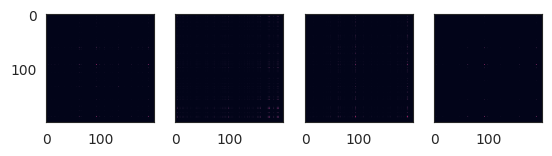

em latin_cube_q


/ziob/klaudia/miniconda3/envs/preproc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
Even though the 'transmat_' attribute is set, it will be overwritten during initialization because 'init_params' contains 't'
Even though the 'means_' attribute is set, it will be overwritten during initialization because 'init_params' contains 'm'
/ziob/klaudia/miniconda3/envs/preproc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
Even though the 'covars_' attribute is set, it will be overwritten during initialization because 'init_params' contains 'c'
         1     -397055.4919             +nan
         2     -352862.3343      +44193.1576
         3     -3

cooc latin_cube_q
Nodes have been already set. Use force=True to update them


         1     -451605.6930             +nan
         2     -450831.4194        +774.2735
         3     -450236.7001        +594.7193
         4     -449775.3522        +461.3479
         5     -449413.9433        +361.4089
         6     -449128.1138        +285.8295
         7     -448899.9786        +228.1352
         8     -448716.2961        +183.6825
         9     -448567.1770        +149.1191
        10     -448445.1699        +122.0070
        11     -448344.6113        +100.5586
        12     -448261.1590         +83.4523
        13     -448191.4564         +69.7026
        14     -448132.8873         +58.5691
        15     -448083.3972         +49.4901
        16     -448041.3602         +42.0370
        17     -448005.4807         +35.8796
        18     -447974.7187         +30.7620
        19     -447948.2344         +26.4843
        20     -447925.3451         +22.8893
        21     -447905.4924         +19.8527
        22     -447888.2170         +17.2754
        23

Nodes have been already set. Use force=True to update them


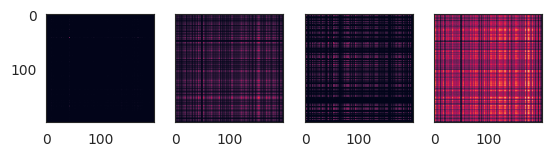

em uniform


/ziob/klaudia/miniconda3/envs/preproc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
Even though the 'transmat_' attribute is set, it will be overwritten during initialization because 'init_params' contains 't'
Even though the 'means_' attribute is set, it will be overwritten during initialization because 'init_params' contains 'm'
/ziob/klaudia/miniconda3/envs/preproc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
Even though the 'covars_' attribute is set, it will be overwritten during initialization because 'init_params' contains 'c'
         1     -493500.1586             +nan
         2     -419751.9945      +73748.1641
         3     -4

cooc uniform
Nodes have been already set. Use force=True to update them


         1     -441903.8207             +nan
         2     -438447.4623       +3456.3583
         3     -435357.6692       +3089.7931
         4     -432842.4313       +2515.2379
         5     -431106.4906       +1735.9406
         6     -430102.1970       +1004.2936
         7     -431122.0770       -1019.8800
         8     -440415.5466       -9293.4696
         9     -452910.4011      -12494.8545
        10     -460675.9187       -7765.5175
        11     -464904.5212       -4228.6025
        12     -467337.1069       -2432.5857
        13     -468862.5930       -1525.4861
        14     -469897.6232       -1035.0302
        15     -470646.1315        -748.5083
        16     -471214.7450        -568.6136
        17     -471663.0437        -448.2987
        18     -472026.4455        -363.4017
        19     -472327.2268        -300.7813
        20     -472580.1262        -252.8995
        21     -472795.3411        -215.2148
        22     -472980.2056        -184.8645
        23

Nodes have been already set. Use force=True to update them


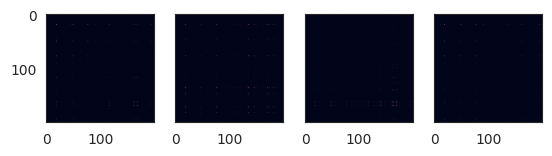

em random


/ziob/klaudia/miniconda3/envs/preproc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
Even though the 'transmat_' attribute is set, it will be overwritten during initialization because 'init_params' contains 't'
Even though the 'means_' attribute is set, it will be overwritten during initialization because 'init_params' contains 'm'
/ziob/klaudia/miniconda3/envs/preproc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
Even though the 'covars_' attribute is set, it will be overwritten during initialization because 'init_params' contains 'c'
         1     -432886.3063             +nan
         2     -375968.2125      +56918.0938
         3     -3

cooc random
Nodes have been already set. Use force=True to update them


         1     -456857.7350             +nan
         2     -456160.6328        +697.1022
         3     -455558.7639        +601.8689
         4     -455038.5706        +520.1933
         5     -454588.3630        +450.2077
         6     -454198.0960        +390.2670
         7     -453859.1761        +338.9200
         8     -453564.2767        +294.8993
         9     -453307.1661        +257.1106
        10     -453082.5487        +224.6175
        11     -452885.9245        +196.6242
        12     -452713.4674        +172.4571
        13     -452561.9201        +151.5473
        14     -452428.5050        +133.4151
        15     -452310.8492        +117.6558
        16     -452206.9210        +103.9282
        17     -452114.9771         +91.9439
        18     -452033.5179         +81.4591
        19     -451961.2507         +72.2672
        20     -451897.0579         +64.1928
        21     -451839.9711         +57.0867
        22     -451789.1495         +50.8216
        23

Nodes have been already set. Use force=True to update them


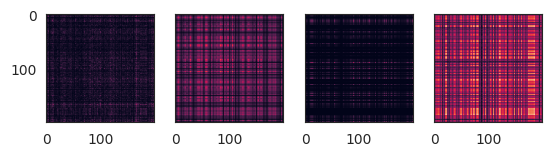

em latin_cube_u


/ziob/klaudia/miniconda3/envs/preproc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
Even though the 'transmat_' attribute is set, it will be overwritten during initialization because 'init_params' contains 't'
Even though the 'means_' attribute is set, it will be overwritten during initialization because 'init_params' contains 'm'
/ziob/klaudia/miniconda3/envs/preproc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
Even though the 'covars_' attribute is set, it will be overwritten during initialization because 'init_params' contains 'c'
         1     -442207.7989             +nan
         2     -387902.3242      +54305.4747
         3     -3

cooc latin_cube_u
Nodes have been already set. Use force=True to update them


         1     -536771.3196             +nan
         2     -513535.8786      +23235.4411
         3     -497967.0546      +15568.8239
         4     -487990.8016       +9976.2530
         5     -481505.6521       +6485.1495
         6     -477353.7002       +4151.9519
         7     -475207.3608       +2146.3395
         8     -475406.9353        -199.5745
         9     -478353.8979       -2946.9626
        10     -483558.9859       -5205.0880
        11     -490024.7391       -6465.7532
        12     -496681.4406       -6656.7015
        13     -502592.2951       -5910.8545
        14     -507362.4391       -4770.1440
        15     -511083.2601       -3720.8210
        16     -514009.2543       -2925.9942
        17     -516368.2107       -2358.9564
        18     -518319.6849       -1951.4742
        19     -519967.7235       -1648.0387
        20     -521380.1942       -1412.4707
        21     -522602.9498       -1222.7555
        22     -523668.5906       -1065.6409
        23

Nodes have been already set. Use force=True to update them


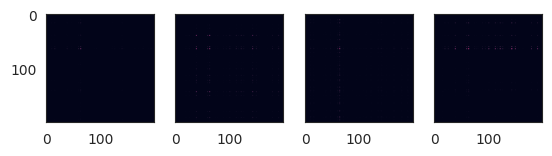

em latin_cube_q


/ziob/klaudia/miniconda3/envs/preproc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
Even though the 'transmat_' attribute is set, it will be overwritten during initialization because 'init_params' contains 't'
Even though the 'means_' attribute is set, it will be overwritten during initialization because 'init_params' contains 'm'
/ziob/klaudia/miniconda3/envs/preproc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
Even though the 'covars_' attribute is set, it will be overwritten during initialization because 'init_params' contains 'c'
         1     -424722.4947             +nan
         2     -378063.6590      +46658.8357
         3     -3

cooc latin_cube_q
Nodes have been already set. Use force=True to update them


         1     -460246.2950             +nan
         2     -459147.1330       +1099.1620
         3     -458276.7623        +870.3707
         4     -457580.9471        +695.8152
         5     -457019.4316        +561.5155
         6     -456562.2266        +457.2050
         7     -456186.8286        +375.3979
         8     -455876.2009        +310.6277
         9     -455617.3224        +258.8785
        10     -455400.1461        +217.1763
        11     -455216.8475        +183.2986
        12     -455061.2787        +155.5689
        13     -454928.5677        +132.7110
        14     -454814.8233        +113.7445
        15     -454716.9134         +97.9098
        16     -454632.2997         +84.6138
        17     -454558.9104         +73.3893
        18     -454495.0444         +63.8660
        19     -454439.2961         +55.7483
        20     -454390.4977         +48.7984
        21     -454347.6735         +42.8242
        22     -454310.0043         +37.6692
        23

Nodes have been already set. Use force=True to update them


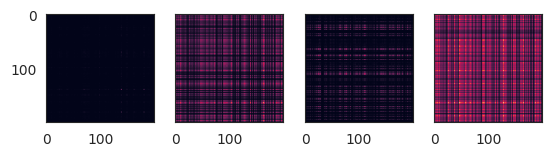

em uniform


/ziob/klaudia/miniconda3/envs/preproc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
Even though the 'transmat_' attribute is set, it will be overwritten during initialization because 'init_params' contains 't'
Even though the 'means_' attribute is set, it will be overwritten during initialization because 'init_params' contains 'm'
/ziob/klaudia/miniconda3/envs/preproc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
Even though the 'covars_' attribute is set, it will be overwritten during initialization because 'init_params' contains 'c'
         1     -468237.1652             +nan
         2     -423677.1136      +44560.0516
         3     -4

cooc uniform
Nodes have been already set. Use force=True to update them


         1     -495818.1687             +nan
         2     -488224.2431       +7593.9256
         3     -481646.2697       +6577.9734
         4     -476063.0734       +5583.1962
         5     -471385.4447       +4677.6287
         6     -467485.8514       +3899.5933
         7     -464229.8998       +3255.9515
         8     -461495.6218       +2734.2780
         9     -459180.7693       +2314.8525
        10     -457203.0250       +1977.7443
        11     -455497.2889       +1705.7361
        12     -454012.3459       +1484.9431
        13     -452707.8743       +1304.4715
        14     -451552.0564       +1155.8179
        15     -450519.7508       +1032.3056
        16     -449591.0988        +928.6520
        17     -448750.4328        +840.6659
        18     -447985.3986        +765.0342
        19     -447286.2393        +699.1593
        20     -446645.2149        +641.0244
        21     -446056.1361        +589.0788
        22     -445513.9939        +542.1423
        23

Nodes have been already set. Use force=True to update them


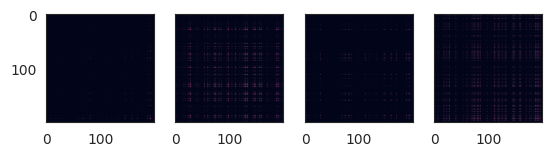

em random


/ziob/klaudia/miniconda3/envs/preproc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
Even though the 'transmat_' attribute is set, it will be overwritten during initialization because 'init_params' contains 't'
Even though the 'means_' attribute is set, it will be overwritten during initialization because 'init_params' contains 'm'
/ziob/klaudia/miniconda3/envs/preproc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
Even though the 'covars_' attribute is set, it will be overwritten during initialization because 'init_params' contains 'c'
         1     -515608.8025             +nan
         2     -376698.8714     +138909.9310
         3     -3

cooc random
Nodes have been already set. Use force=True to update them


         1     -529917.8546             +nan
         2     -526074.4399       +3843.4147
         3     -522712.0703       +3362.3696
         4     -519772.6516       +2939.4187
         5     -517203.5602       +2569.0914
         6     -514957.6453       +2245.9150
         7     -512993.0739       +1964.5714
         8     -511273.0421       +1720.0318
         9     -509765.3900       +1507.6521
        10     -508442.1624       +1323.2276
        11     -507279.1516       +1163.0108
        12     -506255.4475       +1023.7041
        13     -505353.0149        +902.4327
        14     -504556.3063        +796.7086
        15     -503851.9167        +704.3895
        16     -503228.2798        +623.6369
        17     -502675.4036        +552.8762
        18     -502184.6430        +490.7606
        19     -501748.5054        +436.1376
        20     -501360.4842        +388.0212
        21     -501014.9181        +345.5661
        22     -500706.8707        +308.0474
        23

Nodes have been already set. Use force=True to update them


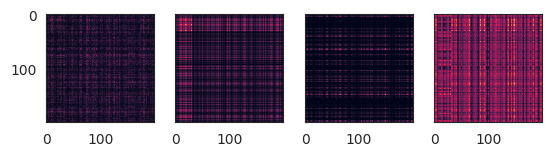

em latin_cube_u


/ziob/klaudia/miniconda3/envs/preproc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
Even though the 'transmat_' attribute is set, it will be overwritten during initialization because 'init_params' contains 't'
Even though the 'means_' attribute is set, it will be overwritten during initialization because 'init_params' contains 'm'
/ziob/klaudia/miniconda3/envs/preproc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
Even though the 'covars_' attribute is set, it will be overwritten during initialization because 'init_params' contains 'c'
         1     -441332.0190             +nan
         2     -404131.3265      +37200.6926
         3     -3

cooc latin_cube_u
Nodes have been already set. Use force=True to update them


         1     -540611.5151             +nan
         2     -537133.6287       +3477.8864
         3     -533648.6565       +3484.9722
         4     -530056.9788       +3591.6776
         5     -526344.6947       +3712.2841
         6     -522608.0498       +3736.6449
         7     -519021.8783       +3586.1715
         8     -515757.8857       +3263.9926
         9     -512916.0120       +2841.8737
        10     -510513.9884       +2402.0236
        11     -508515.9614       +1998.0270
        12     -506864.2285       +1651.7329
        13     -505498.8961       +1365.3325
        14     -504366.5340       +1132.3620
        15     -503422.6146        +943.9195
        16     -502631.2011        +791.4134
        17     -501963.6969        +667.5042
        18     -501397.4451        +566.2518
        19     -500914.4757        +482.9694
        20     -500500.4767        +413.9990
        21     -500143.9815        +356.4952
        22     -499835.7399        +308.2416
        23

Nodes have been already set. Use force=True to update them


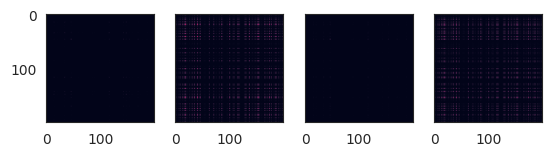

em latin_cube_q


/ziob/klaudia/miniconda3/envs/preproc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
Even though the 'transmat_' attribute is set, it will be overwritten during initialization because 'init_params' contains 't'
Even though the 'means_' attribute is set, it will be overwritten during initialization because 'init_params' contains 'm'
/ziob/klaudia/miniconda3/envs/preproc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
Even though the 'covars_' attribute is set, it will be overwritten during initialization because 'init_params' contains 'c'
         1     -423089.0237             +nan
         2     -375557.2894      +47531.7342
         3     -3

cooc latin_cube_q
Nodes have been already set. Use force=True to update them


         1     -556279.3730             +nan
         2     -550806.1092       +5473.2639
         3     -546308.3012       +4497.8080
         4     -542516.2266       +3792.0746
         5     -539275.9559       +3240.2706
         6     -536485.2725       +2790.6834
         7     -534069.0899       +2416.1826
         8     -531968.8391       +2100.2509
         9     -530137.2531       +1831.5859
        10     -528535.4372       +1601.8159
        11     -527131.0069       +1404.4303
        12     -525896.7878       +1234.2191
        13     -524809.8463       +1086.9415
        14     -523850.7371        +959.1091
        15     -523002.9052        +847.8319
        16     -522252.2026        +750.7026
        17     -521586.4960        +665.7066
        18     -520995.3441        +591.1519
        19     -520469.7330        +525.6110
        20     -520001.8570        +467.8760
        21     -519584.9366        +416.9204
        22     -519213.0673        +371.8693
        23

In [ ]:
# results = []
# for _ in range(10):
#     for discretize_meth in DISCRETIZATION_TECHNIQUES:
#         nodes = None
#         fig, (ax0, ax1, ax2, ax3) = plt.subplots(1, 4, sharey=True, sharex=True)
#         for learning_alg, ax in zip(LEARNING_ALGORITHMS, [ax2, ax3]):
#             print(learning_alg, discretize_meth)
#             model = DiscreteHMM(discretize_meth, 200, n_components=3, learning_alg=learning_alg, verbose=True,
#                                 optim_params=dict(max_epoch=50000, lr=0.1, weight_decay=0), n_iter=100)
#             if nodes is not None:
#                 model.nodes = nodes
#             model.fit(X_train)
#             Z_hat = model.predict(X_test)
#             Z_hat = find_permutation(np.concatenate([Z_test, np.array([0, 1, 2])]), np.concatenate([Z_hat, np.array([0, 1, 2])]))[Z_hat]
#
#             results.append({
#                 'learning_alg': learning_alg,
#                 'discretize_meth': discretize_meth,
#                 'accuracy': (Z_hat == Z_test).mean(),
#                 'transmat_dtv': total_variance_dist(model.transmat_, true_model.transmat_),
#                 'means_diff': np.abs(model.means_, true_model.means_).sum(),
#                 'covars_diff': np.abs(model.covars_, true_model.covars_).sum(),
#                 'loglikelihood': model.score(X_test)
#             })
#             nodes = model.nodes
#             ax.imshow(plot_Q_from_model(model))
#         true_model.nodes = nodes
#         ax0.imshow(model._cooccurence(model.discretize(X_train, force=False)))
#         ax1.imshow(plot_Q_from_model(true_model))
#         plt.show()


In [ ]:
def det (a):
    return a[0, 0] * a[1, 1] - a[1, 0] * a[0, 1]

[det(model.covars_[i]) for i in range(3)]
model.covars_[2]

In [ ]:
pd.DataFrame(results)

In [ ]:
results

# TODO: recheck cavariance learning in HmmOptim!
# TODO: recheck Latin cube

# Porównaj na tych samych węzłach

# Dla pustych węzłów - 0 w macierzy kowariancji - przekaż parametr z liczbą węzłów
# Dodaj dyskretyzację gridem


Symulacyjne dane wielowielowymiarowe

In [ ]:
pd.DataFrame(results).to_csv('results_1904_v2.csv')